In [1]:
import warnings
warnings.simplefilter("ignore")
import pypsa
import time
import logging
import numpy as np
import os 
import sys
import yaml
import pyomo.environ as pyomo_env
import pandas as pd
from scipy.spatial import ConvexHull,  Delaunay
from scipy.interpolate import griddata
from multiprocessing import Lock, Process, Queue, current_process
import queue # imported for using queue.Empty exception
sys.path.append(os.getcwd())
import plotly.graph_objects as go
import plotly.figure_factory as ff
warnings.simplefilter("ignore")

In [2]:

network = pypsa.Network()
network.import_from_hdf5('PyPSA_project/data/networks/euro_00')
dim = 2

bus_list = ['DK','SE','NO','DE','PL','CZ','NL','AT','CH']

bus_list = bus_list[:dim]

for bus in network.buses.index:
    if bus not in bus_list:
        network.remove('Bus',name=bus)
        network.remove('Load',bus)

for link in network.links.index:
    if not (network.links.loc[link].bus0 in bus_list and network.links.loc[link].bus1 in bus_list ):
        network.remove('Link',link)

for generator in network.generators.index:
    if not network.generators.loc[generator].bus in bus_list:
        network.remove('Generator',generator)
        
for generator in network.generators.index:
    if network.generators.loc[generator].type == 'solar':
        network.remove('Generator',generator)

network.snapshots = network.snapshots[0:10]

INFO:pypsa.io:Imported network euro_00 has buses, carriers, generators, global_constraints, links, loads


In [3]:
network.remove('Generator','DK onwind')
#network.remove('Generator','DK ocgt')
network.remove('Generator','SE offwind')
#network.remove('Generator','NO offwind')
#network.remove('Generator','NO onwind')

In [4]:
network.generators

,bus,control,type,p_nom_extendable,p_nom_max,carrier,marginal_cost,capital_cost,efficiency,min_up_time,...,p_set,q_set,sign,committable,start_up_cost,shut_down_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
name,,,,,,,,,,,,,,,,,,,,,
DK offwind,DK,PQ,wind,True,1.013904e+05,offwind,0.020000,295041.156155,1.00,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
DK ocgt,DK,PQ,ocgt,True,inf,ocgt,58.384615,47234.561404,0.39,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
SE onwind,SE,Slack,wind,True,3.024149e+05,onwind,0.015000,136428.031355,1.00,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
SE ocgt,SE,PQ,ocgt,True,inf,ocgt,58.384615,47234.561404,0.39,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0


### Initial solution

In [5]:

network.lopf(network.snapshots, 
            solver_name='gurobi'),

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi
INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1018292097.4585688
  Upper bound: 1018292097.4585688
  Number of objectives: 1
  Number of constraints: 142
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 261
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

(('ok', 'optimal'),)

(<matplotlib.collections.PathCollection at 0x254d3362b70>,
 <matplotlib.collections.LineCollection at 0x254d3362f28>)

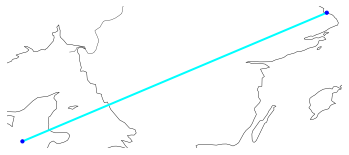

In [6]:
network.plot()

In [7]:
co2_emission = [constraint.body() for constraint in network.model.global_constraints.values()][0]
co2_emission
network.remove('GlobalConstraint',"co2_limit")
target = (1-0.60)*co2_emission
network.add("GlobalConstraint","co2_limit",
      sense="<=",
      carrier_attribute="co2_emissions",
      constant=target)


In [8]:
network.lopf(network.snapshots, 
            solver_name='gurobi')
old_objective_value = network.model.objective()

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi
INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3129634268.487316
  Upper bound: 3129634268.487316
  Number of objectives: 1
  Number of constraints: 142
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 261
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

In [9]:
network.generators.p_nom_opt
inital_solution = []
"""
for var_type in ['ocgt','wind','solar']:
    filter1 = network.generators.type==var_type
    inital_solution.append(sum(network.generators.p_nom_opt[filter1]))
    """
inital_solution = network.generators.p_nom_opt
inital_solution

name
DK offwind        0.000000
DK ocgt        3780.000000
SE onwind     19242.427111
SE ocgt        6798.323117
Name: p_nom_opt, dtype: float64

### Function definitions

In [10]:
def direction_search(network, snapshots,options,direction): #  MGA_slack = 0.05, point=[0,0,0],dim=3,old_objective_value=0):
# Identify the nonzero decision variables that should enter the MGA objective function.
    old_objective_value = options['old_objective_value']
    dim = options['dim']
    MGA_slack = 0.1

    if dim == 3:
        generators = [gen_p for gen_p in network.model.generator_p_nom]
        types = ['ocgt','wind','olar']
        variables = []
        for i in range(3):
            gen_p_type = [gen_p  for gen_p in generators if gen_p[-4:]==types[i]]
            variables.append(sum([network.model.generator_p_nom[gen_p] for gen_p in gen_p_type]))
            
                             
    elif dim == 2:
        generators = [gen_p for gen_p in network.model.generator_p_nom]
        types = ['ocgt','wind','olar']
        variables = []
        for i in range(3):
            gen_p_type = [gen_p  for gen_p in generators if gen_p[-4:]==types[i]]
            variables.append(sum([network.model.generator_p_nom[gen_p] for gen_p in gen_p_type]))
        slack = 0    
        point = options['point']
        #point = inital_solution
        print(variables[0]== point[0])
        network.model.ocgt_constraint_u = pyomo_env.Constraint(expr=variables[0]== point[0])
        #network.model.ocgt_constraint_l = pyomo_env.Constraint(expr=variables[0]>= inital_solution[0]+1000-slack)
        network.model.wind_constraint_u = pyomo_env.Constraint(expr=variables[1]== point[1])
        #network.model.wind_constraint_l = pyomo_env.Constraint(expr=variables[1]>= inital_solution[1]+1000-slack)
        #network.model.solar_constraint_u = pyomo_env.Constraint(expr=variables[2]== point[2])
        #network.model.solar_constraint_l = pyomo_env.Constraint(expr=variables[2]>= inital_solution[2]+1000-slack)
        """                                                     
        variables = []
        for bus in network.buses.index:
            var = []
            for generator in network.model.generator_p_nom:
                if network.generators.loc[generator].type == 'wind' and network.generators.loc[generator].bus == bus :
                    var.append(network.model.generator_p_nom[generator])
            variables.append(sum(var))
            print(sum(var))    """       
        variables = [network.model.generator_p_nom[gen_p] for gen_p in network.model.generator_p_nom]
                             
    else :
        variables = [network.model.generator_p_nom[gen_p] for gen_p in network.model.generator_p_nom]
        
    objective = 0
    for i in range(len(variables)):
        #print(variables[i])
        objective += direction[i]*variables[i]

    print(objective)
    # Add the new MGA objective function to the model.
    #objective += network.model.objective.expr * 1e-9
    network.model.mga_objective = pyomo_env.Objective(expr=objective)
    # Deactivate the old objective function and activate the MGA objective function.
    network.model.objective.deactivate()
    network.model.mga_objective.activate()
    # Add the MGA slack constraint.
    network.model.mga_constraint = pyomo_env.Constraint(expr=network.model.objective.expr <= 
                                          (1 + MGA_slack) * old_objective_value)


In [11]:
def rand_split(n):
    
    rand_list = np.random.random(n-1)
    rand_list.sort()
    rand_list = np.concatenate([[0],rand_list,[1]])
    rand_list = np.diff(rand_list)

    return rand_list

def create_interior_points(hull,m):
    #m = 20

    # Generate Delunay triangulation of hull
    try :
        tri = Delaunay(hull.points[hull.vertices])#,qhull_options='Qs')#,qhull_options='A-0.999')
    except : 
        points = np.append(hull.points[hull.vertices],[np.mean(hull.points,axis=0)],axis=0)            
        tri = Delaunay(points,qhull_options='Qs')
    # Distribute number of points based on simplex size 
    tri.volumes = []
    for i in range(len(tri.simplices)):
        try :
            tri.volumes.append(ConvexHull(tri.points[tri.simplices[i,:]]).volume)
        except : 
            tri.volumes.append(0)
    tri.volumes = np.array(tri.volumes)
    tri.volumes_norm = tri.volumes/sum(tri.volumes)

    tri.n_points_in_tri =  (tri.volumes_norm*m).astype(int)
    # Generate interrior points of each simplex
    interrior_points = []
    for i in range(len(tri.simplices)):
        tri_face = tri.points[tri.simplices[i,:]]
        for j in range(tri.n_points_in_tri[i]):
            dim = len(tri.points[0,:])
            rand_list = rand_split(dim+1)

            new_point = sum([face*rand_n for face,rand_n in zip(tri_face,rand_list)])
            interrior_points.append(new_point)
    interrior_points = np.array(interrior_points)
    return interrior_points

### MGA with $\sum$ variables

In [12]:
#logging.disable()
data_detail_sum = []
options = dict(dim=3,old_objective_value=old_objective_value)
dim=2
old_volume = 0
epsilon = 1
while epsilon > 0.01:
    data_detail = list(data_detail_sum)
    if len(data_detail_sum)<=1 : # if only original solution exists, max/min directions are chosen
        directions = np.concatenate([np.diag(np.ones(dim)),-np.diag(np.ones(dim))],axis=0)
    else : # Otherwise search in directions normal to faces
        directions = np.array(hull.equations)[:,0:-1]
    # Itterate over directions in batch 
    for direction in directions:
        print(direction)
        direction = np.concatenate([direction,[0]])
        network.lopf(network.snapshots,                                 
                        solver_name='gurobi',                                 
                        extra_functionality=lambda network,                                 
                        snapshots: direction_search(network,snapshots,options,direction))

        var = []
        for var_type in ['ocgt','wind']:#,'solar']:
            filter1 = network.generators.type==var_type
            var.append(sum(network.generators.p_nom_opt[filter1]))
        data_detail_sum.append(var)
    

    hull = ConvexHull(data_detail_sum)#,qhull_options='QJ')
    
    delta_v = hull.volume - old_volume
    old_volume = hull.volume
    epsilon = delta_v/hull.volume
    
    print(epsilon)


data_detail_sum = np.array(data_detail_sum)

[1. 0.]


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9018.017738986468
  Upper bound: 9018.017738986468
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17191.44250924993
  Upper bound: 17191.44250924993
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.opf:Solving model using gurobi


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17204.052615371722
  Upper bound: -17204.052615371722
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.opf:Solving model using gurobi


- (generator_p_nom[DK offwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -22084.35619537062
  Upper bound: -22084.35619537062
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.opf:Solving model using gurobi


0.3279659486562104*(generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]) + 0.944689545047489*(generator_p_nom[DK offwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19539.4530269248
  Upper bound: 19539.4530269248
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.opf:Solving model using gurobi


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20830.49008121463
  Upper bound: -20830.49008121463
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.opf:Solving model using gurobi


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18739.215856637704
  Upper bound: -18739.215856637704
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

In [13]:
hull_sum = ConvexHull(data_detail_sum)
interior_points_sum = create_interior_points(hull_sum,2000)

In [14]:
fig = go.Figure()



fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))

fig.add_trace(go.Scatter(x=data_detail_sum[:,1],
                          y=data_detail_sum[:,0],
                          #z=data_detail_sum[:,2],
                          mode='markers',name='MGA solutions'))

fig.add_trace(go.Scatter(y=[inital_solution[1]+inital_solution[3]],
                          x=[inital_solution[0]+inital_solution[2]],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Initial_solution'))

fig.add_trace(go.Scatter(x=interior_points_sum[:,1],
                          y=interior_points_sum[:,0],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Interrior_points'))
fig.update_yaxes(title_text='$x_2+x_4$')
fig.update_xaxes(title_text='$x_1+x_3$')


In [15]:
import matplotlib.pyplot as plt
import matplotlib
import scipy.stats as stats
matplotlib.rcParams.update({'font.size': 18})
def plot_hist(ax,x,w=[] ,color='C1'):
    if len(w)<=0 :
        w = np.ones(len(x))
    kde1 = stats.gaussian_kde(x*1e-3,weights=w)
    xx = np.linspace(7, 23, 1000)
    ax.hist(x=x*1e-3,stacked=False,weights=w,bins=20,density=True,histtype='stepfilled', alpha=0.5,color=color);
    ax.plot(xx, kde1(xx),color=color)
    return ax

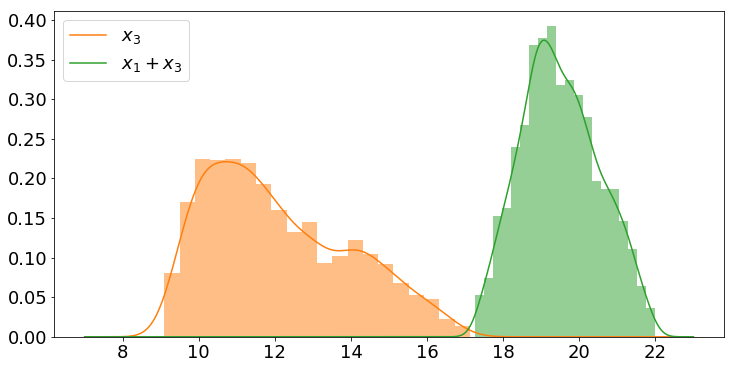

In [16]:
fig, ax = plt.subplots(figsize=(12,6))
ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax.legend(['$x_3$','$x_1+x_3$']);


### Multiplicity MGA

In [17]:
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.dot(v1_u, v2_u))

In [18]:
#sample_points = create_interior_points(hull_sum,50)
#sample_points = np.concatenate([data_detail_sum,sample_points])

sample_points = np.concatenate([data_detail_sum,interior_points_sum])

In [19]:
weights = []
for point in sample_points : 
    data_detail = []
    dim = 4
    old_volume = 0
    epsilon = 1
    while epsilon > 0.05:
        if len(data_detail)<=1 : # if only original solution exists, max/min directions are chosen
            test = np.array([[0,1,0,-1],[1,0,-1,0]])
            directions = np.concatenate([test,-test],axis=0)
        else : # Otherwise search in directions normal to faces
            directions = np.array(hull.equations)[:,0:-1]
        # Itterate over directions in batch 
        for direction in directions:
            #print(direction)
            network = network.copy()
            #options = dict(dim=2,old_objective_value=old_objective_value,point=data_detail_sum[1,:])
            options = dict(dim=2,old_objective_value=old_objective_value,point=point)
            network.lopf(network.snapshots,                                 
                            solver_name='gurobi',                                 
                            extra_functionality=lambda network,                                 
                            snapshots: direction_search(network,snapshots,options,direction),
                            solver_options=dict(threads=4,method=2))

            var = []
            for country in bus_list:
                filter1 = network.generators.bus==country
                filter2 = network.generators.type=='wind'
                filter = [a and b for a,b in zip(filter1,filter2)]
                var.append(sum(network.generators.p_nom_opt[filter]))
            data_detail.append(network.generators.p_nom_opt.values)
        #hull = ConvexHull(data_detail)#,qhull_options='QJ')

        #delta_v = hull.volume - old_volume
        #old_volume = hull.volume
        #epsilon = delta_v/hull.volume
        epsilon = 0
        print(epsilon)


    data_detail = np.array(data_detail)

    direction = directions[0]
    vector = data_detail[0]-data_detail[2]
    len1 = abs(np.dot(vector, direction) / np.linalg.norm(direction))

    direction = directions[1]
    vector = data_detail[1]-data_detail[3]
    len2 = abs(np.dot(vector, direction) / np.linalg.norm(direction))

    weight = len1*len2
    weights.append(weight)

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986468
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1458.0177389864948
  Upper bound: -1458.0177389864948
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986468
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -22084.356195370616
  Upper bound: -22084.356195370616
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986468
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1458.0177389864416
  Upper bound: 1458.0177389864416
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986468
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 22084.35619537061
  Upper bound: 22084.35619537061
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.59613678815
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10058.59613678815
  Upper bound: -10058.59613678815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.59613678815
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9725.49663760428
  Upper bound: -9725.49663760428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.59613678815
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8997.240922924542
  Upper bound: 8997.240922924542
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.59613678815
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9725.496637604276
  Upper bound: 9725.496637604276
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371722
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9644.052615371751
  Upper bound: -9644.052615371751
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371722
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19242.427110793364
  Upper bound: -19242.427110793364
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371722
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3607.406381738132
  Upper bound: -3607.406381738132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371722
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19242.427110793356
  Upper bound: 19242.427110793356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1458.0177389864766
  Upper bound: -1458.0177389864766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -22084.35619537062
  Upper bound: -22084.35619537062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1458.0177389864543
  Upper bound: 1458.0177389864543
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 22084.35619537062
  Upper bound: 22084.35619537062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.596136788154
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10058.596136788154
  Upper bound: -10058.596136788154
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.596136788154
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9725.496637604294
  Upper bound: -9725.496637604294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.596136788154
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8997.240922924488
  Upper bound: 8997.240922924488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10058.596136788154
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9725.49663760429
  Upper bound: 9725.49663760429
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371715
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9644.052615371751
  Upper bound: -9644.052615371751
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371715
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19242.427110793364
  Upper bound: -19242.427110793364
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371715
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3607.406381738132
  Upper bound: -3607.406381738132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17204.052615371715
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19242.427110793356
  Upper bound: 19242.427110793356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1458.0177389864766
  Upper bound: -1458.0177389864766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -22084.35619537062
  Upper bound: -22084.35619537062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1458.0177389864543
  Upper bound: 1458.0177389864543
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9018.017738986466
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 22084.35619537062
  Upper bound: 22084.35619537062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11062.378311181772
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7828.617564255805
  Upper bound: -7828.617564255805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11062.378311181772
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20475.342787987833
  Upper bound: -20475.342787987833
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11062.378311181772
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3145.787632357271
  Upper bound: -3145.787632357271
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11062.378311181772
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18930.571936435557
  Upper bound: 18930.571936435557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13308.952691707249
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9316.402781497693
  Upper bound: -9316.402781497693
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13308.952691707249
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19853.13039539917
  Upper bound: -19853.13039539917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13308.952691707249
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3950.3458489133245
  Upper bound: -3950.3458489133245
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13308.952691707249
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18579.30049587153
  Upper bound: 18579.30049587153
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16782.63468728843
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9536.199074737702
  Upper bound: -9536.199074737702
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16782.63468728843
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19323.550624074116
  Upper bound: -19323.550624074116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16782.63468728843
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3588.6313861862764
  Upper bound: -3588.6313861862764
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16782.63468728843
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19211.58614465419
  Upper bound: 19211.58614465419
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.66807197398
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10281.66807197398
  Upper bound: -10281.66807197398
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.66807197398
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18011.24080912715
  Upper bound: -18011.24080912715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.66807197398
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3890.7024638850253
  Upper bound: -3890.7024638850253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.66807197398
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15203.377024719512
  Upper bound: 15203.377024719512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.198230191458
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11253.198230191458
  Upper bound: -11253.198230191458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.198230191458
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15401.20842749732
  Upper bound: -15401.20842749732
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.198230191458
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -581.8559095501805
  Upper bound: -581.8559095501805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.198230191458
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13441.15556796467
  Upper bound: 13441.15556796467
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.442981336266
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10204.0801999912
  Upper bound: -10204.0801999912
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.442981336266
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19717.578762986337
  Upper bound: -19717.578762986337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.442981336266
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4689.179341514937
  Upper bound: -4689.179341514937
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.442981336266
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18001.272143076563
  Upper bound: 18001.272143076563
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10657.00678159122
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10657.00678159122
  Upper bound: -10657.00678159122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10657.00678159122
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11157.715158033145
  Upper bound: -11157.715158033145
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10657.00678159122
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6766.646759537898
  Upper bound: 6766.646759537898
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10657.00678159122
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10597.644375548145
  Upper bound: 10597.644375548145
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10811.512391215676
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10811.512391215676
  Upper bound: -10811.512391215676
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10811.512391215676
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14977.58181544657
  Upper bound: -14977.58181544657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10811.512391215676
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -104.36907132075976
  Upper bound: -104.36907132075976
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10811.512391215676
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12929.345463910126
  Upper bound: 12929.345463910126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10848.570145405622
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10848.570145405622
  Upper bound: -10848.570145405622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10848.570145405622
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11763.303020385778
  Upper bound: -11763.303020385778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10848.570145405622
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5789.302562906963
  Upper bound: 5789.302562906963
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10848.570145405622
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11066.67301233429
  Upper bound: 11066.67301233429
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.879471737864
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8989.04183128655
  Upper bound: -8989.04183128655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.879471737864
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19876.88961018683
  Upper bound: -19876.88961018683
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.879471737864
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3649.073959690644
  Upper bound: -3649.073959690644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.879471737864
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18833.472690207993
  Upper bound: 18833.472690207993
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11593.864167602755
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11593.864167602755
  Upper bound: -11593.864167602755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11593.864167602755
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17513.353671099143
  Upper bound: -17513.353671099143
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11593.864167602755
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4210.047770992453
  Upper bound: -4210.047770992453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11593.864167602755
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14882.83113844837
  Upper bound: 14882.83113844837
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.245235719942
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11334.813591396049
  Upper bound: -11334.813591396049
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.245235719942
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16693.940826127604
  Upper bound: -16693.940826127604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.245235719942
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1618.6226296794248
  Upper bound: -1618.6226296794248
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.245235719942
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15377.029046966463
  Upper bound: 15377.029046966463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12971.561537414094
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11993.433411875267
  Upper bound: -11993.433411875267
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12971.561537414094
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17967.605971412024
  Upper bound: -17967.605971412024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12971.561537414094
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4116.1802929373625
  Upper bound: -4116.1802929373625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12971.561537414094
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15970.801574938474
  Upper bound: 15970.801574938474
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.613369267248
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7400.142661913629
  Upper bound: -7400.142661913629
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.613369267248
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20639.598499524967
  Upper bound: -20639.598499524967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.613369267248
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2897.675478291667
  Upper bound: -2897.675478291667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.613369267248
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19055.089298070445
  Upper bound: 19055.089298070445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.704260528375
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8435.400287786208
  Upper bound: -8435.400287786208
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.704260528375
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20172.95072270727
  Upper bound: -20172.95072270727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.704260528375
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3420.525500700389
  Upper bound: -3420.525500700389
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.704260528375
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18863.325992351423
  Upper bound: 18863.325992351423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10042.354554228667
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9785.196819905326
  Upper bound: -9785.196819905326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10042.354554228667
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19777.609834033185
  Upper bound: -19777.609834033185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10042.354554228667
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4197.478371827612
  Upper bound: -4197.478371827612
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10042.354554228667
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17281.21194670365
  Upper bound: 17281.21194670365
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16730.48460955102
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9738.091447147312
  Upper bound: -9738.091447147312
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16730.48460955102
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18657.88089960558
  Upper bound: -18657.88089960558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16730.48460955102
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2857.468166182236
  Upper bound: -2857.468166182236
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16730.48460955102
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18617.243990381212
  Upper bound: 18617.243990381212
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16590.858222337705
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9820.270874676233
  Upper bound: -9820.270874676233
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16590.858222337705
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18628.06303537362
  Upper bound: -18628.06303537362
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16590.858222337705
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2896.596090629715
  Upper bound: -2896.596090629715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16590.858222337705
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18516.491524037447
  Upper bound: 18516.491524037447
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10652.237984703379
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10652.237984703379
  Upper bound: -10652.237984703379
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10652.237984703379
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14446.77800016039
  Upper bound: -14446.77800016039
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10652.237984703379
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 758.0681980649006
  Upper bound: 758.0681980649006
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10652.237984703379
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12523.108587776696
  Upper bound: 12523.108587776696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13630.617573078865
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9362.037745418582
  Upper bound: -9362.037745418582
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13630.617573078865
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19798.835814321552
  Upper bound: -19798.835814321552
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13630.617573078865
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3936.362064919491
  Upper bound: -3936.362064919491
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13630.617573078865
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18623.567955793216
  Upper bound: 18623.567955793216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12924.123964109105
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11706.120261483706
  Upper bound: -11706.120261483706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12924.123964109105
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17132.362327933744
  Upper bound: -17132.362327933744
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12924.123964109105
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2622.9291849754773
  Upper bound: -2622.9291849754773
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12924.123964109105
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15452.743209295662
  Upper bound: 15452.743209295662
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.064536460051
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9005.093917577431
  Upper bound: -9005.093917577431
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.064536460051
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16191.887339183832
  Upper bound: -16191.887339183832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.064536460051
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1726.6014918720084
  Upper bound: 1726.6014918720084
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.064536460051
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14892.421188012853
  Upper bound: 14892.421188012853
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11971.55257305791
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11971.55257305791
  Upper bound: -11971.55257305791
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11971.55257305791
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18869.994521325072
  Upper bound: -18869.994521325072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11971.55257305791
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6433.980275336369
  Upper bound: -6433.980275336369
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11971.55257305791
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15903.574469163936
  Upper bound: 15903.574469163936
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9654.410048876234
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6839.178274230995
  Upper bound: -6839.178274230995
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9654.410048876234
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18243.254148858126
  Upper bound: -18243.254148858126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9654.410048876234
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1138.3013546670845
  Upper bound: 1138.3013546670845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9654.410048876234
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17225.44769174043
  Upper bound: 17225.44769174043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13289.359140150802
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6656.6491234949135
  Upper bound: -6656.6491234949135
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13289.359140150802
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20408.731471062747
  Upper bound: -20408.731471062747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13289.359140150802
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1900.6759195938466
  Upper bound: -1900.6759195938466
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13289.359140150802
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20077.623907793204
  Upper bound: 20077.623907793204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11620.553061929833
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11620.553061929833
  Upper bound: -11620.553061929833
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11620.553061929833
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17456.979784274536
  Upper bound: -17456.979784274536
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11620.553061929833
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4089.2310062977413
  Upper bound: -4089.2310062977413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11620.553061929833
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14865.690993149274
  Upper bound: 14865.690993149274
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10142.040735041785
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2688.979048831996
  Upper bound: -2688.979048831996
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10142.040735041785
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21671.902605897543
  Upper bound: -21671.902605897543
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10142.040735041785
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 679.9555231068935
  Upper bound: 679.9555231068935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10142.040735041785
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21633.71812732533
  Upper bound: 21633.71812732533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10507.045444810592
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10507.045444810592
  Upper bound: -10507.045444810592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10507.045444810592
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14395.11964725547
  Upper bound: -14395.11964725547
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10507.045444810592
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 755.0878599728712
  Upper bound: 755.0878599728712
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10507.045444810592
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12406.229898134028
  Upper bound: 12406.229898134028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10245.744419759303
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10245.744419759303
  Upper bound: -10245.744419759303
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10245.744419759303
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17074.271724694176
  Upper bound: -17074.271724694176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10245.744419759303
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2342.290687562214
  Upper bound: -2342.290687562214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10245.744419759303
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14579.316696218024
  Upper bound: 14579.316696218024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9644.508254251385
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6626.07587789547
  Upper bound: -6626.07587789547
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9644.508254251385
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19802.848378422408
  Upper bound: -19802.848378422408
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9644.508254251385
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -846.0593627723301
  Upper bound: -846.0593627723301
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9644.508254251385
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18468.810193821497
  Upper bound: 18468.810193821497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11182.621174145534
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11182.621174145534
  Upper bound: -11182.621174145534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11182.621174145534
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13365.662250652036
  Upper bound: -13365.662250652036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11182.621174145534
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3087.477818006966
  Upper bound: 3087.477818006966
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11182.621174145534
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12205.466854663115
  Upper bound: 12205.466854663115
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10398.323475419631
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10398.323475419631
  Upper bound: -10398.323475419631
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10398.323475419631
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17493.270747787556
  Upper bound: -17493.270747787556
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10398.323475419631
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4196.189886840413
  Upper bound: -4196.189886840413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10398.323475419631
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14457.625130979995
  Upper bound: 14457.625130979995
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12639.58844768606
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8934.498720201907
  Upper bound: -8934.498720201907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12639.58844768606
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20025.75909678441
  Upper bound: -20025.75909678441
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12639.58844768606
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3757.9985873287005
  Upper bound: -3757.9985873287005
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12639.58844768606
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18649.28574984674
  Upper bound: 18649.28574984674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimal

INFO:pypsa.opf:Optimization successful


  Error rc: 0
  Time: 0.16890168190002441
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13955.078930601092
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10957.481932442628
  Upper bound: -10957.481932442628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13955.078930601092
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16981.232723371457
  Upper bound: -16981.232723371457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13955.078930601092
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1656.0875471428226
  Upper bound: -1656.0875471428226
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13955.078930601092
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15978.946959856197
  Upper bound: 15978.946959856197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12451.969638271094
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7123.058516864079
  Upper bound: -7123.058516864079
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12451.969638271094
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20428.431165662696
  Upper bound: -20428.431165662696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12451.969638271094
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2388.7167742072215
  Upper bound: -2388.7167742072215
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12451.969638271094
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19631.77594960548
  Upper bound: 19631.77594960548
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10982.483014395111
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10982.483014395111
  Upper bound: -10982.483014395111
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10982.483014395111
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18251.35232261002
  Upper bound: -18251.35232261002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10982.483014395111
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5967.253277656837
  Upper bound: -5967.253277656837
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10982.483014395111
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14950.972460130573
  Upper bound: 14950.972460130573
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10445.518521085618
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10445.518521085618
  Upper bound: -10445.518521085618
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10445.518521085618
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17705.528555101453
  Upper bound: -17705.528555101453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10445.518521085618
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4879.260815891126
  Upper bound: -4879.260815891126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10445.518521085618
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14484.338903683412
  Upper bound: 14484.338903683412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12960.732917183503
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11349.44078880011
  Upper bound: -11349.44078880011
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12960.732917183503
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16262.981314194845
  Upper bound: -16262.981314194845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12960.732917183503
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1011.0236806489029
  Upper bound: -1011.0236806489029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12960.732917183503
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14964.789635904905
  Upper bound: 14964.789635904905
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11870.947867894856
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8654.890055466802
  Upper bound: -8654.890055466802
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11870.947867894856
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20190.95350543012
  Upper bound: -20190.95350543012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11870.947867894856
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3659.7834173125175
  Upper bound: -3659.7834173125175
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11870.947867894856
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18639.861464595513
  Upper bound: 18639.861464595513
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14589.031638066966
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11090.656881632205
  Upper bound: -11090.656881632205
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14589.031638066966
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18441.83596277475
  Upper bound: -18441.83596277475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14589.031638066966
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3898.1045103957604
  Upper bound: -3898.1045103957604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14589.031638066966
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17213.477934491784
  Upper bound: 17213.477934491784
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9954.622797939814
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9662.516050171951
  Upper bound: -9662.516050171951
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9954.622797939814
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11079.50011319595
  Upper bound: -11079.50011319595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9954.622797939814
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8085.896339255148
  Upper bound: 8085.896339255148
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9954.622797939814
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10777.6032575992
  Upper bound: 10777.6032575992
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.305454730877
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10166.925424901743
  Upper bound: -10166.925424901743
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.305454730877
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15733.29667154714
  Upper bound: -15733.29667154714
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.305454730877
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 936.2587318808492
  Upper bound: 936.2587318808492
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.305454730877
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15526.417595347757
  Upper bound: 15526.417595347757
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16275.9854821167
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9202.69002707643
  Upper bound: -9202.69002707643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16275.9854821167
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19463.453092363336
  Upper bound: -19463.453092363336
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16275.9854821167
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3408.743746482036
  Upper bound: -3408.743746482036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16275.9854821167
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19289.66543283027
  Upper bound: 19289.66543283027
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.48788954036
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6933.283729549337
  Upper bound: -6933.283729549337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.48788954036
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20444.961081886857
  Upper bound: -20444.961081886857
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.48788954036
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2217.092838945475
  Upper bound: -2217.092838945475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.48788954036
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19774.81333037256
  Upper bound: 19774.81333037256
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15997.25017547668
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10348.346595070672
  Upper bound: -10348.346595070672
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15997.25017547668
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19264.138797482232
  Upper bound: -19264.138797482232
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15997.25017547668
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4335.541112204732
  Upper bound: -4335.541112204732
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15997.25017547668
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18581.743333246868
  Upper bound: 18581.743333246868
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15403.22649548779
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10793.604970617445
  Upper bound: -10793.604970617445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15403.22649548779
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19092.498521513426
  Upper bound: -19092.498521513426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15403.22649548779
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4540.489473015921
  Upper bound: -4540.489473015921
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15403.22649548779
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18080.56727266881
  Upper bound: 18080.56727266881
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14936.204069159834
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10347.452784638266
  Upper bound: -10347.452784638266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14936.204069159834
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17105.501270594654
  Upper bound: -17105.501270594654
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14936.204069159834
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1225.479289516661
  Upper bound: -1225.479289516661
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14936.204069159834
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16636.921451964754
  Upper bound: 16636.921451964754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.605655905143
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10138.605655905143
  Upper bound: -10138.605655905143
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.605655905143
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19300.466618702805
  Upper bound: -19300.466618702805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.605655905143
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4383.51672711078
  Upper bound: -4383.51672711078
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.605655905143
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16627.14808534974
  Upper bound: 16627.14808534974
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.98771801549
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11937.132469689608
  Upper bound: -11937.132469689608
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.98771801549
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16058.108201930108
  Upper bound: -16058.108201930108
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.98771801549
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1302.9163279332424
  Upper bound: -1302.9163279332424
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.98771801549
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14252.024281569646
  Upper bound: 14252.024281569646
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10221.503712885047
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10221.503712885047
  Upper bound: -10221.503712885047
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10221.503712885047
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13120.066354450648
  Upper bound: -13120.066354450648
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10221.503712885047
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3108.7065998624444
  Upper bound: 3108.7065998624444
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10221.503712885047
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11571.75050706552
  Upper bound: 11571.75050706552
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11353.936871160991
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11223.600074131666
  Upper bound: -11223.600074131666
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11353.936871160991
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13290.187277300924
  Upper bound: -13290.187277300924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11353.936871160991
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3340.09293017008
  Upper bound: 3340.09293017008
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11353.936871160991
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12263.376246001852
  Upper bound: 12263.376246001852
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11186.089915624114
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11186.089915624114
  Upper bound: -11186.089915624114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11186.089915624114
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19513.169195309703
  Upper bound: -19513.169195309703
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11186.089915624114
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6635.179149943673
  Upper bound: -6635.179149943673
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11186.089915624114
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16389.36100352958
  Upper bound: 16389.36100352958
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14569.817444615066
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11254.20661250882
  Upper bound: -11254.20661250882
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14569.817444615066
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19274.68610334434
  Upper bound: -19274.68610334434
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14569.817444615066
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5252.982712130346
  Upper bound: -5252.982712130346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14569.817444615066
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17759.141473086613
  Upper bound: 17759.141473086613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14622.36063279887
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10639.49511816272
  Upper bound: -10639.49511816272
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14622.36063279887
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17319.39717299338
  Upper bound: -17319.39717299338
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14622.36063279887
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1826.347903474887
  Upper bound: -1826.347903474887
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14622.36063279887
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16575.180840282246
  Upper bound: 16575.180840282246
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15151.83784699906
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7878.853088666252
  Upper bound: -7878.853088666252
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15151.83784699906
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19895.22970517198
  Upper bound: -19895.22970517198
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15151.83784699906
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2559.0237553544575
  Upper bound: -2559.0237553544575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15151.83784699906
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19792.74513292747
  Upper bound: 19792.74513292747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11129.789434567207
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3703.27367070987
  Upper bound: -3703.27367070987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11129.789434567207
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21323.469910454325
  Upper bound: -21323.469910454325
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11129.789434567207
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 48.26116487553372
  Upper bound: 48.26116487553372
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11129.789434567207
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21275.80667569716
  Upper bound: 21275.80667569716
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12280.075238465484
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10771.923873978325
  Upper bound: -10771.923873978325
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12280.075238465484
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13686.96613862476
  Upper bound: -13686.96613862476
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12280.075238465484
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3236.2846569958056
  Upper bound: 3236.2846569958056
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12280.075238465484
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13048.352708352493
  Upper bound: 13048.352708352493
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12312.483559816668
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6792.350254265373
  Upper bound: -6792.350254265373
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12312.483559816668
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20516.604803862883
  Upper bound: -20516.604803862883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12312.483559816668
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2154.8285220818652
  Upper bound: -2154.8285220818652
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12312.483559816668
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19788.229319682807
  Upper bound: 19788.229319682807
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.600738991829
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8212.169639204481
  Upper bound: -8212.169639204481
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.600738991829
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20382.35075717504
  Upper bound: -20382.35075717504
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.600738991829
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3427.228809071383
  Upper bound: -3427.228809071383
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.600738991829
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18734.62599843383
  Upper bound: 18734.62599843383
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10180.895437917068
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10180.895437917068
  Upper bound: -10180.895437917068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10180.895437917068
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18716.500626323592
  Upper bound: -18716.500626323592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10180.895437917068
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3968.7626909229257
  Upper bound: -3968.7626909229257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10180.895437917068
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16048.325343286988
  Upper bound: 16048.325343286988
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11187.666379971017
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10697.577952200756
  Upper bound: -10697.577952200756
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11187.666379971017
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11793.40395885595
  Upper bound: -11793.40395885595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11187.666379971017
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5961.589318439312
  Upper bound: 5961.589318439312
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11187.666379971017
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11286.538174992103
  Upper bound: 11286.538174992103
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10249.481021314632
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10249.481021314632
  Upper bound: -10249.481021314632
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10249.481021314632
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13394.239226014965
  Upper bound: -13394.239226014965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10249.481021314632
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2507.018522523665
  Upper bound: 2507.018522523665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10249.481021314632
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11703.088149108386
  Upper bound: 11703.088149108386
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14992.537743241899
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10973.46665307549
  Upper bound: -10973.46665307549
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14992.537743241899
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18842.88793196256
  Upper bound: -18842.88793196256
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14992.537743241899
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4359.959445939652
  Upper bound: -4359.959445939652
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14992.537743241899
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17689.28180913928
  Upper bound: 17689.28180913928
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11216.589684126877
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11216.589684126877
  Upper bound: -11216.589684126877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11216.589684126877
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15689.240178697411
  Upper bound: -15689.240178697411
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11216.589684126877
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1132.296222873836
  Upper bound: -1132.296222873836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11216.589684126877
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13588.219048213788
  Upper bound: 13588.219048213788
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12397.844563444516
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11019.734258300774
  Upper bound: -11019.734258300774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12397.844563444516
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14454.16481406882
  Upper bound: -14454.16481406882
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12397.844563444516
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1914.4075979922054
  Upper bound: 1914.4075979922054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12397.844563444516
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13568.454225352201
  Upper bound: 13568.454225352201
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15019.420988472813
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7952.7161739407475
  Upper bound: -7952.7161739407475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15019.420988472813
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19898.322064498156
  Upper bound: -19898.322064498156
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15019.420988472813
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2636.282439001212
  Upper bound: -2636.282439001212
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15019.420988472813
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19722.181084042553
  Upper bound: 19722.181084042553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11395.342943059832
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11395.342943059832
  Upper bound: -11395.342943059832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11395.342943059832
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18556.773724537044
  Upper bound: -18556.773724537044
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11395.342943059832
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6248.23125536955
  Upper bound: -6248.23125536955
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11395.342943059832
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15376.278956362872
  Upper bound: 15376.278956362872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10685.319795510157
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8426.663159635034
  Upper bound: -8426.663159635034
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10685.319795510157
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20403.554693081707
  Upper bound: -20403.554693081707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10685.319795510157
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3665.005539069609
  Upper bound: -3665.005539069609
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10685.319795510157
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18510.603281032265
  Upper bound: 18510.603281032265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10368.142612313151
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9051.458625801237
  Upper bound: -9051.458625801237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10368.142612313151
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20317.864613378166
  Upper bound: -20317.864613378166
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10368.142612313151
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4195.708092844894
  Upper bound: -4195.708092844894
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10368.142612313151
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18088.562896462478
  Upper bound: 18088.562896462478
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15305.077168348005
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10755.872507109121
  Upper bound: -10755.872507109121
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15305.077168348005
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19275.849368478306
  Upper bound: -19275.849368478306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15305.077168348005
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4755.9259425052915
  Upper bound: -4755.9259425052915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15305.077168348005
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18200.78425828985
  Upper bound: 18200.78425828985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9679.385126560432
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2874.5406869249855
  Upper bound: -2874.5406869249855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9679.385126560432
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21697.779658160387
  Upper bound: -21697.779658160387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9679.385126560432
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 465.97930983873266
  Upper bound: 465.97930983873266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9679.385126560432
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21428.136157235214
  Upper bound: 21428.136157235214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11175.723007915674
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10487.008181717903
  Upper bound: -10487.008181717903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11175.723007915674
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11280.174843508546
  Upper bound: -11280.174843508546
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11175.723007915674
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6890.67217675079
  Upper bound: 6890.67217675079
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11175.723007915674
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10978.473112099298
  Upper bound: 10978.473112099298
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9341.111413166842
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4151.18982288896
  Upper bound: -4151.18982288896
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9341.111413166842
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20584.282221811733
  Upper bound: -20584.282221811733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9341.111413166842
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 698.7812896624619
  Upper bound: 698.7812896624619
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9341.111413166842
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19967.9062243459
  Upper bound: 19967.9062243459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11380.660654858124
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11224.182129444229
  Upper bound: -11224.182129444229
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11380.660654858124
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19725.18382171853
  Upper bound: -19725.18382171853
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11380.660654858124
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5717.632087392592
  Upper bound: -5717.632087392592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11380.660654858124
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17081.607379510548
  Upper bound: 17081.607379510548
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12219.45527969233
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6724.899930511088
  Upper bound: -6724.899930511088
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12219.45527969233
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20543.58446202105
  Upper bound: -20543.58446202105
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12219.45527969233
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2117.0035017488717
  Upper bound: -2117.0035017488717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12219.45527969233
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19806.075853403927
  Upper bound: 19806.075853403927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10220.00708742577
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10220.00708742577
  Upper bound: -10220.00708742577
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10220.00708742577
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16847.643945065178
  Upper bound: -16847.643945065178
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10220.00708742577
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1822.7230169206032
  Upper bound: -1822.7230169206032
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10220.00708742577
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14478.421636397226
  Upper bound: 14478.421636397226
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10437.741200546714
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10437.741200546714
  Upper bound: -10437.741200546714
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10437.741200546714
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12062.482329871524
  Upper bound: -12062.482329871524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10437.741200546714
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4967.72270344653
  Upper bound: 4967.72270344653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10437.741200546714
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10997.196564311653
  Upper bound: 10997.196564311653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11753.167066300111
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10695.005445142177
  Upper bound: -10695.005445142177
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11753.167066300111
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12677.223583334064
  Upper bound: -12677.223583334064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11753.167066300111
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4726.827565850797
  Upper bound: 4726.827565850797
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11753.167066300111
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12142.033795069998
  Upper bound: 12142.033795069998
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12010.735759939244
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11000.062749814353
  Upper bound: -11000.062749814353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12010.735759939244
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13798.828143140563
  Upper bound: -13798.828143140563
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12010.735759939244
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2851.5406473675266
  Upper bound: 2851.5406473675266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12010.735759939244
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12953.322166332524
  Upper bound: 12953.322166332524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10812.20587656545
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10549.368005432201
  Upper bound: -10549.368005432201
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10812.20587656545
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19944.64157496203
  Upper bound: -19944.64157496203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10812.20587656545
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5283.79590646201
  Upper bound: -5283.79590646201
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10812.20587656545
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17339.0428791167
  Upper bound: 17339.0428791167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10466.386168108982
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10466.386168108982
  Upper bound: -10466.386168108982
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10466.386168108982
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19303.542229104052
  Upper bound: -19303.542229104052
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to opti

INFO:pypsa.opf:Optimization successful


  Error rc: 0
  Time: 0.17489886283874512
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10466.386168108982
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7176.367931635303
  Upper bound: -7176.367931635303
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10466.386168108982
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15667.285542580918
  Upper bound: 15667.285542580918
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10203.91142173788
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6536.53668127076
  Upper bound: -6536.53668127076
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10203.91142173788
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20863.508484266553
  Upper bound: -20863.508484266553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10203.91142173788
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2279.93626134686
  Upper bound: -2279.93626134686
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10203.91142173788
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19473.568241671368
  Upper bound: 19473.568241671368
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10852.62140429197
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3848.414131554593
  Upper bound: -3848.414131554593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10852.62140429197
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21331.9103069108
  Upper bound: -21331.9103069108
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10852.62140429197
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -106.14736395409273
  Upper bound: -106.14736395409273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10852.62140429197
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21133.45332051782
  Upper bound: 21133.45332051782
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10461.138843788445
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4002.269437136538
  Upper bound: -4002.269437136538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10461.138843788445
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21354.463454899796
  Upper bound: -21354.463454899796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10461.138843788445
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -284.76739592221384
  Upper bound: -284.76739592221384
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10461.138843788445
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20961.28260084787
  Upper bound: 20961.28260084787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10243.382926432687
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10243.382926432687
  Upper bound: -10243.382926432687
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10243.382926432687
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16314.01330989856
  Upper bound: -16314.01330989856
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10243.382926432687
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1313.8117990500014
  Upper bound: -1313.8117990500014
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10243.382926432687
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13994.31500720913
  Upper bound: 13994.31500720913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11726.963526742817
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11726.963526742817
  Upper bound: -11726.963526742817
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11726.963526742817
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19340.431818768622
  Upper bound: -19340.431818768622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11726.963526742817
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6914.038515017848
  Upper bound: -6914.038515017848
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11726.963526742817
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16242.453407558167
  Upper bound: 16242.453407558167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.841525085747
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10261.841525085747
  Upper bound: -10261.841525085747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.841525085747
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14369.191980069205
  Upper bound: -14369.191980069205
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.841525085747
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1108.7025438091114
  Upper bound: 1108.7025438091114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.841525085747
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12425.896172452907
  Upper bound: 12425.896172452907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10176.7775675656
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7774.802286664029
  Upper bound: -7774.802286664029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10176.7775675656
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20609.895299964028
  Upper bound: -20609.895299964028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10176.7775675656
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3239.7191857306807
  Upper bound: -3239.7191857306807
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10176.7775675656
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18768.11869641911
  Upper bound: 18768.11869641911
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14246.452321684765
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11455.126992174353
  Upper bound: -11455.126992174353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14246.452321684765
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18794.90339102161
  Upper bound: -18794.90339102161
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14246.452321684765
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4772.33894734629
  Upper bound: -4772.33894734629
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14246.452321684765
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17216.207425051078
  Upper bound: 17216.207425051078
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15099.200347051503
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10105.613070378455
  Upper bound: -10105.613070378455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15099.200347051503
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16758.406777348777
  Upper bound: -16758.406777348777
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15099.200347051503
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -482.4990666913818
  Upper bound: -482.4990666913818
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15099.200347051503
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16530.597781811135
  Upper bound: 16530.597781811135
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9789.963755583594
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3724.409349551941
  Upper bound: -3724.409349551941
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9789.963755583594
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21505.717233806954
  Upper bound: -21505.717233806954
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9789.963755583594
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -172.99314483982926
  Upper bound: -172.99314483982926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9789.963755583594
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20972.09533780278
  Upper bound: 20972.09533780278
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16860.78263009656
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9722.051221859921
  Upper bound: -9722.051221859921
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16860.78263009656
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19274.032148016355
  Upper bound: -19274.032148016355
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16860.78263009656
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3720.1092388096004
  Upper bound: -3720.1092388096004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16860.78263009656
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19123.609713388374
  Upper bound: 19123.609713388374
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14926.996508639106
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10550.923112865017
  Upper bound: -10550.923112865017
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14926.996508639106
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19371.118804590267
  Upper bound: -19371.118804590267
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14926.996508639106
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4655.58817584546
  Upper bound: -4655.58817584546
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14926.996508639106
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18234.233689372653
  Upper bound: 18234.233689372653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14187.72386722047
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11051.248763387899
  Upper bound: -11051.248763387899
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14187.72386722047
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17634.74895091329
  Upper bound: -17634.74895091329
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14187.72386722047
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2693.411423789883
  Upper bound: -2693.411423789883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14187.72386722047
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16500.895104856023
  Upper bound: 16500.895104856023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12427.921682452976
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6106.921517850846
  Upper bound: -6106.921517850846
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12427.921682452976
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20643.00116417685
  Upper bound: -20643.00116417685
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12427.921682452976
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1608.190666696919
  Upper bound: -1608.190666696919
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12427.921682452976
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20200.59132069889
  Upper bound: 20200.59132069889
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.159996481561
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10993.159996481561
  Upper bound: -10993.159996481561
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.159996481561
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17691.22962152737
  Upper bound: -17691.22962152737
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.159996481561
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4937.389950793167
  Upper bound: -4937.389950793167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.159996481561
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14628.896260857446
  Upper bound: 14628.896260857446
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10714.01866609995
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10564.067743089712
  Upper bound: -10564.067743089712
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10714.01866609995
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19955.26370069657
  Upper bound: -19955.26370069657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10714.01866609995
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5310.159383371538
  Upper bound: -5310.159383371538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10714.01866609995
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17309.35644659081
  Upper bound: 17309.35644659081
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16609.309803720564
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9838.619960207623
  Upper bound: -9838.619960207623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16609.309803720564
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19284.832227342835
  Upper bound: -19284.832227342835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16609.309803720564
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3848.537120262292
  Upper bound: -3848.537120262292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16609.309803720564
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19002.99314003184
  Upper bound: 19002.99314003184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9741.077445299903
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7497.31260571177
  Upper bound: -7497.31260571177
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9741.077445299903
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18586.155854796325
  Upper bound: -18586.155854796325
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9741.077445299903
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -53.88486922071752
  Upper bound: -53.88486922071752
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9741.077445299903
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17238.002288705127
  Upper bound: 17238.002288705127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12527.928658214983
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11842.385538167371
  Upper bound: -11842.385538167371
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12527.928658214983
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16794.062624599046
  Upper bound: -16794.062624599046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12527.928658214983
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2270.7520096017142
  Upper bound: -2270.7520096017142
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12527.928658214983
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15018.095759935482
  Upper bound: 15018.095759935482
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.799271671483
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9731.548880517294
  Upper bound: -9731.548880517294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.799271671483
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20154.953134665273
  Upper bound: -20154.953134665273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.799271671483
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4696.911648575055
  Upper bound: -4696.911648575055
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10522.799271671483
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17738.03477080659
  Upper bound: 17738.03477080659
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11883.915788050686
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6012.252240988873
  Upper bound: -6012.252240988873
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11883.915788050686
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20738.4608980243
  Upper bound: -20738.4608980243
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11883.915788050686
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1618.3419758916043
  Upper bound: -1618.3419758916043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11883.915788050686
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20135.606366052016
  Upper bound: 20135.606366052016
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10305.44799668824
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10305.44799668824
  Upper bound: -10305.44799668824
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10305.44799668824
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15035.86270480551
  Upper bound: -15035.86270480551
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10305.44799668824
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -146.55822870180054
  Upper bound: -146.55822870180054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10305.44799668824
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12816.94897728207
  Upper bound: 12816.94897728207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16762.071184236815
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9888.294287504199
  Upper bound: -9888.294287504199
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16762.071184236815
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19106.438317715296
  Upper bound: -19106.438317715296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16762.071184236815
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3655.3052877119117
  Upper bound: -3655.3052877119117
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16762.071184236815
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18899.10517512329
  Upper bound: 18899.10517512329
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12011.803133803409
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11062.142158549505
  Upper bound: -11062.142158549505
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12011.803133803409
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13946.275337561929
  Upper bound: -13946.275337561929
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12011.803133803409
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2583.037371031587
  Upper bound: 2583.037371031587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12011.803133803409
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13040.418478171705
  Upper bound: 13040.418478171705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11547.684809102186
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11547.684809102186
  Upper bound: -11547.684809102186
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11547.684809102186
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16703.830038315373
  Upper bound: -16703.830038315373
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11547.684809102186
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2762.914715981544
  Upper bound: -2762.914715981544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11547.684809102186
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14380.604769641124
  Upper bound: 14380.604769641124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12907.135208597216
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11361.568777609047
  Upper bound: -11361.568777609047
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12907.135208597216
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16200.709720237133
  Upper bound: -16200.709720237133
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12907.135208597216
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -933.2429590844204
  Upper bound: -933.2429590844204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12907.135208597216
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14896.311292467024
  Upper bound: 14896.311292467024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11792.158501350774
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11792.158501350774
  Upper bound: -11792.158501350774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11792.158501350774
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16689.07072816722
  Upper bound: -16689.07072816722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11792.158501350774
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2572.1309857948927
  Upper bound: -2572.1309857948927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11792.158501350774
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14517.745161063362
  Upper bound: 14517.745161063362
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15346.244381034741
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9339.644350579923
  Upper bound: -9339.644350579923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15346.244381034741
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19564.49999119832
  Upper bound: -19564.49999119832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15346.244381034741
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3656.6537025668895
  Upper bound: -3656.6537025668895
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15346.244381034741
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19009.827248110767
  Upper bound: 19009.827248110767
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15916.454620116594
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8963.03432510249
  Upper bound: -8963.03432510249
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15916.454620116594
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19563.35275244298
  Upper bound: -19563.35275244298
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15916.454620116594
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3278.7839392519854
  Upper bound: -3278.7839392519854
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15916.454620116594
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19346.761252853685
  Upper bound: 19346.761252853685
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9451.291297420032
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4001.1874569789143
  Upper bound: -4001.1874569789143
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9451.291297420032
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21495.36237809126
  Upper bound: -21495.36237809126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9451.291297420032
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -438.4009917296644
  Upper bound: -438.4009917296644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9451.291297420032
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20741.98146306842
  Upper bound: 20741.98146306842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9827.29821657452
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6495.769978970604
  Upper bound: -6495.769978970604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9827.29821657452
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20924.44554467834
  Upper bound: -20924.44554467834
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9827.29821657452
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2306.082152739258
  Upper bound: -2306.082152739258
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9827.29821657452
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19414.58454461459
  Upper bound: 19414.58454461459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9727.111108972356
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7667.676293177771
  Upper bound: -7667.676293177771
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9727.111108972356
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14809.17167706475
  Upper bound: -14809.17167706475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9727.111108972356
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5074.635968844699
  Upper bound: 5074.635968844699
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9727.111108972356
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14338.25761859582
  Upper bound: 14338.25761859582
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.674436212757
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10754.674436212757
  Upper bound: -10754.674436212757
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.674436212757
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19786.169997742836
  Upper bound: -19786.169997742836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.674436212757
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5910.714160663272
  Upper bound: -5910.714160663272
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.674436212757
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16874.040473281704
  Upper bound: 16874.040473281704
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11347.303331134375
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9701.770340844709
  Upper bound: -9701.770340844709
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11347.303331134375
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20046.287817427125
  Upper bound: -20046.287817427125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11347.303331134375
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4547.811990166296
  Upper bound: -4547.811990166296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11347.303331134375
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17934.40826000872
  Upper bound: 17934.40826000872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15456.00100158354
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8576.475286852874
  Upper bound: -8576.475286852874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15456.00100158354
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19707.847347741
  Upper bound: -19707.847347741
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15456.00100158354
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3050.8887433441487
  Upper bound: -3050.8887433441487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15456.00100158354
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19464.870300096663
  Upper bound: 19464.870300096663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16093.718345836212
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10168.371414671921
  Upper bound: -10168.371414671921
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16093.718345836212
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18667.16758594688
  Upper bound: -18667.16758594688
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16093.718345836212
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3301.156398045634
  Upper bound: -3301.156398045634
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16093.718345836212
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18242.946024062046
  Upper bound: 18242.946024062046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15051.661051039193
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7600.98526284826
  Upper bound: -7600.98526284826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15051.661051039193
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19966.943756353252
  Upper bound: -19966.943756353252
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15051.661051039193
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2359.902313696004
  Upper bound: -2359.902313696004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15051.661051039193
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19927.907344843745
  Upper bound: 19927.907344843745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16734.973223516463
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9926.418559265294
  Upper bound: -9926.418559265294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16734.973223516463
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19249.07671219526
  Upper bound: -19249.07671219526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16734.973223516463
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3897.0739918724794
  Upper bound: -3897.0739918724794
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16734.973223516463
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18980.758021689435
  Upper bound: 18980.758021689435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10684.95985383341
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5980.680256293905
  Upper bound: -5980.680256293905
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008054733276367188
  Error rc: 0
  Time: 0.1709427833557129
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10684.95985383341
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20912.04086883767
  Upper bound: -20912.04086883767
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10684.95985383341
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1777.3713425206606
  Upper bound: -1777.3713425206606
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10684.95985383341
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19892.348387713435
  Upper bound: 19892.348387713435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11003.186173611783
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11003.186173611783
  Upper bound: -11003.186173611783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11003.186173611783
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15726.438946199338
  Upper bound: -15726.438946199338
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11003.186173611783
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1343.229526158586
  Upper bound: -1343.229526158586
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11003.186173611783
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13482.765746692858
  Upper bound: 13482.765746692858
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.599343055237
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5507.404136553612
  Upper bound: -5507.404136553612
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.599343055237
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21165.373058814497
  Upper bound: -21165.373058814497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.599343055237
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1582.2693549524192
  Upper bound: -1582.2693549524192
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.599343055237
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19917.482625333403
  Upper bound: 19917.482625333403
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.862855419531
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10119.862855419531
  Upper bound: -10119.862855419531
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.862855419531
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17228.416739133965
  Upper bound: -17228.416739133965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.862855419531
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1475.738481928911
  Upper bound: -1475.738481928911
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.862855419531
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15068.880826884306
  Upper bound: 15068.880826884306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12841.288393108623
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11496.164417306
  Upper bound: -11496.164417306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12841.288393108623
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16437.507015433017
  Upper bound: -16437.507015433017
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12841.288393108623
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1409.7302716566428
  Upper bound: -1409.7302716566428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12841.288393108623
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14995.89541682548
  Upper bound: 14995.89541682548
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15437.822466494463
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10299.811168459206
  Upper bound: -10299.811168459206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15437.822466494463
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17860.694149339393
  Upper bound: -17860.694149339393
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15437.822466494463
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2268.1970731079327
  Upper bound: -2268.1970731079327
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15437.822466494463
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17378.896199457788
  Upper bound: 17378.896199457788
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13501.383209943147
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9919.336252293147
  Upper bound: -9919.336252293147
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13501.383209943147
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19700.995185489635
  Upper bound: -19700.995185489635
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13501.383209943147
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4386.225618427188
  Upper bound: -4386.225618427188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13501.383209943147
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18280.586939621222
  Upper bound: 18280.586939621222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11570.430729785548
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8576.989267299436
  Upper bound: -8576.989267299436
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11570.430729785548
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20249.00911796865
  Upper bound: -20249.00911796865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11570.430729785548
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3645.631218051676
  Upper bound: -3645.631218051676
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11570.430729785548
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18618.42742611094
  Upper bound: 18618.42742611094
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12242.012581881461
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11346.929448397097
  Upper bound: -11346.929448397097
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12242.012581881461
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19579.68061452978
  Upper bound: -19579.68061452978
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12242.012581881461
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5680.608046883872
  Upper bound: -5680.608046883872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12242.012581881461
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17199.837822410314
  Upper bound: 17199.837822410314
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12844.707241270995
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10733.391725805102
  Upper bound: -10733.391725805102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12844.707241270995
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19623.257373546487
  Upper bound: -19623.257373546487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12844.707241270995
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5114.920252575566
  Upper bound: -5114.920252575566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12844.707241270995
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17677.69484714836
  Upper bound: 17677.69484714836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10897.911671160868
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9338.500148129753
  Upper bound: -9338.500148129753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10897.911671160868
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20184.400504209454
  Upper bound: -20184.400504209454
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 

INFO:pypsa.opf:Optimization successful



- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00699615478515625
  Error rc: 0
  Time: 0.17090177536010742
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10897.911671160868
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4336.197916601224
  Upper bound: -4336.197916601224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10897.911671160868
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18041.769542503967
  Upper bound: 18041.769542503967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16443.984435561386
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9828.645740540356
  Upper bound: -9828.645740540356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16443.984435561386
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18392.35136536336
  Upper bound: -18392.35136536336
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16443.984435561386
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2564.646726399842
  Upper bound: -2564.646726399842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16443.984435561386
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18290.685411908267
  Upper bound: 18290.685411908267
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9411.045648961765
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2991.322311363343
  Upper bound: -2991.322311363343
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9411.045648961765
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21710.885047914755
  Upper bound: -21710.885047914755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9411.045648961765
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 334.8071714193793
  Upper bound: 334.8071714193793
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9411.045648961765
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21303.7263015436
  Upper bound: 21303.7263015436
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16074.73892306012
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9891.33355283566
  Upper bound: -9891.33355283566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16074.73892306012
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17908.737875874525
  Upper bound: -17908.737875874525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16074.73892306012
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1929.0857482717674
  Upper bound: -1929.0857482717674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16074.73892306012
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17786.901019904813
  Upper bound: 17786.901019904813
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.436535189192
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9735.873955462504
  Upper bound: -9735.873955462504
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.436535189192
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20197.845530444232
  Upper bound: -20197.845530444232
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.436535189192
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4748.335179400216
  Upper bound: -4748.335179400216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.436535189192
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17667.133265453434
  Upper bound: 17667.133265453434
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13318.847445900277
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11042.2023327842
  Upper bound: -11042.2023327842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13318.847445900277
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16086.966363710662
  Upper bound: -16086.966363710662
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13318.847445900277
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -449.6520605601454
  Upper bound: -449.6520605601454
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13318.847445900277
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15075.14441508738
  Upper bound: 15075.14441508738
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14657.856207655383
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10574.241310207715
  Upper bound: -10574.241310207715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14657.856207655383
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17210.86052227038
  Upper bound: -17210.86052227038
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14657.856207655383
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1604.3871658516473
  Upper bound: -1604.3871658516473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14657.856207655383
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16532.705578533718
  Upper bound: 16532.705578533718
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13282.210243275325
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7081.131997434155
  Upper bound: -7081.131997434155
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13282.210243275325
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20321.491883576444
  Upper bound: -20321.491883576444
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13282.210243275325
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2229.3644274784965
  Upper bound: -2229.3644274784965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13282.210243275325
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19836.261503894308
  Upper bound: 19836.261503894308
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11376.170231775299
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11376.170231775299
  Upper bound: -11376.170231775299
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11376.170231775299
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14736.572093643292
  Upper bound: -14736.572093643292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11376.170231775299
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 714.0901902521018
  Upper bound: 714.0901902521018
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11376.170231775299
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13124.763418687187
  Upper bound: 13124.763418687187
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14511.991207561554
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10194.325068795733
  Upper bound: -10194.325068795733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14511.991207561554
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19503.05448376322
  Upper bound: -19503.05448376322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14511.991207561554
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4443.863521375108
  Upper bound: -4443.863521375108
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14511.991207561554
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18345.313881165574
  Upper bound: 18345.313881165574
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11821.86875476049
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6079.700798378741
  Upper bound: -6079.700798378741
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11821.86875476049
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20733.083944227594
  Upper bound: -20733.083944227594
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11821.86875476049
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1679.886311412707
  Upper bound: -1679.886311412707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11821.86875476049
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20083.990403688
  Upper bound: 20083.990403688
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solut

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11418.823314957357
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10747.896939022357
  Upper bound: -10747.896939022357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11418.823314957357
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19818.8710493966
  Upper bound: -19818.8710493966
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11418.823314957357
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5344.221163590115
  Upper bound: -5344.221163590115
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11418.823314957357
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17358.988572695504
  Upper bound: 17358.988572695504
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11947.385952954726
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11947.385952954726
  Upper bound: -11947.385952954726
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11947.385952954726
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17082.85427241714
  Upper bound: -17082.85427241714
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11947.385952954726
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3187.0999076751905
  Upper bound: -3187.0999076751905
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11947.385952954726
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14841.222932188206
  Upper bound: 14841.222932188206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13056.390294844918
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8564.799388097643
  Upper bound: -8564.799388097643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13056.390294844918
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20044.545492980127
  Upper bound: -20044.545492980127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13056.390294844918
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3408.927859346408
  Upper bound: -3408.927859346408
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13056.390294844918
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18948.908231465583
  Upper bound: 18948.908231465583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9778.74708538903
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7750.3764365578645
  Upper bound: -7750.3764365578645
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9778.74708538903
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19117.66357413207
  Upper bound: -19117.66357413207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9778.74708538903
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1079.358072448973
  Upper bound: -1079.358072448973
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9778.74708538903
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17541.246309787857
  Upper bound: 17541.246309787857
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12459.558676746215
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6227.923522932921
  Upper bound: -6227.923522932921
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12459.558676746215
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20613.441889500653
  Upper bound: -20613.441889500653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12459.558676746215
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1696.7347927331593
  Upper bound: -1696.7347927331593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12459.558676746215
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20139.122469196307
  Upper bound: 20139.122469196307
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9440.342635079118
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2732.451133982546
  Upper bound: -2732.451133982546
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9440.342635079118
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21760.614360045638
  Upper bound: -21760.614360045638
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9440.342635079118
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 539.0725434866654
  Upper bound: 539.0725434866654
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9440.342635079118
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21456.35185987747
  Upper bound: 21456.35185987747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9556.778153339686
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6189.857387590871
  Upper bound: -6189.857387590871
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9556.778153339686
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16789.55360546877
  Upper bound: -16789.55360546877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9556.778153339686
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3897.109033520059
  Upper bound: 3897.109033520059
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9556.778153339686
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16380.21761869961
  Upper bound: 16380.21761869961
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.73936590104
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10736.73936590104
  Upper bound: -10736.73936590104
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.73936590104
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14862.16277985334
  Upper bound: -14862.16277985334
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.73936590104
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 56.26093022015448
  Upper bound: 56.26093022015448
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.73936590104
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12817.074474190911
  Upper bound: 12817.074474190911
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13322.670510602748
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11777.328637939001
  Upper bound: -11777.328637939001
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13322.670510602748
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19339.677309603954
  Upper bound: -19339.677309603954
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13322.670510602748
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5847.469029645694
  Upper bound: -5847.469029645694
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13322.670510602748
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17192.02249588575
  Upper bound: 17192.02249588575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10217.328692634244
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10217.328692634244
  Upper bound: -10217.328692634244
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10217.328692634244
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13617.053348254958
  Upper bound: -13617.053348254958
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10217.328692634244
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2485.037108613225
  Upper bound: 2485.037108613225
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10217.328692634244
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11970.959166388315
  Upper bound: 11970.959166388315
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9444.653715464474
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5056.226289866774
  Upper bound: -5056.226289866774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9444.653715464474
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19617.21234241237
  Upper bound: -19617.21234241237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9444.653715464474
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1100.5351789267352
  Upper bound: 1100.5351789267352
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9444.653715464474
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18910.982754949917
  Upper bound: 18910.982754949917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11665.311939740044
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5221.506980512819
  Upper bound: -5221.506980512819
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11665.311939740044
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20933.281747002908
  Upper bound: -20933.281747002908
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11665.311939740044
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1041.5218411510814
  Upper bound: -1041.5218411510814
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11665.311939740044
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20534.721828614707
  Upper bound: 20534.721828614707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10372.580729117304
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7523.226454116353
  Upper bound: -7523.226454116353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10372.580729117304
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20634.913478094786
  Upper bound: -20634.913478094786
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10372.580729117304
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3015.6148323925136
  Upper bound: -3015.6148323925136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10372.580729117304
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18952.882554169977
  Upper bound: 18952.882554169977
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.223556670193
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9047.049000138137
  Upper bound: -9047.049000138137
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.223556670193
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19864.92327780523
  Upper bound: -19864.92327780523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.223556670193
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3693.94136874369
  Upper bound: -3693.94136874369
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13626.223556670193
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18800.55952229568
  Upper bound: 18800.55952229568
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10956.43499417363
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6112.153168918296
  Upper bound: -6112.153168918296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10956.43499417363
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20846.895062343538
  Upper bound: -20846.895062343538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10956.43499417363
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1837.3102026118595
  Upper bound: -1837.3102026118595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10956.43499417363
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19877.19319613366
  Upper bound: 19877.19319613366
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14118.004271203967
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10331.668210145788
  Upper bound: -10331.668210145788
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14118.004271203967
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15628.974122392436
  Upper bound: -15628.974122392436
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14118.004271203967
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 922.1384899371169
  Upper bound: 922.1384899371169
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14118.004271203967
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15283.175007986218
  Upper bound: 15283.175007986218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13989.726058474282
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10604.042336444449
  Upper bound: -10604.042336444449
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13989.726058474282
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19490.64100325496
  Upper bound: -19490.64100325496
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13989.726058474282
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4839.950033422121
  Upper bound: -4839.950033422121
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13989.726058474282
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18000.11730954417
  Upper bound: 18000.11730954417
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14288.039900245469
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10906.566983902794
  Upper bound: -10906.566983902794
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14288.039900245469
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17432.014268156116
  Upper bound: -17432.014268156116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14288.039900245469
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2256.018108979002
  Upper bound: -2256.018108979002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14288.039900245469
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16441.84068842883
  Upper bound: 16441.84068842883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16775.95719594289
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9420.629737658881
  Upper bound: -9420.629737658881
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16775.95719594289
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19348.503718764983
  Upper bound: -19348.503718764983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16775.95719594289
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3500.462062746745
  Upper bound: -3500.462062746745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16775.95719594289
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19275.421265839777
  Upper bound: 19275.421265839777
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14027.032063237877
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8568.23172651385
  Upper bound: -8568.23172651385
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14027.032063237877
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19908.619463196734
  Upper bound: -19908.619463196734
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14027.032063237877
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3263.1051608166654
  Upper bound: -3263.1051608166654
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14027.032063237877
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19158.343807310655
  Upper bound: 19158.343807310655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10441.07502413165
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5814.835250389366
  Upper bound: -5814.835250389366
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10441.07502413165
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20980.488063942936
  Upper bound: -20980.488063942936
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10441.07502413165
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1686.6855143730481
  Upper bound: -1686.6855143730481
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10441.07502413165
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19932.929892085904
  Upper bound: 19932.929892085904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13893.045929265632
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7444.394880001009
  Upper bound: -7444.394880001009
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13893.045929265632
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20160.891203251915
  Upper bound: -20160.891203251915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13893.045929265632
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2416.278008049423
  Upper bound: -2416.278008049423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13893.045929265632
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19764.0616789071
  Upper bound: 19764.0616789071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15961.049582317763
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9913.027341953137
  Upper bound: -9913.027341953137
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15961.049582317763
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17766.09719257964
  Upper bound: -17766.09719257964
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15961.049582317763
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1744.832667129096
  Upper bound: -1744.832667129096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15961.049582317763
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17635.45963042505
  Upper bound: 17635.45963042505
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9524.388031543294
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5787.830954560257
  Upper bound: -5787.830954560257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9524.388031543294
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18470.609127910244
  Upper bound: -18470.609127910244
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9524.388031543294
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1942.9769135422616
  Upper bound: 1942.9769135422616
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9524.388031543294
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17784.167844430907
  Upper bound: 17784.167844430907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11761.052555580009
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9512.036792726944
  Upper bound: -9512.036792726944
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11761.052555580009
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20028.09073073601
  Upper bound: -20028.09073073601
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11761.052555580009
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4338.096935557689
  Upper bound: -4338.096935557689
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11761.052555580009
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18131.696850816254
  Upper bound: 18131.696850816254
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12759.228035605436
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11167.533400417153
  Upper bound: -11167.533400417153
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12759.228035605436
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15433.383045729632
  Upper bound: -15433.383045729632
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12759.228035605436
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 368.6707837429094
  Upper bound: 368.6707837429094
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12759.228035605436
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14358.161639506969
  Upper bound: 14358.161639506969
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13031.991817314114
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6595.895922569149
  Upper bound: -6595.895922569149
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13031.991817314114
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20457.21182221599
  Upper bound: -20457.21182221599
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13031.991817314114
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1893.1570889653776
  Upper bound: -1893.1570889653776
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13031.991817314114
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20055.899227101363
  Upper bound: 20055.899227101363
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.498405376926
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6446.248351382557
  Upper bound: -6446.248351382557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.498405376926
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20864.781787303808
  Upper bound: -20864.781787303808
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.498405376926
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2191.046095534897
  Upper bound: -2191.046095534897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.498405376926
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19551.924172921958
  Upper bound: 19551.924172921958
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10369.916596217294
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10369.916596217294
  Upper bound: -10369.916596217294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10369.916596217294
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18972.762052024562
  Upper bound: -18972.762052024562
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10369.916596217294
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5916.862028320915
  Upper bound: -5916.862028320915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10369.916596217294
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15692.94472702653
  Upper bound: 15692.94472702653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15570.950791919948
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10131.163903181101
  Upper bound: -10131.163903181101
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15570.950791919948
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17652.78690800593
  Upper bound: -17652.78690800593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15570.950791919948
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1799.3700507788071
  Upper bound: -1799.3700507788071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15570.950791919948
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17336.376727492665
  Upper bound: 17336.376727492665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12875.839914801432
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10509.275464067581
  Upper bound: -10509.275464067581
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12875.839914801432
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19665.506614224207
  Upper bound: -19665.506614224207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12875.839914801432
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4937.196223351122
  Upper bound: -4937.196223351122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12875.839914801432
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17811.085860628293
  Upper bound: 17811.085860628293
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15374.085791326877
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10312.201299685377
  Upper bound: -10312.201299685377
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15374.085791326877
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17781.323853472357
  Upper bound: -17781.323853472357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15374.085791326877
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2165.9911182255964
  Upper bound: -2165.9911182255964
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15374.085791326877
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17294.345057100327
  Upper bound: 17294.345057100327
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10953.820097617794
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10707.671252639131
  Upper bound: -10707.671252639131
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10953.820097617794
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11449.128232740182
  Upper bound: -11449.128232740182
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10953.820097617794
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6433.476887049223
  Upper bound: 6433.476887049223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10953.820097617794
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10945.250128232674
  Upper bound: 10945.250128232674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15450.587618985153
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10397.707274856915
  Upper bound: -10397.707274856915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15450.587618985153
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18139.325541744758
  Upper bound: -18139.325541744758
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15450.587618985153
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2768.3855823223403
  Upper bound: -2768.3855823223403
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15450.587618985153
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17549.89213607439
  Upper bound: 17549.89213607439
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9881.64612754913
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8414.567876483985
  Upper bound: -8414.567876483985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9881.64612754913
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20518.022423279486
  Upper bound: -20518.022423279486
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9881.64612754913
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3778.6027765271065
  Upper bound: -3778.6027765271065
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9881.64612754913
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18342.42200731644
  Upper bound: 18342.42200731644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13997.906553675177
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8096.75296201498
  Upper bound: -8096.75296201498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13997.906553675177
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20010.6809917967
  Upper bound: -20010.6809917967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13997.906553675177
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2903.6961540104385
  Upper bound: -2903.6961540104385
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13997.906553675177
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19418.35647414903
  Upper bound: 19418.35647414903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.364313082542
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10894.364313082542
  Upper bound: -10894.364313082542
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.364313082542
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19633.40885289514
  Upper bound: -19633.40885289514
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.364313082542
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6384.262258719593
  Upper bound: -6384.262258719593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.364313082542
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16542.173219125558
  Upper bound: 16542.173219125558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11403.08913072704
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6807.170594862404
  Upper bound: -6807.170594862404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11403.08913072704
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20640.20483606672
  Upper bound: -20640.20483606672
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11403.08913072704
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2305.369205592602
  Upper bound: -2305.369205592602
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11403.08913072704
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19581.819855585298
  Upper bound: 19581.819855585298
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10292.748814990886
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5883.807541404587
  Upper bound: -5883.807541404587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10292.748814990886
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20986.81325985555
  Upper bound: -20986.81325985555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10292.748814990886
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1762.603254697222
  Upper bound: -1762.603254697222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10292.748814990886
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19861.66428233781
  Upper bound: 19861.66428233781
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10274.30444622997
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9192.40773066875
  Upper bound: -9192.40773066875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10274.30444622997
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20301.63798996179
  Upper bound: -20301.63798996179
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10274.30444622997
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4318.839379584586
  Upper bound: -4318.839379584586
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10274.30444622997
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17988.500749566345
  Upper bound: 17988.500749566345
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12385.466064260367
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4988.197583652131
  Upper bound: -4988.197583652131
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12385.466064260367
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20881.45969986365
  Upper bound: -20881.45969986365
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12385.466064260367
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -751.3086888234466
  Upper bound: -751.3086888234466
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12385.466064260367
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20823.353133610628
  Upper bound: 20823.353133610628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12696.569100607623
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11786.401105168381
  Upper bound: -11786.401105168381
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12696.569100607623
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16943.3388603591
  Upper bound: -16943.3388603591
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12696.569100607623
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2430.294962260643
  Upper bound: -2430.294962260643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12696.569100607623
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15206.198862732555
  Upper bound: 15206.198862732555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11391.909053589316
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7920.0986582832265
  Upper bound: -7920.0986582832265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11391.909053589316
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20410.42263536428
  Upper bound: -20410.42263536428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11391.909053589316
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3165.982455507774
  Upper bound: -3165.982455507774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11391.909053589316
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18950.652204854036
  Upper bound: 18950.652204854036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12484.321760818313
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12322.803664493478
  Upper bound: -12322.803664493478
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12484.321760818313
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17975.05044742068
  Upper bound: -17975.05044742068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12484.321760818313
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4456.298997534215
  Upper bound: -4456.298997534215
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12484.321760818313
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15684.595355819281
  Upper bound: 15684.595355819281
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12735.189745194652
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10635.930607986227
  Upper bound: -10635.930607986227
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12735.189745194652
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14083.801372842696
  Upper bound: -14083.801372842696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12735.189745194652
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2816.714528452494
  Upper bound: 2816.714528452494
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12735.189745194652
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13552.461294508888
  Upper bound: 13552.461294508888
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14497.641950130539
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8684.165589422195
  Upper bound: -8684.165589422195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14497.641950130539
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19818.9637781544
  Upper bound: -19818.9637781544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14497.641950130539
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3280.591635798428
  Upper bound: -3280.591635798428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14497.641950130539
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19195.332339461384
  Upper bound: 19195.332339461384
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14094.818083675334
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10242.148086472553
  Upper bound: -10242.148086472553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14094.818083675334
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15353.986966594917
  Upper bound: -15353.986966594917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14094.818083675334
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1408.689410084924
  Upper bound: 1408.689410084924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14094.818083675334
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15108.10125729668
  Upper bound: 15108.10125729668
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16303.613341908385
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9944.336668875705
  Upper bound: -9944.336668875705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16303.613341908385
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18448.942485696756
  Upper bound: -18448.942485696756
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16303.613341908385
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2762.0448076172943
  Upper bound: -2762.0448076172943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16303.613341908385
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18240.15714598897
  Upper bound: 18240.15714598897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12394.311856483444
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5210.057413155915
  Upper bound: -5210.057413155915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12394.311856483444
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20834.11040464396
  Upper bound: -20834.11040464396
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12394.311856483444
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -921.1761161461382
  Upper bound: -921.1761161461382
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12394.311856483444
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20699.94288648474
  Upper bound: 20699.94288648474
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11740.6334757322
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11740.6334757322
  Upper bound: -11740.6334757322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11740.6334757322
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19245.42285313832
  Upper bound: -19245.42285313832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11740.6334757322
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7257.620829621814
  Upper bound: -7257.620829621814
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11740.6334757322
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15992.391025757475
  Upper bound: 15992.391025757475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.480233127717
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10950.475171456055
  Upper bound: -10950.475171456055
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.480233127717
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19015.90406651428
  Upper bound: -19015.90406651428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.480233127717
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4586.771390610404
  Upper bound: -4586.771390610404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.480233127717
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17870.016545415307
  Upper bound: 17870.016545415307
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9578.204131113176
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6316.761218440148
  Upper bound: -6316.761218440148
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9578.204131113176
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17289.3569136534
  Upper bound: -17289.3569136534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9578.204131113176
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3051.8895772857763
  Upper bound: 3051.8895772857763
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9578.204131113176
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16706.46282824986
  Upper bound: 16706.46282824986
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15152.586372988631
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8651.313539520599
  Upper bound: -8651.313539520599
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15152.586372988631
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19734.55737411604
  Upper bound: -19734.55737411604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15152.586372988631
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3155.056227357667
  Upper bound: -3155.056227357667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15152.586372988631
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19356.5175175725
  Upper bound: 19356.5175175725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12610.6938397327
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9852.662487085508
  Upper bound: -9852.662487085508
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12610.6938397327
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19838.92939349013
  Upper bound: -19838.92939349013
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12610.6938397327
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4471.011991826046
  Upper bound: -4471.011991826046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12610.6938397327
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18124.28978098426
  Upper bound: 18124.28978098426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12093.518805056388
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11381.567701953001
  Upper bound: -11381.567701953001
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12093.518805056388
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14825.884507735425
  Upper bound: -14825.884507735425
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12093.518805056388
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1031.7524613059722
  Upper bound: 1031.7524613059722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12093.518805056388
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13604.933976006429
  Upper bound: 13604.933976006429
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14631.306988657103
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10519.388321751565
  Upper bound: -10519.388321751565
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14631.306988657103
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17020.714359938353
  Upper bound: -17020.714359938353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14631.306988657103
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1274.9981465822675
  Upper bound: -1274.9981465822675
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14631.306988657103
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16405.375122338763
  Upper bound: 16405.375122338763
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11863.237618013369
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8340.281103947866
  Upper bound: -8340.281103947866
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11863.237618013369
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20257.42398152688
  Upper bound: -20257.42398152688
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11863.237618013369
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3418.163086011833
  Upper bound: -3418.163086011833
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11863.237618013369
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18815.916302752674
  Upper bound: 18815.916302752674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10676.877502070482
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10676.877502070482
  Upper bound: -10676.877502070482
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10676.877502070482
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15815.079550869645
  Upper bound: -15815.079550869645
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10676.877502070482
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1723.7525898375352
  Upper bound: -1723.7525898375352
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10676.877502070482
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13340.144403818715
  Upper bound: 13340.144403818715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14050.716546764215
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6812.838575580896
  Upper bound: -6812.838575580896
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14050.716546764215
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20270.206250097195
  Upper bound: -20270.206250097195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14050.716546764215
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1904.7562649391512
  Upper bound: -1904.7562649391512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14050.716546764215
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20155.186092484473
  Upper bound: 20155.186092484473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11342.572565859187
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11342.572565859187
  Upper bound: -11342.572565859187
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11342.572565859187
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14322.035355456843
  Upper bound: -14322.035355456843
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11342.572565859187
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1448.4624211431728
  Upper bound: 1448.4624211431728
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11342.572565859187
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12861.651868154204
  Upper bound: 12861.651868154204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11790.192456000095
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10601.720171777913
  Upper bound: -10601.720171777913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11790.192456000095
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12516.444410431384
  Upper bound: -12516.444410431384
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11790.192456000095
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5045.201277354765
  Upper bound: 5045.201277354765
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11790.192456000095
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12069.836999110095
  Upper bound: 12069.836999110095
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.568198555919
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4713.076375259194
  Upper bound: -4713.076375259194
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.568198555919
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21321.854183247546
  Upper bound: -21321.854183247546
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.568198555919
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -959.7673730603292
  Upper bound: -959.7673730603292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.568198555919
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20379.721701772454
  Upper bound: 20379.721701772454
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.691125122306
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10119.691125122306
  Upper bound: -10119.691125122306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.691125122306
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17328.167543803218
  Upper bound: -17328.167543803218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.691125122306
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1606.5842925196448
  Upper bound: -1606.5842925196448
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10119.691125122306
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15147.050562754841
  Upper bound: 15147.050562754841
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9580.478651256295
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2289.5802262826783
  Upper bound: -2289.5802262826783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9580.478651256295
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21833.150787225746
  Upper bound: -21833.150787225746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9580.478651256295
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 902.2940482285649
  Upper bound: 902.2940482285649
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9580.478651256295
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21737.062650419128
  Upper bound: 21737.062650419128
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14414.317678901738
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7597.988514726774
  Upper bound: -7597.988514726774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14414.317678901738
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20056.350031516828
  Upper bound: -20056.350031516828
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14414.317678901738
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2455.079086304904
  Upper bound: -2455.079086304904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14414.317678901738
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19790.80738277964
  Upper bound: 19790.80738277964
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10168.415549817351
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10168.415549817351
  Upper bound: -10168.415549817351
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10168.415549817351
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15056.85180661295
  Upper bound: -15056.85180661295
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10168.415549817351
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 991.4807778125123
  Upper bound: 991.4807778125123
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10168.415549817351
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13235.573800427217
  Upper bound: 13235.573800427217
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13278.492685811161
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12193.288850162655
  Upper bound: -12193.288850162655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13278.492685811161
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19029.111836647826
  Upper bound: -19029.111836647826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13278.492685811161
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5848.654656333067
  Upper bound: -5848.654656333067
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13278.492685811161
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16776.28731560689
  Upper bound: 16776.28731560689
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12197.148507794122
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12197.148507794122
  Upper bound: -12197.148507794122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12197.148507794122
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18536.64385015219
  Upper bound: -18536.64385015219
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12197.148507794122
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5674.142944015679
  Upper bound: -5674.142944015679
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12197.148507794122
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15842.641955169116
  Upper bound: 15842.641955169116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12943.667297499418
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11478.763347207208
  Upper bound: -11478.763347207208
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12943.667297499418
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16571.54401654026
  Upper bound: -16571.54401654026
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12943.667297499418
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1585.85393965818
  Upper bound: -1585.85393965818
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12943.667297499418
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15135.54667830772
  Upper bound: 15135.54667830772
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.289778174665
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8735.45509503712
  Upper bound: -8735.45509503712
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.289778174665
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19338.486935198795
  Upper bound: -19338.486935198795
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.289778174665
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2448.8835918635086
  Upper bound: -2448.8835918635086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9905.289778174665
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17341.69025027941
  Upper bound: 17341.69025027941
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11912.077435851003
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6116.747934519801
  Upper bound: -6116.747934519801
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11912.077435851003
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20712.816843459463
  Upper bound: -20712.816843459463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11912.077435851003
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1694.678939872234
  Upper bound: -1694.678939872234
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11912.077435851003
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20082.705703165775
  Upper bound: 20082.705703165775
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11301.823165573405
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11301.823165573405
  Upper bound: -11301.823165573405
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11301.823165573405
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18860.75449131228
  Upper bound: -18860.75449131228
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11301.823165573405
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6865.931646265537
  Upper bound: -6865.931646265537
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11301.823165573405
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15498.754866201654
  Upper bound: 15498.754866201654
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9890.68919619828
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9015.351298008045
  Upper bound: -9015.351298008045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9890.68919619828
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13994.465156368657
  Upper bound: -13994.465156368657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9890.68919619828
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4763.511779175848
  Upper bound: 4763.511779175848
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9890.68919619828
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13223.718092468753
  Upper bound: 13223.718092468753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.64884800342
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11075.64884800342
  Upper bound: -11075.64884800342
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.64884800342
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18133.75254101473
  Upper bound: -18133.75254101473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.64884800342
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5690.096488302173
  Upper bound: -5690.096488302173
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.64884800342
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14937.575154500322
  Upper bound: 14937.575154500322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14202.643764527957
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10069.562943279177
  Upper bound: -10069.562943279177
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14202.643764527957
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19572.081043833514
  Upper bound: -19572.081043833514
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14202.643764527957
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4394.896751538114
  Upper bound: -4394.896751538114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14202.643764527957
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18348.43053624801
  Upper bound: 18348.43053624801
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069980621337890625
  Error rc: 0
  Time: 0.17188167572021484
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15763.495550463862
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10559.09808621854
  Upper bound: -10559.09808621854
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15763.495550463862
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19110.635405423585
  Upper bound: -19110.635405423585
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15763.495550463862
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4332.168907913781
  Upper bound: -4332.168907913781
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15763.495550463862
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18306.05326732013
  Upper bound: 18306.05326732013
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10314.004807319725
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7318.589450335872
  Upper bound: -7318.589450335872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10314.004807319725
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20685.61025599704
  Upper bound: -20685.61025599704
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10314.004807319725
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2866.64597010708
  Upper bound: -2866.64597010708
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10314.004807319725
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19055.733382922066
  Upper bound: 19055.733382922066
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13937.322808629035
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11602.425049906999
  Upper bound: -11602.425049906999
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13937.322808629035
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18638.204519152194
  Upper bound: -18638.204519152194
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13937.322808629035
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4693.392700232935
  Upper bound: -4693.392700232935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13937.322808629035
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16939.969449832763
  Upper bound: 16939.969449832763
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11400.112431154772
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9124.995298244074
  Upper bound: -9124.995298244074
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11400.112431154772
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20158.823160369422
  Upper bound: -20158.823160369422
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11400.112431154772
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4094.60758959311
  Upper bound: -4094.60758959311
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11400.112431154772
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18271.749300284893
  Upper bound: 18271.749300284893
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.957905763153
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4568.278810299667
  Upper bound: -4568.278810299667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.957905763153
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21297.152571551196
  Upper bound: -21297.152571551196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.957905763153
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -787.8459380647346
  Upper bound: -787.8459380647346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.957905763153
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20547.190694170386
  Upper bound: 20547.190694170386
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10181.167273668487
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10181.167273668487
  Upper bound: -10181.167273668487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10181.167273668487
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19118.08964873231
  Upper bound: -19118.08964873231
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10181.167273668487
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4503.73282529917
  Upper bound: -4503.73282529917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10181.167273668487
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16360.202984365045
  Upper bound: 16360.202984365045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11652.096849843121
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5936.1893624133445
  Upper bound: -5936.1893624133445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11652.096849843121
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20786.564659593874
  Upper bound: -20786.564659593874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11652.096849843121
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1595.099949376181
  Upper bound: -1595.099949376181
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11652.096849843121
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20128.09428975472
  Upper bound: 20128.09428975472
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13561.98228648622
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11675.396433601238
  Upper bound: -11675.396433601238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13561.98228648622
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18170.816638124415
  Upper bound: -18170.816638124415
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13561.98228648622
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4091.542083136532
  Upper bound: -4091.542083136532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13561.98228648622
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16442.064560644896
  Upper bound: 16442.064560644896
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9833.396838927212
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8539.748340969316
  Upper bound: -8539.748340969316
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9833.396838927212
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14357.146093418283
  Upper bound: -14357.146093418283
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9833.396838927212
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4769.9071507677145
  Upper bound: 4769.9071507677145
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9833.396838927212
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13674.291836470533
  Upper bound: 13674.291836470533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.347011964783
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4391.029196782194
  Upper bound: -4391.029196782194
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.347011964783
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21193.10793350662
  Upper bound: -21193.10793350662
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.347011964783
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -496.3489922289682
  Upper bound: -496.3489922289682
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.347011964783
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20867.573449026884
  Upper bound: 20867.573449026884
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9123.424782149552
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2048.151725206908
  Upper bound: -2048.151725206908
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9123.424782149552
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21947.00412399798
  Upper bound: -21947.00412399798
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9123.424782149552
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1018.7046699957336
  Upper bound: 1018.7046699957336
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9123.424782149552
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21773.922607051125
  Upper bound: 21773.922607051125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11366.47875997761
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5236.005682247225
  Upper bound: -5236.005682247225
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11366.47875997761
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20971.896092463394
  Upper bound: -20971.896092463394
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11366.47875997761
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1098.4214396639072
  Upper bound: -1098.4214396639072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11366.47875997761
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20461.454715588035
  Upper bound: 20461.454715588035
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11105.665307328693
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10764.306275465437
  Upper bound: -10764.306275465437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11105.665307328693
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19859.083719854498
  Upper bound: -19859.083719854498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11105.665307328693
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5404.78645474218
  Upper bound: -5404.78645474218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11105.665307328693
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17281.52258578747
  Upper bound: 17281.52258578747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9323.345637551454
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3994.662976786611
  Upper bound: -3994.662976786611
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9323.345637551454
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20764.596341483102
  Upper bound: -20764.596341483102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9323.345637551454
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 610.7693248400628
  Upper bound: 610.7693248400628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9323.345637551454
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20160.452653109238
  Upper bound: 20160.452653109238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12136.44697278569
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6819.096220320609
  Upper bound: -6819.096220320609
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12136.44697278569
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20535.567523341488
  Upper bound: -20535.567523341488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12136.44697278569
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2202.3967059336646
  Upper bound: -2202.3967059336646
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12136.44697278569
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19734.784444738987
  Upper bound: 19734.784444738987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9581.135518560144
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6070.620913633664
  Upper bound: -6070.620913633664
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9581.135518560144
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20412.480735328965
  Upper bound: -20412.480735328965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9581.135518560144
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1115.4818569372583
  Upper bound: -1115.4818569372583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9581.135518560144
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19129.509377659684
  Upper bound: 19129.509377659684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13390.758965248935
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11922.345414207464
  Upper bound: -11922.345414207464
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13390.758965248935
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19300.048417088456
  Upper bound: -19300.048417088456
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13390.758965248935
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5948.9708748449975
  Upper bound: -5948.9708748449975
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13390.758965248935
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17124.924796873598
  Upper bound: 17124.924796873598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16183.618090192685
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10098.339755286965
  Upper bound: -10098.339755286965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16183.618090192685
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18641.555898760915
  Upper bound: -18641.555898760915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16183.618090192685
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3194.146180396692
  Upper bound: -3194.146180396692
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16183.618090192685
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18281.540727371652
  Upper bound: 18281.540727371652
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10984.220678510785
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10984.220678510785
  Upper bound: -10984.220678510785
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10984.220678510785
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15288.301635095311
  Upper bound: -15288.301635095311
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10984.220678510785
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -555.9600292432624
  Upper bound: -555.9600292432624
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10984.220678510785
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13214.541419621455
  Upper bound: 13214.541419621455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14838.636040186733
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10807.091830309642
  Upper bound: -10807.091830309642
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14838.636040186733
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19330.178916165467
  Upper bound: -19330.178916165467
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14838.636040186733
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4866.802409081707
  Upper bound: -4866.802409081707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14838.636040186733
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18070.272716641302
  Upper bound: 18070.272716641302
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13029.973404431097
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12194.577469649386
  Upper bound: -12194.577469649386
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13029.973404431097
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18596.55487904951
  Upper bound: -18596.55487904951
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13029.973404431097
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5225.41071211587
  Upper bound: -5225.41071211587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13029.973404431097
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16374.43793148428
  Upper bound: 16374.43793148428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11274.740434236293
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9747.931198510978
  Upper bound: -9747.931198510978
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11274.740434236293
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20046.800730255054
  Upper bound: -20046.800730255054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11274.740434236293
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4594.536057272326
  Upper bound: -4594.536057272326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11274.740434236293
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17892.528465288742
  Upper bound: 17892.528465288742
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11142.30558365357
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11142.30558365357
  Upper bound: -11142.30558365357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11142.30558365357
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19740.664305154456
  Upper bound: -19740.664305154456
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11142.30558365357
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5819.891932277487
  Upper bound: -5819.891932277487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11142.30558365357
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16981.534108228927
  Upper bound: 16981.534108228927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11194.777706648285
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8558.25740133402
  Upper bound: -8558.25740133402
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11194.777706648285
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20305.232135421626
  Upper bound: -20305.232135421626
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11194.777706648285
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3688.6356402757083
  Upper bound: -3688.6356402757083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11194.777706648285
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18547.204556351462
  Upper bound: 18547.204556351462
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.061478183556
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10584.061478183556
  Upper bound: -10584.061478183556
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.061478183556
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14276.13665550021
  Upper bound: -14276.13665550021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.061478183556
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1023.9473365003669
  Upper bound: 1023.9473365003669
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.061478183556
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12382.390374650622
  Upper bound: 12382.390374650622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15776.359570866405
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9076.830825504914
  Upper bound: -9076.830825504914
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15776.359570866405
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19559.21391216597
  Upper bound: -19559.21391216597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15776.359570866405
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3388.035741634145
  Upper bound: -3388.035741634145
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15776.359570866405
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19251.96532164485
  Upper bound: 19251.96532164485
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10034.586668716416
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10034.586668716416
  Upper bound: -10034.586668716416
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10034.586668716416
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14403.441512800997
  Upper bound: -14403.441512800997
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10034.586668716416
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2996.7696988531097
  Upper bound: 2996.7696988531097
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10034.586668716416
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13119.709228115971
  Upper bound: 13119.709228115971
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13969.802980967057
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11157.82304746028
  Upper bound: -11157.82304746028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13969.802980967057
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17531.446766989626
  Upper bound: -17531.446766989626
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13969.802980967057
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2650.8363839889735
  Upper bound: -2650.8363839889735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13969.802980967057
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16310.36116310647
  Upper bound: 16310.36116310647
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15659.049081974506
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10514.576714709412
  Upper bound: -10514.576714709412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15659.049081974506
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18810.89166284611
  Upper bound: -18810.89166284611
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15659.049081974506
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3854.872789131634
  Upper bound: -3854.872789131634
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15659.049081974506
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18068.00222402061
  Upper bound: 18068.00222402061
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12901.198347060461
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10933.412517957237
  Upper bound: -10933.412517957237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12901.198347060461
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15069.610513261583
  Upper bound: -15069.610513261583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12901.198347060461
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1128.0121910759663
  Upper bound: 1128.0121910759663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12901.198347060461
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14229.519240077989
  Upper bound: 14229.519240077989
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11776.957752156715
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11776.957752156715
  Upper bound: -11776.957752156715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11776.957752156715
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19347.74358291023
  Upper bound: -19347.74358291023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11776.957752156715
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6853.3879853306025
  Upper bound: -6853.3879853306025
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11776.957752156715
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16292.139940645928
  Upper bound: 16292.139940645928
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10666.267346967934
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10666.267346967934
  Upper bound: -10666.267346967934
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10666.267346967934
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19379.958296963177
  Upper bound: -19379.958296963177
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10666.267346967934
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7478.117791513627
  Upper bound: -7478.117791513627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10666.267346967934
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15717.318815095188
  Upper bound: 15717.318815095188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11529.324853546765
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6833.073819259051
  Upper bound: -6833.073819259051
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11529.324853546765
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20617.235525405144
  Upper bound: -20617.235525405144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11529.324853546765
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2306.0507317105566
  Upper bound: -2306.0507317105566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11529.324853546765
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19594.676284084417
  Upper bound: 19594.676284084417
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11270.649280392852
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8374.496436807316
  Upper bound: -8374.496436807316
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11270.649280392852
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20332.86066393517
  Upper bound: -20332.86066393517
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11270.649280392852
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3535.212478233363
  Upper bound: -3535.212478233363
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11270.649280392852
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18667.540111401046
  Upper bound: 18667.540111401046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13336.459714367711
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11312.78151994553
  Upper bound: -11312.78151994553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13336.459714367711
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19434.319871078515
  Upper bound: -19434.319871078515
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13336.459714367711
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5486.845192807816
  Upper bound: -5486.845192807816
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13336.459714367711
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17457.464674271498
  Upper bound: 17457.464674271498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9951.90800861199
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9574.427451552667
  Upper bound: -9574.427451552667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9951.90800861199
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12509.990985502438
  Upper bound: -12509.990985502438
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9951.90800861199
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6211.627617749007
  Upper bound: 6211.627617749007
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9951.90800861199
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11888.193669055305
  Upper bound: 11888.193669055305
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14566.703906961404
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11313.633681011917
  Upper bound: -11313.633681011917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14566.703906961404
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19262.766974787613
  Upper bound: -19262.766974787613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14566.703906961404
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5299.321853501799
  Upper bound: -5299.321853501799
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14566.703906961404
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17724.89096159477
  Upper bound: 17724.89096159477
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12500.934029449647
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7172.530006880086
  Upper bound: -7172.530006880086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12500.934029449647
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20411.326889056523
  Upper bound: -20411.326889056523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12500.934029449647
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2419.4067295837212
  Upper bound: -2419.4067295837212
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12500.934029449647
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19614.49060314692
  Upper bound: 19614.49060314692
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11383.534941417867
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11383.534941417867
  Upper bound: -11383.534941417867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11383.534941417867
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15252.274237179867
  Upper bound: -15252.274237179867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11383.534941417867
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -222.57649500916523
  Upper bound: -222.57649500916523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11383.534941417867
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13431.551773574767
  Upper bound: 13431.551773574767
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11241.35108735424
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11241.35108735424
  Upper bound: -11241.35108735424
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11241.35108735424
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19380.7680055075
  Upper bound: -19380.7680055075
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11241.35108735424
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7089.716397099404
  Upper bound: -7089.716397099404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11241.35108735424
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16062.477769004423
  Upper bound: 16062.477769004423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12105.777407833848
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5042.771208107002
  Upper bound: -5042.771208107002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12105.777407833848
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20909.07696722021
  Upper bound: -20909.07696722021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12105.777407833848
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -836.2077503283035
  Upper bound: -836.2077503283035
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12105.777407833848
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20731.61532186192
  Upper bound: 20731.61532186192
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10006.101724281654
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10006.101724281654
  Upper bound: -10006.101724281654
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10006.101724281654
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10400.444625208333
  Upper bound: -10400.444625208333
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10006.101724281654
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8548.59296902238
  Upper bound: 8548.59296902238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10006.101724281654
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10120.298712688626
  Upper bound: 10120.298712688626
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76


INFO:pypsa.opf:Optimization successful


  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0080718994140625
  Error rc: 0
  Time: 0.16697168350219727
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10112.130308911019
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10112.130308911019
  Upper bound: -10112.130308911019
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10112.130308911019
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16926.681036258833
  Upper bound: -16926.681036258833
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10112.130308911019
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1009.7351475442447
  Upper bound: -1009.7351475442447
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10112.130308911019
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14856.650820312398
  Upper bound: 14856.650820312398
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9665.930718616666
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2872.925345907199
  Upper bound: -2872.925345907199
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9665.930718616666
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21699.989661257867
  Upper bound: -21699.989661257867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9665.930718616666
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 465.16793321832847
  Upper bound: 465.16793321832847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9665.930718616666
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21426.1187830595
  Upper bound: 21426.1187830595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14970.16791594164
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8431.224582846493
  Upper bound: -8431.224582846493
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14970.16791594164
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19805.717625073892
  Upper bound: -19805.717625073892
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14970.16791594164
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3013.10554855957
  Upper bound: -3013.10554855957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14970.16791594164
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19441.128779069368
  Upper bound: 19441.128779069368
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13684.081541838505
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11227.857114779286
  Upper bound: -11227.857114779286
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13684.081541838505
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17213.57218353238
  Upper bound: -17213.57218353238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13684.081541838505
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2261.9181097594137
  Upper bound: -2261.9181097594137
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13684.081541838505
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15953.573014959002
  Upper bound: 15953.573014959002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11373.104575589956
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8553.964030843576
  Upper bound: -8553.964030843576
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11373.104575589956
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20281.283249272696
  Upper bound: -20281.283249272696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11373.104575589956
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3658.0449381213475
  Upper bound: -3658.0449381213475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11373.104575589956
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18588.463904485412
  Upper bound: 18588.463904485412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11360.84640718174
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10825.189554683639
  Upper bound: -10825.189554683639
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11360.84640718174
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12365.559057066865
  Upper bound: -12365.559057066865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11360.84640718174
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5032.969133163875
  Upper bound: 5032.969133163875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11360.84640718174
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11725.315317560337
  Upper bound: 11725.315317560337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13871.967855157935
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8777.721174423732
  Upper bound: -8777.721174423732
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13871.967855157935
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19886.674575236917
  Upper bound: -19886.674575236917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13871.967855157935
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3448.4977887985588
  Upper bound: -3448.4977887985588
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13871.967855157935
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19006.227694724344
  Upper bound: 19006.227694724344
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15034.82866733735
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10410.603982400038
  Upper bound: -10410.603982400038
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15034.82866733735
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17443.795792693665
  Upper bound: -17443.795792693665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15034.82866733735
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1777.0654585861357
  Upper bound: -1777.0654585861357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15034.82866733735
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16894.10587412012
  Upper bound: 16894.10587412012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10737.972020124602
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10737.972020124602
  Upper bound: -10737.972020124602
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10737.972020124602
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17294.381053894234
  Upper bound: -17294.381053894234
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10737.972020124602
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4383.813742640261
  Upper bound: -4383.813742640261
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10737.972020124602
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14244.00852687702
  Upper bound: 14244.00852687702
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12448.10497661096
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10370.764156310961
  Upper bound: -10370.764156310961
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12448.10497661096
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19753.8828004186
  Upper bound: -19753.8828004186
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12448.10497661096
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4895.727336068394
  Upper bound: -4895.727336068394
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12448.10497661096
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17796.18892489424
  Upper bound: 17796.18892489424
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13398.462805382322
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11468.34807084237
  Upper bound: -11468.34807084237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13398.462805382322
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17342.04320214054
  Upper bound: -17342.04320214054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13398.462805382322
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2687.8975505263443
  Upper bound: -2687.8975505263443
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13398.462805382322
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15858.573293315801
  Upper bound: 15858.573293315801
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14606.84271889663
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8596.756951313124
  Upper bound: -8596.756951313124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14606.84271889663
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19821.921128238268
  Upper bound: -19821.921128238268
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14606.84271889663
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3196.4303477129943
  Upper bound: -3196.4303477129943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14606.84271889663
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19268.49303779187
  Upper bound: 19268.49303779187
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11132.83713922584
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11132.83713922584
  Upper bound: -11132.83713922584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11132.83713922584
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12954.789743784124
  Upper bound: -12954.789743784124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11132.83713922584
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3804.3122856640457
  Upper bound: 3804.3122856640457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11132.83713922584
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11934.850985964655
  Upper bound: 11934.850985964655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9632.75051416262
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3579.1418104046024
  Upper bound: -3579.1418104046024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9632.75051416262
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21557.81353300412
  Upper bound: -21557.81353300412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9632.75051416262
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -84.93050657726417
  Upper bound: -84.93050657726417
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9632.75051416262
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21019.926183428346
  Upper bound: 21019.926183428346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14523.54110177004
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10248.43375171083
  Upper bound: -10248.43375171083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14523.54110177004
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19490.198216559613
  Upper bound: -19490.198216559613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14523.54110177004
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4483.855242001826
  Upper bound: -4483.855242001826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14523.54110177004
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18317.26114136175
  Upper bound: 18317.26114136175
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.135167995812
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11351.135167995812
  Upper bound: -11351.135167995812
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.135167995812
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19443.380181690372
  Upper bound: -19443.380181690372
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.135167995812
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6783.681522635865
  Upper bound: -6783.681522635865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.135167995812
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16298.115753695252
  Upper bound: 16298.115753695252
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12098.50084354764
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10126.363858057715
  Upper bound: -10126.363858057715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12098.50084354764
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19853.385884001742
  Upper bound: -19853.385884001742
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12098.50084354764
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4760.587467477528
  Upper bound: -4760.587467477528
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12098.50084354764
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17858.12686055574
  Upper bound: 17858.12686055574
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.025751628027
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10835.025751628027
  Upper bound: -10835.025751628027
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.025751628027
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17662.795876769404
  Upper bound: -17662.795876769404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.025751628027
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4991.448220322445
  Upper bound: -4991.448220322445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.025751628027
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14517.918020652283
  Upper bound: 14517.918020652283
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11502.821076515771
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10549.39366504948
  Upper bound: -10549.39366504948
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11502.821076515771
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19848.43200280996
  Upper bound: -19848.43200280996
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11502.821076515771
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5178.177612018451
  Upper bound: -5178.177612018451
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11502.821076515771
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17489.422210140838
  Upper bound: 17489.422210140838
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15457.772973964566
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9434.98297957793
  Upper bound: -9434.98297957793
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15457.772973964566
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19529.14617510495
  Upper bound: -19529.14617510495
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15457.772973964566
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3713.1716940784318
  Upper bound: -3713.1716940784318
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15457.772973964566
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18980.254384689353
  Upper bound: 18980.254384689353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14491.763892175342
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9525.141233059741
  Upper bound: -9525.141233059741
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14491.763892175342
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19644.972584091865
  Upper bound: -19644.972584091865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14491.763892175342
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3930.5143800063743
  Upper bound: -3930.5143800063743
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14491.763892175342
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18718.954976436948
  Upper bound: 18718.954976436948
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9810.040207013339
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8187.760726395398
  Upper bound: -8187.760726395398
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9810.040207013339
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16925.796877687477
  Upper bound: -16925.796877687477
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9810.040207013339
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1561.6341697600092
  Upper bound: 1561.6341697600092
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9810.040207013339
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15742.800912298631
  Upper bound: 15742.800912298631
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14270.097328758691
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10445.76114710322
  Upper bound: -10445.76114710322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14270.097328758691
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19484.48589551062
  Upper bound: -19484.48589551062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14270.097328758691
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4674.910161911981
  Upper bound: -4674.910161911981
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimalit

INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14270.097328758691
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18150.591896542184
  Upper bound: 18150.591896542184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10429.20513698725
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10429.20513698725
  Upper bound: -10429.20513698725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10429.20513698725
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13540.462753099138
  Upper bound: -13540.462753099138
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10429.20513698725
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2263.4103910096856
  Upper bound: 2263.4103910096856
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10429.20513698725
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11858.656983621102
  Upper bound: 11858.656983621102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9247.833128771334
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3511.0692605737054
  Upper bound: -3511.0692605737054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9247.833128771334
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19424.41316485237
  Upper bound: -19424.41316485237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9247.833128771334
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3030.8177221415613
  Upper bound: 3030.8177221415613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9247.833128771334
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19338.671423054795
  Upper bound: 19338.671423054795
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.381992047143
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1825.2300094325765
  Upper bound: -1825.2300094325765
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.381992047143
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21966.044633793936
  Upper bound: -21966.044633793936
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.381992047143
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1220.7187494799928
  Upper bound: 1220.7187494799928
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.381992047143
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21942.532273071578
  Upper bound: 21942.532273071578
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9783.652832813403
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7883.85355239237
  Upper bound: -7883.85355239237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9783.652832813403
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18021.56527390847
  Upper bound: -18021.56527390847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9783.652832813403
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 332.74017500212176
  Upper bound: 332.74017500212176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9783.652832813403
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16673.426722177835
  Upper bound: 16673.426722177835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12005.877307191726
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6178.272137564558
  Upper bound: -6178.272137564558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12005.877307191726
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20686.961538362717
  Upper bound: -20686.961538362717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12005.877307191726
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1727.8124474511242
  Upper bound: -1727.8124474511242
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12005.877307191726
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20068.375075434604
  Upper bound: 20068.375075434604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15528.472297893035
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8926.954850105662
  Upper bound: -8926.954850105662
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15528.472297893035
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19624.899242279804
  Upper bound: -19624.899242279804
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15528.472297893035
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3310.286248473587
  Upper bound: -3310.286248473587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15528.472297893035
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19282.653744107818
  Upper bound: 19282.653744107818
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.048841092117
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8982.842477459511
  Upper bound: -8982.842477459511
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.048841092117
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19692.464775434484
  Upper bound: -19692.464775434484
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.048841092117
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3440.3649352098437
  Upper bound: -3440.3649352098437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.048841092117
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19127.29643164826
  Upper bound: 19127.29643164826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10108.417961133844
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9911.333624187875
  Upper bound: -9911.333624187875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10108.417961133844
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20175.306287912616
  Upper bound: -20175.306287912616
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10108.417961133844
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4899.045390776228
  Upper bound: -4899.045390776228
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10108.417961133844
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17546.228968473624
  Upper bound: 17546.228968473624
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14252.977012250903
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7313.339835335966
  Upper bound: -7313.339835335966
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14252.977012250903
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20137.993853481683
  Upper bound: -20137.993853481683
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14252.977012250903
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2260.0802825353458
  Upper bound: -2260.0802825353458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14252.977012250903
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19916.48081399651
  Upper bound: 19916.48081399651
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.301532783466
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10020.923826327937
  Upper bound: -10020.923826327937
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.301532783466
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15660.134703091586
  Upper bound: -15660.134703091586
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.301532783466
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1391.9064703597942
  Upper bound: 1391.9064703597942
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10027.301532783466
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14119.55248961752
  Upper bound: 14119.55248961752
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10826.92441927725
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10826.92441927725
  Upper bound: -10826.92441927725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10826.92441927725
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15477.476938713979
  Upper bound: -15477.476938713979
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10826.92441927725
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1006.7813316236243
  Upper bound: -1006.7813316236243
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10826.92441927725
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13231.664050428077
  Upper bound: 13231.664050428077
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11692.702432980834
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11692.702432980834
  Upper bound: -11692.702432980834
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11692.702432980834
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17089.721994768443
  Upper bound: -17089.721994768443
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11692.702432980834
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3370.316834301906
  Upper bound: -3370.316834301906
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11692.702432980834
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14693.366330783036
  Upper bound: 14693.366330783036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12918.324771462354
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 

INFO:pypsa.opf:Optimization successful


-11263.960484094525
  Upper bound: -11263.960484094525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007993698120117188
  Error rc: 0
  Time: 0.17493772506713867
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solution

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12918.324771462354
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15964.850847720461
  Upper bound: -15964.850847720461
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12918.324771462354
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -495.0979021736566
  Upper bound: -495.0979021736566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12918.324771462354
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14764.68190663887
  Upper bound: 14764.68190663887
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11938.8574853001
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4620.228405254877
  Upper bound: -4620.228405254877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11938.8574853001
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21020.16145536532
  Upper bound: -21020.16145536532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimali

INFO:pypsa.opf:Optimization successful


  Wall time: 0.007978439331054688
  Error rc: 0
  Time: 0.17091059684753418
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11938.8574853001
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -535.6424628103541
  Upper bound: -535.6424628103541
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11938.8574853001
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20933.97510742038
  Upper bound: 20933.97510742038
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10796.391775131364
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4111.354573414017
  Upper bound: -4111.354573414017
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10796.391775131364
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21285.086911399987
  Upper bound: -21285.086911399987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10796.391775131364
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -317.672873456273
  Upper bound: -317.672873456273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10796.391775131364
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20972.663823375144
  Upper bound: 20972.663823375144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15857.083172323339
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8337.719702998158
  Upper bound: -8337.719702998158
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15857.083172323339
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19701.604811407706
  Upper bound: -19701.604811407706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15857.083172323339
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2805.27847541936
  Upper bound: -2805.27847541936
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15857.083172323339
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19687.094719750152
  Upper bound: 19687.094719750152
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13177.4311245006
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8312.237577816803
  Upper bound: -8312.237577816803
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13177.4311245006
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20080.18318175585
  Upper bound: -20080.18318175585
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13177.4311245006
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3195.4983959998754
  Upper bound: -3195.4983959998754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13177.4311245006
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19117.948266823696
  Upper bound: 19117.948266823696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11382.401805111946
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11382.401805111946
  Upper bound: -11382.401805111946
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11382.401805111946
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19365.50167756598
  Upper bound: -19365.50167756598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11382.401805111946
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7051.870433891705
  Upper bound: -7051.870433891705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11382.401805111946
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16105.104410174832
  Upper bound: 16105.104410174832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15981.201971437555
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9399.849201387578
  Upper bound: -9399.849201387578
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15981.201971437555
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19463.534456416033
  Upper bound: -19463.534456416033
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15981.201971437555
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3605.992263465161
  Upper bound: -3605.992263465161
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15981.201971437555
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19114.08875396096
  Upper bound: 19114.08875396096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.477181343653
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9515.30746955569
  Upper bound: -9515.30746955569
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.477181343653
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20111.49026554521
  Upper bound: -20111.49026554521
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.477181343653
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4432.9453673540265
  Upper bound: -4432.9453673540265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11157.477181343653
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17998.40978180463
  Upper bound: 17998.40978180463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11897.92034496284
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11488.728992643883
  Upper bound: -11488.728992643883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11897.92034496284
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14768.733000693504
  Upper bound: -14768.733000693504
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11897.92034496284
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1005.0221057094132
  Upper bound: 1005.0221057094132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11897.92034496284
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13454.774025565526
  Upper bound: 13454.774025565526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.964902219246
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10835.964902219246
  Upper bound: -10835.964902219246
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.964902219246
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17075.993671378033
  Upper bound: -17075.993671378033
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.964902219246
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3919.3975915596457
  Upper bound: -3919.3975915596457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.964902219246
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14174.390273954219
  Upper bound: 14174.390273954219
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11724.740558684904
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11724.740558684904
  Upper bound: -11724.740558684904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11724.740558684904
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18938.059486957176
  Upper bound: -18938.059486957176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11724.740558684904
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6723.6599417265625
  Upper bound: -6723.6599417265625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11724.740558684904
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15796.296846420526
  Upper bound: 15796.296846420526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10481.474678491952
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5584.534699843805
  Upper bound: -5584.534699843805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10481.474678491952
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21022.731895253906
  Upper bound: -21022.731895253906
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10481.474678491952
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1502.7712565273087
  Upper bound: -1502.7712565273087
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10481.474678491952
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20071.832683196815
  Upper bound: 20071.832683196815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10353.81523303715
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4770.515925665091
  Upper bound: -4770.515925665091
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10353.81523303715
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21209.72175202278
  Upper bound: -21209.72175202278
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10353.81523303715
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -894.0787029777712
  Upper bound: -894.0787029777712
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10353.81523303715
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20503.900960894513
  Upper bound: 20503.900960894513
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12406.029336094585
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10126.38507313387
  Upper bound: -10126.38507313387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12406.029336094585
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19810.542068881234
  Upper bound: -19810.542068881234
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12406.029336094585
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4713.563571187549
  Upper bound: -4713.563571187549
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12406.029336094585
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17925.084711753054
  Upper bound: 17925.084711753054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10885.664266507778
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7171.637055813781
  Upper bound: -7171.637055813781
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10885.664266507778
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20636.523185289112
  Upper bound: -20636.523185289112
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10885.664266507778
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2665.792990364078
  Upper bound: -2665.792990364078
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10885.664266507778
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19263.241146723707
  Upper bound: 19263.241146723707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13924.40601960003
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11263.186586356556
  Upper bound: -11263.186586356556
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13924.40601960003
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17727.601244656824
  Upper bound: -17727.601244656824
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13924.40601960003
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3039.410854226344
  Upper bound: -3039.410854226344
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13924.40601960003
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16398.308763747835
  Upper bound: 16398.308763747835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11055.198269005148
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11055.198269005148
  Upper bound: -11055.198269005148
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11055.198269005148
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19357.749921594343
  Upper bound: -19357.749921594343
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11055.198269005148
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7299.927702400993
  Upper bound: -7299.927702400993
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11055.198269005148
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15888.904853798023
  Upper bound: 15888.904853798023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11876.404985115849
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11355.900706036387
  Upper bound: -11355.900706036387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11876.404985115849
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19628.745751511666
  Upper bound: -19628.745751511666
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11876.404985115849
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5743.455805180602
  Upper bound: -5743.455805180602
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11876.404985115849
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17115.152035773874
  Upper bound: 17115.152035773874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11260.526476241244
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10002.855291150507
  Upper bound: -10002.855291150507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11260.526476241244
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19995.790782322947
  Upper bound: -19995.790782322947
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11260.526476241244
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4793.4481287018625
  Upper bound: -4793.4481287018625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11260.526476241244
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17745.41735619952
  Upper bound: 17745.41735619952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13014.10469253897
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11857.564792055442
  Upper bound: -11857.564792055442
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13014.10469253897
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17686.59953395169
  Upper bound: -17686.59953395169
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13014.10469253897
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3574.5901427581284
  Upper bound: -3574.5901427581284
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13014.10469253897
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15831.39676097339
  Upper bound: 15831.39676097339
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11227.791405644686
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11227.791405644686
  Upper bound: -11227.791405644686
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11227.791405644686
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19297.408890756713
  Upper bound: -19297.408890756713
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11227.791405644686
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7408.293949045095
  Upper bound: -7408.293949045095
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11227.791405644686
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15827.838532445472
  Upper bound: 15827.838532445472
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.075001644032
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10962.075001644032
  Upper bound: -10962.075001644032
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.075001644032
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14438.091639154118
  Upper bound: -14438.091639154118
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.075001644032
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 981.5670959128583
  Upper bound: 981.5670959128583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.075001644032
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12702.790252973602
  Upper bound: 12702.790252973602
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14247.82809456521
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9576.50997452426
  Upper bound: -9576.50997452426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14247.82809456521
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19668.275583795905
  Upper bound: -19668.275583795905
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14247.82809456521
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4007.4712305867124
  Upper bound: -4007.4712305867124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14247.82809456521
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18636.813543318778
  Upper bound: 18636.813543318778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15480.096083769673
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10663.882254969845
  Upper bound: -10663.882254969845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15480.096083769673
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18887.791092664906
  Upper bound: -18887.791092664906
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15480.096083769673
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4115.2069400951805
  Upper bound: -4115.2069400951805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15480.096083769673
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18006.373502953185
  Upper bound: 18006.373502953185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11900.383315379637
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6332.337805134772
  Upper bound: -6332.337805134772
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11900.383315379637
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20669.63211352663
  Upper bound: -20669.63211352663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11900.383315379637
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1862.8493539497085
  Upper bound: -1862.8493539497085
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11900.383315379637
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19958.364646937498
  Upper bound: 19958.364646937498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12968.568332090816
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6527.378901344533
  Upper bound: -6527.378901344533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12968.568332090816
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20480.289196238253
  Upper bound: -20480.289196238253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12968.568332090816
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1849.98042615331
  Upper bound: -1849.98042615331
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12968.568332090816
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20080.795350731747
  Upper bound: 20080.795350731747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14099.64828786409
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11028.48391655422
  Upper bound: -11028.48391655422
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14099.64828786409
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17420.668537273545
  Upper bound: -17420.668537273545
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14099.64828786409
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2361.5538962789924
  Upper bound: -2361.5538962789924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14099.64828786409
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16322.838124122238
  Upper bound: 16322.838124122238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9356.913384918293
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4362.188664027766
  Upper bound: -4362.188664027766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9356.913384918293
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19591.832385633046
  Upper bound: -19591.832385633046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9356.913384918293
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1880.697300380596
  Upper bound: 1880.697300380596
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9356.913384918293
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19148.799152529136
  Upper bound: 19148.799152529136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12805.8205935671
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11113.44234497277
  Upper bound: -11113.44234497277
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12805.8205935671
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15373.529858997214
  Upper bound: -15373.529858997214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12805.8205935671
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 509.1788150310931
  Upper bound: 509.1788150310931
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12805.8205935671
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14350.85110690086
  Upper bound: 14350.85110690086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11581.876596204149
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11581.876596204149
  Upper bound: -11581.876596204149
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11581.876596204149
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19387.289447509847
  Upper bound: -19387.289447509847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11581.876596204149
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6837.299176036575
  Upper bound: -6837.299176036575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11581.876596204149
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16283.278311650636
  Upper bound: 16283.278311650636
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11100.161973449673
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11100.161973449673
  Upper bound: -11100.161973449673
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11100.161973449673
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12995.45925234769
  Upper bound: -12995.45925234769
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11100.161973449673
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3708.1578571833397
  Upper bound: 3708.1578571833397
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11100.161973449673
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11939.21244420124
  Upper bound: 11939.21244420124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10977.171664189025
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6960.84610850458
  Upper bound: -6960.84610850458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10977.171664189025
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20667.592215888413
  Upper bound: -20667.592215888413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10977.171664189025
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2489.117725807926
  Upper bound: -2489.117725807926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10977.171664189025
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19402.251889395913
  Upper bound: 19402.251889395913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15180.419281593457
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9969.8007523713
  Upper bound: -9969.8007523713
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15180.419281593457
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19456.611873673093
  Upper bound: -19456.611873673093
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15180.419281593457
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4168.342398114544
  Upper bound: -4168.342398114544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15180.419281593457
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18617.717905278754
  Upper bound: 18617.717905278754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10951.060234439348
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10951.060234439348
  Upper bound: -10951.060234439348
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10951.060234439348
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12411.054271147848
  Upper bound: -12411.054271147848
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10951.060234439348
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4675.280849316994
  Upper bound: 4675.280849316994
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10951.060234439348
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11507.61162782924
  Upper bound: 11507.61162782924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10905.850462623337
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10905.850462623337
  Upper bound: -10905.850462623337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10905.850462623337
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17691.679937802484
  Upper bound: -17691.679937802484
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10905.850462623337
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4996.7230750860435
  Upper bound: -4996.7230750860435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10905.850462623337
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14577.092190960515
  Upper bound: 14577.092190960515
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14368.63355124732
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8754.749135721682
  Upper bound: -8754.749135721682
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14368.63355124732
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19822.26303522759
  Upper bound: -19822.26303522759
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14368.63355124732
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3354.79796676349
  Upper bound: -3354.79796676349
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14368.63355124732
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19127.363272919836
  Upper bound: 19127.363272919836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.812010275398
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4168.298876461131
  Upper bound: -4168.298876461131
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.812010275398
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21338.24574434188
  Upper bound: -21338.24574434188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.812010275398
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -432.9888039789348
  Upper bound: -432.9888039789348
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10329.812010275398
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20838.88784460774
  Upper bound: 20838.88784460774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13749.237356943011
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11399.585671125931
  Upper bound: -11399.585671125931
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13749.237356943011
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17777.356576913084
  Upper bound: -17777.356576913084
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13749.237356943011
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3247.647473142284
  Upper bound: -3247.647473142284
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13749.237356943011
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16323.020180395119
  Upper bound: 16323.020180395119
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 

INFO:pypsa.opf:Optimization successful


0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008045196533203125
  Error rc: 0
  Time: 0.1679685115814209
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10080.626736339847
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10080.626736339847
  Upper bound: -10080.626736339847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10080.626736339847
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17134.636460460857
  Upper bound: -17134.636460460857
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10080.626736339847
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1017.5280138653652
  Upper bound: -1017.5280138653652
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10080.626736339847
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15111.048375278197
  Upper bound: 15111.048375278197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15337.289845981542
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10049.904739149408
  Upper bound: -10049.904739149408
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15337.289845981542
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19418.108579888394
  Upper bound: -19418.108579888394
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15337.289845981542
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4206.167429599585
  Upper bound: -4206.167429599585
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15337.289845981542
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18606.62566403376
  Upper bound: 18606.62566403376
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10761.32313210586
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10761.32313210586
  Upper bound: -10761.32313210586
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10761.32313210586
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11394.309253648618
  Upper bound: -11394.309253648618
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10761.32313210586
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6404.56613336812
  Upper bound: 6404.56613336812
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10761.32313210586
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10798.422759104153
  Upper bound: 10798.422759104153
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12182.016952171962
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8995.35014361015
  Upper bound: -8995.35014361015
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12182.016952171962
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20076.85090125855
  Upper bound: -20076.85090125855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12182.016952171962
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3874.9519154020945
  Upper bound: -3874.9519154020945
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12182.016952171962
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18515.26421058733
  Upper bound: 18515.26421058733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15254.068305483983
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10252.204693460506
  Upper bound: -10252.204693460506
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15254.068305483983
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17413.76091956773
  Upper bound: -17413.76091956773
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15254.068305483983
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1575.3013456983062
  Upper bound: -1575.3013456983062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15254.068305483983
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17007.240371916778
  Upper bound: 17007.240371916778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11092.20603006659
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11092.20603006659
  Upper bound: -11092.20603006659
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11092.20603006659
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17535.79611618488
  Upper bound: -17535.79611618488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11092.20603006659
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4587.213267849867
  Upper bound: -4587.213267849867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11092.20603006659
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14596.820827621486
  Upper bound: 14596.820827621486
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14131.67155746538
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11010.129739736183
  Upper bound: -11010.129739736183
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14131.67155746538
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19386.456021769038
  Upper bound: -19386.456021769038
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14131.67155746538
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5131.6359987724045
  Upper bound: -5131.6359987724045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14131.67155746538
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17801.615141567185
  Upper bound: 17801.615141567185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12452.776416113129
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11827.517706248653
  Upper bound: -11827.517706248653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12452.776416113129
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16623.321335349792
  Upper bound: -16623.321335349792
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12452.776416113129
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2009.3652089511106
  Upper bound: -2009.3652089511106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12452.776416113129
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14873.158874922126
  Upper bound: 14873.158874922126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12508.777527818102
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12508.777527818102
  Upper bound: -12508.777527818102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12508.777527818102
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19212.79552695456
  Upper bound: -19212.79552695456
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12508.777527818102
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6699.864514667037
  Upper bound: -6699.864514667037
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12508.777527818102
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16424.966166006347
  Upper bound: 16424.966166006347
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10381.436931848646
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4840.574363626532
  Upper bound: -4840.574363626532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10381.436931848646
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21191.31123901243
  Upper bound: -21191.31123901243
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10381.436931848646
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -943.9212793861989
  Upper bound: -943.9212793861989
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10381.436931848646
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20470.337555536105
  Upper bound: 20470.337555536105
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13812.092639377568
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10973.159478891355
  Upper bound: -10973.159478891355
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13812.092639377568
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16771.454676514142
  Upper bound: -16771.454676514142
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13812.092639377568
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1368.88423799275
  Upper bound: -1368.88423799275
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13812.092639377568
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15770.666106423565
  Upper bound: 15770.666106423565
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12471.579537001475
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7380.889179899637
  Upper bound: -7380.889179899637
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12471.579537001475
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20372.105302620956
  Upper bound: -20372.105302620956
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12471.579537001475
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2584.698218349944
  Upper bound: -2584.698218349944
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12471.579537001475
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19490.388565134555
  Upper bound: 19490.388565134555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13926.009583617548
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11372.153093510498
  Upper bound: -11372.153093510498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13926.009583617548
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18015.63041527114
  Upper bound: -18015.63041527114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13926.009583617548
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3564.2384247267273
  Upper bound: -3564.2384247267273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13926.009583617548
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16568.158997453982
  Upper bound: 16568.158997453982
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10683.4659613274
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8529.840098579012
  Upper bound: -8529.840098579012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10683.4659613274
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20382.365986025965
  Upper bound: -20382.365986025965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10683.4659613274
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3744.9159906492296
  Upper bound: -3744.9159906492296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10683.4659613274
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18451.91122121422
  Upper bound: 18451.91122121422
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.25045319563
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8459.183090101247
  Upper bound: -8459.183090101247
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.25045319563
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20182.279136990845
  Upper bound: -20182.279136990845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.25045319563
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3454.5514685133294
  Upper bound: -3454.5514685133294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.25045319563
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18827.579082877957
  Upper bound: 18827.579082877957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12827.745324169586
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10718.498713245566
  Upper bound: -10718.498713245566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12827.745324169586
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19628.715953456267
  Upper bound: -19628.715953456267
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12827.745324169586
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5106.021092314992
  Upper bound: -5106.021092314992
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12827.745324169586
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17682.414683025745
  Upper bound: 17682.414683025745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9938.483054074466
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9405.454302721635
  Upper bound: -9405.454302721635
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9938.483054074466
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13835.281460117349
  Upper bound: -13835.281460117349
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9938.483054074466
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4568.016578224482
  Upper bound: 4568.016578224482
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9938.483054074466
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12959.471026046613
  Upper bound: 12959.471026046613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11455.54721273633
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11455.54721273633
  Upper bound: -11455.54721273633
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11455.54721273633
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14298.780184594867
  Upper bound: -14298.780184594867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11455.54721273633
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1566.6337174551136
  Upper bound: 1566.6337174551136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11455.54721273633
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12915.389385298291
  Upper bound: 12915.389385298291
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9602.150266935621
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5467.111358058255
  Upper bound: -5467.111358058255
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9602.150266935621
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21169.63203721268
  Upper bound: -21169.63203721268
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9602.150266935621
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1546.6531934316408
  Upper bound: -1546.6531934316408
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9602.150266935621
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19946.68070424893
  Upper bound: 19946.68070424893
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12075.987823442083
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12075.987823442083
  Upper bound: -12075.987823442083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12075.987823442083
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18688.12063822899
  Upper bound: -18688.12063822899
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12075.987823442083
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6031.915438328262
  Upper bound: -6031.915438328262
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12075.987823442083
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15859.208910233529
  Upper bound: 15859.208910233529
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.030564235185
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3449.350284373255
  Upper bound: -3449.350284373255
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.030564235185
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21530.286559936278
  Upper bound: -21530.286559936278
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.030564235185
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 75.08730789050242
  Upper bound: 75.08730789050242
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.030564235185
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21178.458310482107
  Upper bound: 21178.458310482107
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11034.234822223927
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11034.234822223927
  Upper bound: -11034.234822223927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11034.234822223927
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18135.549346978783
  Upper bound: -18135.549346978783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11034.234822223927
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5721.131022696998
  Upper bound: -5721.131022696998
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11034.234822223927
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14913.930992866524
  Upper bound: 14913.930992866524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10729.793197760617
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9398.269264231472
  Upper bound: -9398.269264231472
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10729.793197760617
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20195.395831419795
  Upper bound: -20195.395831419795
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10729.793197760617
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4408.040569843881
  Upper bound: -4408.040569843881
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10729.793197760617
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17971.393016448674
  Upper bound: 17971.393016448674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10312.885037228983
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10312.885037228983
  Upper bound: -10312.885037228983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10312.885037228983
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17400.792366879625
  Upper bound: -17400.792366879625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10312.885037228983
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3346.614749484417
  Upper bound: -3346.614749484417
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10312.885037228983
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14636.441345682413
  Upper bound: 14636.441345682413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10433.228986126811
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8075.045830603802
  Upper bound: -8075.045830603802
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10433.228986126811
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20511.76070003867
  Upper bound: -20511.76070003867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10433.228986126811
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3432.2049781869846
  Upper bound: -3432.2049781869846
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10433.228986126811
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18654.347236196605
  Upper bound: 18654.347236196605
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12047.75437931454
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6543.883900338633
  Upper bound: -6543.883900338633
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12047.75437931454
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20605.12981081658
  Upper bound: -20605.12981081658
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12047.75437931454
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2003.5680028621791
  Upper bound: -2003.5680028621791
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12047.75437931454
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19870.947356890283
  Upper bound: 19870.947356890283
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11415.158196904747
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9838.107493692158
  Upper bound: -9838.107493692158
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11415.158196904747
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20008.49566066901
  Upper bound: -20008.49566066901
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11415.158196904747
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4642.651059370843
  Upper bound: -4642.651059370843
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11415.158196904747
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17872.163123483217
  Upper bound: 17872.163123483217
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10316.635515538213
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3949.515996712702
  Upper bound: -3949.515996712702
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10316.635515538213
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21385.558723661532
  Upper bound: -21385.558723661532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10316.635515538213
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -266.1584493475111
  Upper bound: -266.1584493475111
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10316.635515538213
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20959.616724407875
  Upper bound: 20959.616724407875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9380.56323968325
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2158.4157021064075
  Upper bound: -2158.4157021064075
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9380.56323968325
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21888.26406043214
  Upper bound: -21888.26406043214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9380.56323968325
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 972.9408508047927
  Upper bound: 972.9408508047927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9380.56323968325
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21767.627034704627
  Upper bound: 21767.627034704627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.445081247464
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9241.881833963282
  Upper bound: -9241.881833963282
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.445081247464
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20298.438842125244
  Upper bound: -20298.438842125244
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.445081247464
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4364.800624236073
  Upper bound: -4364.800624236073
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.445081247464
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17949.475516263214
  Upper bound: 17949.475516263214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15284.418621576493
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10233.803933890598
  Upper bound: -10233.803933890598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15284.418621576493
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19387.24731806351
  Upper bound: -19387.24731806351
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15284.418621576493
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4356.179084322033
  Upper bound: -4356.179084322033
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15284.418621576493
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18491.220755727223
  Upper bound: 18491.220755727223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14939.33434791762
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7450.892166544925
  Upper bound: -7450.892166544925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14939.33434791762
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20013.790328592302
  Upper bound: -20013.790328592302
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14939.33434791762
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2261.2495992052773
  Upper bound: -2261.2495992052773
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14939.33434791762
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19988.2391683467
  Upper bound: 19988.2391683467
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12655.665952291565
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9306.357819055822
  Upper bound: -9306.357819055822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12655.665952291565
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19946.222699453996
  Upper bound: -19946.222699453996
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12655.665952291565
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4042.5218908164425
  Upper bound: -4042.5218908164425
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12655.665952291565
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18442.71036919536
  Upper bound: 18442.71036919536
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10642.033585050041
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10642.033585050041
  Upper bound: -10642.033585050041
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10642.033585050041
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16969.4702438192
  Upper bound: -16969.4702438192
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10642.033585050041
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3854.8642715589885
  Upper bound: -3854.8642715589885
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10642.033585050041
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13996.273943866701
  Upper bound: 13996.273943866701
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13388.62192278845
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11088.829139461617
  Upper bound: -11088.829139461617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13388.62192278845
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19473.605585323254
  Upper bound: -19473.605585323254
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13388.62192278845
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5306.030912806869
  Upper bound: -5306.030912806869
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13388.62192278845
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17595.342663163356
  Upper bound: 17595.342663163356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13792.618157694566
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9830.705549117329
  Upper bound: -9830.705549117329
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13792.618157694566
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19678.84879370231
  Upper bound: -19678.84879370231
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13792.618157694566
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4273.276831881309
  Upper bound: -4273.276831881309
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13792.618157694566
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18394.07922862145
  Upper bound: 18394.07922862145
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11362.511240918238
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11362.511240918238
  Upper bound: -11362.511240918238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11362.511240918238
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16394.930770375002
  Upper bound: -16394.930770375002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11362.511240918238
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2323.0015070827703
  Upper bound: -2323.0015070827703
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11362.511240918238
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14089.042519996157
  Upper bound: 14089.042519996157
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.482397228223
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10610.482397228223
  Upper bound: -10610.482397228223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.482397228223
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19348.55682386425
  Upper bound: -19348.55682386425
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.482397228223
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7632.08775576771
  Upper bound: -7632.08775576771
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.482397228223
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15598.70808849349
  Upper bound: 15598.70808849349
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11061.638377183144
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11061.638377183144
  Upper bound: -11061.638377183144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11061.638377183144
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18736.942763186555
  Upper bound: -18736.942763186555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11061.638377183144
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6800.829222061346
  Upper bound: -6800.829222061346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11061.638377183144
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15282.91722715283
  Upper bound: 15282.91722715283
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10334.466728077721
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10334.466728077721
  Upper bound: -10334.466728077721
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10334.466728077721
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19096.363338058432
  Upper bound: -19096.363338058432
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10334.466728077721
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5779.194471237628
  Upper bound: -5779.194471237628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10334.466728077721
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15893.249518641973
  Upper bound: 15893.249518641973
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.604784605584
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8513.115554047054
  Upper bound: -8513.115554047054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.604784605584
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20454.081200772136
  Upper bound: -20454.081200772136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.604784605584
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3806.9391079417455
  Upper bound: -3806.9391079417455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.604784605584
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18354.683472926346
  Upper bound: 18354.683472926346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12721.290424541818
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12526.793508006132
  Upper bound: -12526.793508006132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12721.290424541818
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19267.66283111302
  Upper bound: -19267.66283111302
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12721.290424541818
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6517.857628119113
  Upper bound: -6517.857628119113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12721.290424541818
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16637.66162110841
  Upper bound: 16637.66162110841
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14484.968178450834
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10759.987811824913
  Upper bound: -10759.987811824913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14484.968178450834
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17393.781618027122
  Upper bound: -17393.781618027122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14484.968178450834
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2054.238033106094
  Upper bound: -2054.238033106094
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14484.968178450834
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16536.862534565185
  Upper bound: 16536.862534565185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13397.481011509653
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11369.539320571339
  Upper bound: -11369.539320571339
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13397.481011509653
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19414.021466254224
  Upper bound: -19414.021466254224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13397.481011509653
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5521.3141119970005
  Upper bound: -5521.3141119970005
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13397.481011509653
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17438.688636740957
  Upper bound: 17438.688636740957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.96716252717
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10671.96716252717
  Upper bound: -10671.96716252717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.96716252717
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19708.75506539842
  Upper bound: -19708.75506539842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.96716252717
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6253.562121298066
  Upper bound: -6253.562121298066
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.96716252717
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16614.31926362768
  Upper bound: 16614.31926362768
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9924.395351754707
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4161.026032738029
  Upper bound: -4161.026032738029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9924.395351754707
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21396.23296453273
  Upper bound: -21396.23296453273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9924.395351754707
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -489.3894502103976
  Upper bound: -489.3894502103976
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9924.395351754707
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20754.709797496722
  Upper bound: 20754.709797496722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11304.261130707127
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11304.261130707127
  Upper bound: -11304.261130707127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11304.261130707127
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14195.791102161904
  Upper bound: -14195.791102161904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11304.261130707127
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1653.292713830957
  Upper bound: 1653.292713830957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11304.261130707127
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12764.7775328071
  Upper bound: 12764.7775328071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10474.94712372504
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5912.1826233774445
  Upper bound: -5912.1826233774445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10474.94712372504
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20955.534421607786
  Upper bound: -20955.534421607786
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10474.94712372504
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1756.6322723751437
  Upper bound: -1756.6322723751437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10474.94712372504
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19885.311125055043
  Upper bound: 19885.311125055043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9876.134681689653
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6969.594581724474
  Upper bound: -6969.594581724474
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9876.134681689653
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20819.15061659266
  Upper bound: -20819.15061659266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9876.134681689653
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2664.28652876619
  Upper bound: -2664.28652876619
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9876.134681689653
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19157.539043138106
  Upper bound: 19157.539043138106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11165.763450513856
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7645.525143487383
  Upper bound: -7645.525143487383
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11165.763450513856
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20498.999648081077
  Upper bound: -20498.999648081077
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11165.763450513856
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2988.671880905744
  Upper bound: -2988.671880905744
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11165.763450513856
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19056.521378741538
  Upper bound: 19056.521378741538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13534.126307648969
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9983.473325064233
  Upper bound: -9983.473325064233
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13534.126307648969
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19683.10209911548
  Upper bound: -19683.10209911548
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13534.126307648969
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4430.7149955206605
  Upper bound: -4430.7149955206605
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13534.126307648969
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18251.484002205943
  Upper bound: 18251.484002205943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14605.407810786666
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10052.93674297682
  Upper bound: -10052.93674297682
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14605.407810786666
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19519.43113081248
  Upper bound: -19519.43113081248
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14605.407810786666
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4320.457748745488
  Upper bound: -4320.457748745488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14605.407810786666
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18445.532356872434
  Upper bound: 18445.532356872434
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12925.21518035567
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10079.167798206578
  Upper bound: -10079.167798206578
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12925.21518035567
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19748.03317583885
  Upper bound: -19748.03317583885
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12925.21518035567
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4597.707734865071
  Upper bound: -4597.707734865071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12925.21518035567
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18064.821459223684
  Upper bound: 18064.821459223684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11087.06577455678
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11087.06577455678
  Upper bound: -11087.06577455678
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11087.06577455678
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15030.277997602625
  Upper bound: -15030.277997602625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11087.06577455678
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15.92171681023683
  Upper bound: -15.92171681023683
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11087.06577455678
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13124.575022450706
  Upper bound: 13124.575022450706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12873.034922095754
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5685.497254769234
  Upper bound: -5685.497254769234
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12873.034922095754
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20668.59556104351
  Upper bound: -20668.59556104351
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12873.034922095754
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1214.8706059967772
  Upper bound: -1214.8706059967772
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12873.034922095754
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20535.600384134068
  Upper bound: 20535.600384134068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9673.410317781916
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2823.416489392119
  Upper bound: -2823.416489392119
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9673.410317781916
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21709.238931274427
  Upper bound: -21709.238931274427
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9673.410317781916
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 504.52052944798197
  Upper bound: 504.52052944798197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9673.410317781916
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21455.71692886868
  Upper bound: 21455.71692886868
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15154.71123224751
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10477.382037397178
  Upper bound: -10477.382037397178
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15154.71123224751
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17828.872285696823
  Upper bound: -17828.872285696823
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15154.71123224751
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2399.8230329803428
  Upper bound: -2399.8230329803428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15154.71123224751
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17191.39966081569
  Upper bound: 17191.39966081569
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12307.688140264761
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11388.041941606245
  Upper bound: -11388.041941606245
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12307.688140264761
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15218.506955119637
  Upper bound: -15218.506955119637
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12307.688140264761
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 458.4037342002175
  Upper bound: 458.4037342002175
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12307.688140264761
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13962.881630313226
  Upper bound: 13962.881630313226
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10410.186832004407
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10410.186832004407
  Upper bound: -10410.186832004407
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10410.186832004407
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17385.726975760008
  Upper bound: -17385.726975760008
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10410.186832004407
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4154.480583410974
  Upper bound: -4154.480583410974
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10410.186832004407
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14339.065000597935
  Upper bound: 14339.065000597935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10697.968405520845
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5491.927547913456
  Upper bound: -5491.927547913456
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10697.968405520845
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21011.823689736135
  Upper bound: -21011.823689736135
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10697.968405520845
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1398.1862323662826
  Upper bound: -1398.1862323662826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10697.968405520845
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20171.2951715019
  Upper bound: 20171.2951715019
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.894841070949
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10545.173537336243
  Upper bound: -10545.173537336243
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.894841070949
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11081.849955564605
  Upper bound: -11081.849955564605
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.894841070949
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7110.158698955827
  Upper bound: 7110.158698955827
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10962.894841070949
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10735.408474246477
  Upper bound: 10735.408474246477
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15600.511048163346
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8222.474939509902
  Upper bound: -8222.474939509902
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15600.511048163346
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19761.301318338214
  Upper bound: -19761.301318338214
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15600.511048163346
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2755.58410254911
  Upper bound: -2755.58410254911
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15600.511048163346
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19696.3274463575
  Upper bound: 19696.3274463575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.87820823284
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11528.324845799834
  Upper bound: -11528.324845799834
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.87820823284
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14987.875239209427
  Upper bound: -14987.875239209427
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.87820823284
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 651.1105421790089
  Upper bound: 651.1105421790089
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11966.87820823284
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13624.398060795575
  Upper bound: 13624.398060795575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14206.49804480081
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10624.289725686642
  Upper bound: -10624.289725686642
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14206.49804480081
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16550.129287176707
  Upper bound: -16550.129287176707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14206.49804480081
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -700.4613938306393
  Upper bound: -700.4613938306393
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14206.49804480081
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15876.094362743426
  Upper bound: 15876.094362743426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10813.843771777403
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10813.843771777403
  Upper bound: -10813.843771777403
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10813.843771777403
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19866.865528448638
  Upper bound: -19866.865528448638
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10813.843771777403
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5571.460264739289
  Upper bound: -5571.460264739289
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10813.843771777403
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17128.6405257027
  Upper bound: 17128.6405257027
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10077.870600170041
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10077.870600170041
  Upper bound: -10077.870600170041
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10077.870600170041
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13029.863436675478
  Upper bound: -13029.863436675478
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10077.870600170041
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4450.386610299198
  Upper bound: 4450.386610299198
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10077.870600170041
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11923.17906563299
  Upper bound: 11923.17906563299
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10750.590798527264
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3645.8438485978495
  Upper bound: -3645.8438485978495
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10750.590798527264
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21388.230818810796
  Upper bound: -21388.230818810796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10750.590798527264
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 34.57957598848225
  Upper bound: 34.57957598848225
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10750.590798527264
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21225.673548930357
  Upper bound: 21225.673548930357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14739.035898966757
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10850.635807839923
  Upper bound: -10850.635807839923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14739.035898966757
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18076.712290391955
  Upper bound: -18076.712290391955
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14739.035898966757
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3130.9121145923655
  Upper bound: -3130.9121145923655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14739.035898966757
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17088.83440211052
  Upper bound: 17088.83440211052
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13555.862369496004
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11080.994820283297
  Upper bound: -11080.994820283297
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13555.862369496004
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16604.254439823206
  Upper bound: -16604.254439823206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13555.862369496004
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1235.3132382353651
  Upper bound: -1235.3132382353651
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13555.862369496004
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15519.817484357218
  Upper bound: 15519.817484357218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11365.646268598925
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11365.646268598925
  Upper bound: -11365.646268598925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11365.646268598925
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13767.257979746151
  Upper bound: -13767.257979746151
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11365.646268598925
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2476.8736312512374
  Upper bound: 2476.8736312512374
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11365.646268598925
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12550.102987726394
  Upper bound: 12550.102987726394
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12872.36126084936
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11476.453179129683
  Upper bound: -11476.453179129683
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12872.36126084936
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16440.418673587952
  Upper bound: -16440.418673587952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12872.36126084936
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1394.2229314858487
  Upper bound: -1394.2229314858487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12872.36126084936
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15016.13343947597
  Upper bound: 15016.13343947597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11806.000392690607
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11806.000392690607
  Upper bound: -11806.000392690607
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11806.000392690607
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15664.969816481096
  Upper bound: -15664.969816481096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11806.000392690607
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -692.985385862783
  Upper bound: -692.985385862783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11806.000392690607
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13925.489845017753
  Upper bound: 13925.489845017753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10502.652555643028
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5688.928836405106
  Upper bound: -5688.928836405106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10502.652555643028
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20998.08180573833
  Upper bound: -20998.08180573833
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10502.652555643028
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1580.0980975365273
  Upper bound: -1580.0980975365273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10502.652555643028
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20017.46855236446
  Upper bound: 20017.46855236446
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12371.508463136091
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6510.764821379729
  Upper bound: -6510.764821379729
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12371.508463136091
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20566.914466217917
  Upper bound: -20566.914466217917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12371.508463136091
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1928.4861543067218
  Upper bound: -1928.4861543067218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12371.508463136091
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19960.16076214007
  Upper bound: 19960.16076214007
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.224399905059
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11351.224399905059
  Upper bound: -11351.224399905059
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.224399905059
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------


INFO:pypsa.opf:Optimization successful


Problem: 
- Name: x76
  Lower bound: -19495.122266524188
  Upper bound: -19495.122266524188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069942474365234375
  Error rc: 0
  Time: 0.15990638732910156
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- numbe

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.224399905059
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6591.516973214715
  Upper bound: -6591.516973214715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11351.224399905059
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16438.793202835863
  Upper bound: 16438.793202835863
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12306.53676090121
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10555.051182990934
  Upper bound: -10555.051182990934
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12306.53676090121
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19735.296610430392
  Upper bound: -19735.296610430392
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12306.53676090121
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5059.605597202895
  Upper bound: -5059.605597202895
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12306.53676090121
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17661.24955820378
  Upper bound: 17661.24955820378
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11629.011045511248
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11629.011045511248
  Upper bound: -11629.011045511248
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11629.011045511248
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19369.238949699742
  Upper bound: -19369.238949699742
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11629.011045511248
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6872.728546265749
  Upper bound: -6872.728546265749
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11629.011045511248
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16262.330024011202
  Upper bound: 16262.330024011202
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12000.186497522522
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6529.917308927783
  Upper bound: -6529.917308927783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12000.186497522522
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20614.65929868873
  Upper bound: -20614.65929868873
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12000.186497522522
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2000.0653679628358
  Upper bound: -2000.0653679628358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12000.186497522522
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19868.478827334588
  Upper bound: 19868.478827334588
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12817.955855808368
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8973.116797176643
  Upper bound: -8973.116797176643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12817.955855808368
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19992.884743851006
  Upper bound: -19992.884743851006
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12817.955855808368
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3760.518627970965
  Upper bound: -3760.518627970965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12817.955855808368
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18666.311710014903
  Upper bound: 18666.311710014903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13072.758473309976
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10489.944035355413
  Upper bound: -10489.944035355413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13072.758473309976
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19642.09376126483
  Upper bound: -19642.09376126483
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13072.758473309976
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4892.156059976205
  Upper bound: -4892.156059976205
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13072.758473309976
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17864.88942067006
  Upper bound: 17864.88942067006
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.516511578118
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10208.516511578118
  Upper bound: -10208.516511578118
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.516511578118
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10821.668146820983
  Upper bound: -10821.668146820983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.516511578118
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7079.665100578155
  Upper bound: 7079.665100578155
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10208.516511578118
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10170.678249342356
  Upper bound: 10170.678249342356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9817.87141913699
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8261.33820416368
  Upper bound: -8261.33820416368
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9817.87141913699
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16793.219418630557
  Upper bound: -16793.219418630557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9817.87141913699
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1670.8531833559955
  Upper bound: 1670.8531833559955
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9817.87141913699
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15616.58671731825
  Upper bound: 15616.58671731825
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12001.391095452158
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10817.295865167029
  Upper bound: -10817.295865167029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12001.391095452158
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13354.971780205557
  Upper bound: -13354.971780205557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12001.391095452158
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3655.6998037079557
  Upper bound: 3655.6998037079557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12001.391095452158
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12687.481815774787
  Upper bound: 12687.481815774787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11626.565784286253
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11626.565784286253
  Upper bound: -11626.565784286253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11626.565784286253
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15455.883806388518
  Upper bound: -15455.883806388518
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11626.565784286253
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -431.4716586475479
  Upper bound: -431.4716586475479
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11626.565784286253
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13695.878379778344
  Upper bound: 13695.878379778344
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.771325665042
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10584.771325665042
  Upper bound: -10584.771325665042
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.771325665042
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15979.069081900625
  Upper bound: -15979.069081900625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.771325665042
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2084.900636460232
  Upper bound: -2084.900636460232
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10584.771325665042
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13381.375571139964
  Upper bound: 13381.375571139964
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12273.183860361207
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11545.90414228511
  Upper bound: -11545.90414228511
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12273.183860361207
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15571.18194891598
  Upper bound: -15571.18194891598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12273.183860361207
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -208.65618983240165
  Upper bound: -208.65618983240165
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12273.183860361207
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14149.10538202255
  Upper bound: 14149.10538202255
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11179.029712133697
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10230.339564066888
  Upper bound: -10230.339564066888
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11179.029712133697
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19959.85727772475
  Upper bound: -19959.85727772475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11179.029712133697
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4981.475230942777
  Upper bound: -4981.475230942777
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11179.029712133697
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17599.15594975498
  Upper bound: 17599.15594975498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14127.921620713483
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11230.50413461952
  Upper bound: -11230.50413461952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14127.921620713483
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19341.170110661595
  Upper bound: -19341.170110661595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14127.921620713483
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5302.283712561299
  Upper bound: -5302.283712561299
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14127.921620713483
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17676.30112420377
  Upper bound: 17676.30112420377
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10659.452934061657
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10659.452934061657
  Upper bound: -10659.452934061657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimalit

INFO:pypsa.opf:Optimization successful


  Time: 0.1659376621246338
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10659.452934061657
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16310.944937342703
  Upper bound: -16310.944937342703
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10659.452934061657
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2640.812701432318
  Upper bound: -2640.812701432318
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10659.452934061657
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13620.517529821835
  Upper bound: 13620.517529821835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15400.204796885246
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9948.216063361986
  Upper bound: -9948.216063361986
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15400.204796885246
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16874.41972717619
  Upper bound: -16874.41972717619
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15400.204796885246
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -492.60338801058606
  Upper bound: -492.60338801058606
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15400.204796885246
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16778.132950761934
  Upper bound: 16778.132950761934
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16032.5531940637
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10056.538025886055
  Upper bound: -10056.538025886055
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16032.5531940637
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18267.156934544957
  Upper bound: -18267.156934544957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16032.5531940637
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2611.781316216644
  Upper bound: -2611.781316216644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16032.5531940637
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17971.912036463476
  Upper bound: 17971.912036463476
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11218.500491426184
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9305.543291288766
  Upper bound: -9305.543291288766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11218.500491426184
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20146.592367467325
  Upper bound: -20146.592367467325
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11218.500491426184
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4261.725429124244
  Upper bound: -4261.725429124244
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11218.500491426184
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18130.202009838016
  Upper bound: 18130.202009838016
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13148.006258143367
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10220.007663387543
  Upper bound: -10220.007663387543
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13148.006258143367
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19687.72209941025
  Upper bound: -19687.72209941025
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13148.006258143367
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4672.322374789746
  Upper bound: -4672.322374789746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13148.006258143367
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: 

INFO:pypsa.opf:Optimization successful


x76
  Lower bound: 18033.772713673865
  Upper bound: 18033.772713673865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008047103881835938
  Error rc: 0
  Time: 0.16996359825134277
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  n

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.133632699311
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11536.133632699311
  Upper bound: -11536.133632699311
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.133632699311
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18359.93652111875
  Upper bound: -18359.93652111875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.133632699311
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5794.481650532063
  Upper bound: -5794.481650532063
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.133632699311
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15344.820255637438
  Upper bound: 15344.820255637438
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15750.910136760633
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10597.414729619459
  Upper bound: -10597.414729619459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15750.910136760633
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19188.85180719512
  Upper bound: -19188.85180719512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15750.910136760633
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4483.415626913529
  Upper bound: -4483.415626913529
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15750.910136760633
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18344.412165682144
  Upper bound: 18344.412165682144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.676895897439
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11329.676895897439
  Upper bound: -11329.676895897439
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.676895897439
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17373.05252721778
  Upper bound: -17373.05252721778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


0
  Time: 0.17190170288085938
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.676895897439
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4130.923290383136
  Upper bound: -4130.923290383136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.16590332984924316
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.676895897439
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14643.010291923154
  Upper bound: 14643.010291923154
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11869.957780178709
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11134.099370852753
  Upper bound: -11134.099370852753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11869.957780178709
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13892.031946513005
  Upper bound: -13892.031946513005
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11869.957780178709
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2587.020095164884
  Upper bound: 2587.020095164884
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11869.957780178709
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12924.020115517927
  Upper bound: 12924.020115517927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.806616486541
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10591.723600484067
  Upper bound: -10591.723600484067
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.806616486541
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19733.765378094533
  Upper bound: -19733.765378094533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.806616486541
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5094.596628583124
  Upper bound: -5094.596628583124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.806616486541
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17631.008971909505
  Upper bound: 17631.008971909505
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13212.315303765305
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5733.179485657116
  Upper bound: -5733.179485657116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13212.315303765305
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20611.421544813296
  Upper bound: -20611.421544813296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13212.315303765305
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1199.7722942734526
  Upper bound: -1199.7722942734526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13212.315303765305
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20582.54736014302
  Upper bound: 20582.54736014302
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14452.960268191246
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10546.764989076075
  Upper bound: -10546.764989076075
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14452.960268191246
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16779.532344645755
  Upper bound: -16779.532344645755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14452.960268191246
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -954.1524129405916
  Upper bound: -954.1524129405916
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14452.960268191246
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16157.592045778889
  Upper bound: 16157.592045778889
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10401.968366507972
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10401.968366507972
  Upper bound: -10401.968366507972
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10401.968366507972
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13536.977716794434
  Upper bound: -13536.977716794434
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10401.968366507972
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2251.5207407853886
  Upper bound: 2251.5207407853886
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10401.968366507972
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11840.370448985708
  Upper bound: 11840.370448985708
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11053.416447002233
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11053.416447002233
  Upper bound: -11053.416447002233
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11053.416447002233
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19679.19209385173
  Upper bound: -19679.19209385173
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11053.416447002233
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6107.69156888784
  Upper bound: -6107.69156888784
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11053.416447002233
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16761.455270678736
  Upper bound: 16761.455270678736
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15021.618190202096
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10076.128186108916
  Upper bound: -10076.128186108916
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15021.618190202096
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16545.14348639412
  Upper bound: -16545.14348639412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15021.618190202096
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -145.10127637739606
  Upper bound: -145.10127637739606
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15021.618190202096
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16359.277826626781
  Upper bound: 16359.277826626781
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12399.040944554476
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11539.330562039282
  Upper bound: -11539.330562039282
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12399.040944554476
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19517.812614228453
  Upper bound: -19517.812614228453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12399.040944554476
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5805.074338288825
  Upper bound: -5805.074338288825
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12399.040944554476
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17125.339269002718
  Upper bound: 17125.339269002718
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10500.253353599588
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10500.253353599588
  Upper bound: -10500.253353599588
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10500.253353599588
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10360.428642006525
  Upper bound: -10360.428642006525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10500.253353599588
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8117.334749490508
  Upper bound: 8117.334749490508
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10500.253353599588
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10152.66691245251
  Upper bound: 10152.66691245251
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.05328865615
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10651.05328865615
  Upper bound: -10651.05328865615
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.05328865615
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13436.995678056723
  Upper bound: -13436.995678056723
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.05328865615
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2600.999854657579
  Upper bound: 2600.999854657579
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.05328865615
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11930.288083531592
  Upper bound: 11930.288083531592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9811.68590910552
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8026.012023303887
  Upper bound: -8026.012023303887
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9811.68590910552
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18952.312014243667
  Upper bound: -18952.312014243667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9811.68590910552
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1140.2850584966327
  Upper bound: -1140.2850584966327
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9811.68590910552
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17315.806527570356
  Upper bound: 17315.806527570356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.908113251611
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11939.985531970568
  Upper bound: -11939.985531970568
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.908113251611
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19453.49378141418
  Upper bound: -19453.49378141418
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.908113251611
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6135.103323018371
  Upper bound: -6135.103323018371
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12262.908113251611
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16869.349541374628
  Upper bound: 16869.349541374628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13913.043137423734
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11408.39805388869
  Upper bound: -11408.39805388869
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13913.043137423734
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18087.755880565448
  Upper bound: -18087.755880565448
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13913.043137423734
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3704.6192704672285
  Upper bound: -3704.6192704672285
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13913.043137423734
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16602.71907206517
  Upper bound: 16602.71907206517
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12145.100501171804
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12145.100501171804
  Upper bound: -12145.100501171804
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12145.100501171804
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17530.37110652728
  Upper bound: -17530.37110652728
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12145.100501171804
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3871.7055962276645
  Upper bound: -3871.7055962276645
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12145.100501171804
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15221.546422768593
  Upper bound: 15221.546422768593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15366.625153875093
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10743.30151830886
  Upper bound: -10743.30151830886
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15366.625153875093
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19269.88867458794
  Upper bound: -19269.88867458794
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15366.625153875093
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4736.809749756625
  Upper bound: -4736.809749756625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15366.625153875093
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18221.289236866967
  Upper bound: 18221.289236866967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16904.867371057502
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9773.85937657245
  Upper bound: -9773.85937657245
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16904.867371057502
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19057.388660189696
  Upper bound: -19057.388660189696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16904.867371057502
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3470.0517069491325
  Upper bound: -3470.0517069491325
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16904.867371057502
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18955.501822300947
  Upper bound: 18955.501822300947
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.123098055776
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7169.336422531263
  Upper bound: -7169.336422531263
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.123098055776
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20413.91461937686
  Upper bound: -20413.91461937686
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.123098055776
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2419.054630307204
  Upper bound: -2419.054630307204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.123098055776
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19613.2871958818
  Upper bound: 19613.2871958818
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11799.416287771455
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11799.416287771455
  Upper bound: -11799.416287771455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11799.416287771455
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19321.48466865558
  Upper bound: -19321.48466865558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11799.416287771455
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6935.82972990975
  Upper bound: -6935.82972990975
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11799.416287771455
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16234.167095074012
  Upper bound: 16234.167095074012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10087.45649066022
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4293.619340866502
  Upper bound: -4293.619340866502
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10087.45649066022
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21345.956578518806
  Upper bound: -21345.956578518806
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10087.45649066022
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -566.776232672124
  Upper bound: -566.776232672124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10087.45649066022
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20715.31256405415
  Upper bound: 20715.31256405415
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.948936051902
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8528.185616983521
  Upper bound: -8528.185616983521
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.948936051902
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19758.290015435403
  Upper bound: -19758.290015435403
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.948936051902
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3057.988186526769
  Upper bound: -3057.988186526769
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.948936051902
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19428.986835560823
  Upper bound: 19428.986835560823
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13688.54640197437
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9115.052614405191
  Upper bound: -9115.052614405191
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13688.54640197437
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19842.105945094496
  Upper bound: -19842.105945094496
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13688.54640197437
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3736.890165753328
  Upper bound: -3736.890165753328
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13688.54640197437
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18775.71375662161
  Upper bound: 18775.71375662161
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11979.746246418274
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11979.746246418274
  Upper bound: -11979.746246418274
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11979.746246418274
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19259.2746675534
  Upper bound: -19259.2746675534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11979.746246418274
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7045.950102697096
  Upper bound: -7045.950102697096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11979.746246418274
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16172.635250852822
  Upper bound: 16172.635250852822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11930.310081047082
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8856.767177610021
  Upper bound: -8856.767177610021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11930.310081047082
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20140.720880213885
  Upper bound: -20140.720880213885
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11930.310081047082
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3806.502065802908
  Upper bound: -3806.502065802908
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11930.310081047082
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18538.741021012676
  Upper bound: 18538.741021012676
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12890.692534744836
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11171.116114217823
  Upper bound: -11171.116114217823
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12890.692534744836
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15673.363729530845
  Upper bound: -15673.363729530845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12890.692534744836
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18.60017034644443
  Upper bound: 18.60017034644443
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12890.692534744836
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14577.281486650709
  Upper bound: 14577.281486650709
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13138.430456677965
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6045.552489414094
  Upper bound: -6045.552489414094
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310


INFO:pypsa.opf:Optimization successful


  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.17289948463439941
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13138.430456677965
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20556.782224722127
  Upper bound: -20556.782224722127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13138.430456677965
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1452.1480057391473
  Upper bound: -1452.1480057391473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13138.430456677965
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20389.986895551207
  Upper bound: 20389.986895551207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12248.66585979884
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11694.226880353584
  Upper bound: -11694.226880353584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12248.66585979884
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15916.404725916138
  Upper bound: -15916.404725916138
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12248.66585979884
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -855.4170230031505
  Upper bound: -855.4170230031505
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12248.66585979884
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14336.914760572887
  Upper bound: 14336.914760572887
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10882.309525241466
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7571.125222830475
  Upper bound: -7571.125222830475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10882.309525241466
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20553.95060659671
  Upper bound: -20553.95060659671
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10882.309525241466
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2974.6114504593224
  Upper bound: -2974.6114504593224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10882.309525241466
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19036.82539476531
  Upper bound: 19036.82539476531
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14972.959867639416
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9047.56752861217
  Upper bound: -9047.56752861217
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14972.959867639416
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19677.21212026743
  Upper bound: -19677.21212026743
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14972.959867639416
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3488.3416445319453
  Upper bound: -3488.3416445319453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14972.959867639416
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19093.542535511908
  Upper bound: 19093.542535511908
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.291789868983
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10899.291789868983
  Upper bound: -10899.291789868983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.291789868983
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12720.811000836518
  Upper bound: -12720.811000836518
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.291789868983
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4075.014191782133
  Upper bound: 4075.014191782133
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.291789868983
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11658.373360604644
  Upper bound: 11658.373360604644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11420.324001483872
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11420.324001483872
  Upper bound: -11420.324001483872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11420.324001483872
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18774.57687890901
  Upper bound: -18774.57687890901
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11420.324001483872
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6629.169102035745
  Upper bound: -6629.169102035745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11420.324001483872
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15518.891668291322
  Upper bound: 15518.891668291322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14066.956742089156
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10694.88696405653
  Upper bound: -10694.88696405653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14066.956742089156
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16490.144661017097
  Upper bound: -16490.144661017097
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14066.956742089156
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -684.4518820368557
  Upper bound: -684.4518820368557
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14066.956742089156
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15757.703516328955
  Upper bound: 15757.703516328955
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9326.745523235319
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3600.978992008915
  Upper bound: -3600.978992008915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9326.745523235319
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21595.901509247928
  Upper bound: -21595.901509247928
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9326.745523235319
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -148.59059958805665
  Upper bound: -148.59059958805665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9326.745523235319
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20940.951509547904
  Upper bound: 20940.951509547904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12164.519146312665
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12164.519146312665
  Upper bound: -12164.519146312665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12164.519146312665
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17424.18365400459
  Upper bound: -17424.18365400459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12164.519146312665
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3664.808208422528
  Upper bound: -3664.808208422528
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12164.519146312665
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15170.861002029502
  Upper bound: 15170.861002029502
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.270615076932
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10074.194433747947
  Upper bound: -10074.194433747947
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.270615076932
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18465.48381507606
  Upper bound: -18465.48381507606
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.270615076932
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2915.7852049680278
  Upper bound: -2915.7852049680278
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.270615076932
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18139.921539578605
  Upper bound: 18139.921539578605
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14750.621453843713
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8708.933757949864
  Upper bound: -8708.933757949864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14750.621453843713
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19778.57471522034
  Upper bound: -19778.57471522034
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14750.621453843713
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3261.0101599640802
  Upper bound: -3261.0101599640802
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14750.621453843713
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19236.430729709187
  Upper bound: 19236.430729709187
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.034261658326
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10612.228263190544
  Upper bound: -10612.228263190544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.034261658326
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------


INFO:pypsa.opf:Optimization successful


Problem: 
- Name: x76
  Lower bound: -13385.881347478185
  Upper bound: -13385.881347478185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008024215698242188
  Error rc: 0
  Time: 0.16794991493225098
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.034261658326
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3817.494473653951
  Upper bound: 3817.494473653951
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12327.034261658326
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12899.807850133639
  Upper bound: 12899.807850133639
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.479020855862
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11008.547090705637
  Upper bound: -11008.547090705637
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.479020855862
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19248.345403034233
  Upper bound: -19248.345403034233
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.479020855862
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4978.399501433778
  Upper bound: -4978.399501433778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15125.479020855862
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18018.92860865906
  Upper bound: 18018.92860865906
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.666561175722
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9411.740451496904
  Upper bound: -9411.740451496904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.666561175722
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19904.183930019986
  Upper bound: -19904.183930019986
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.666561175722
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3976.6474319392983
  Upper bound: -3976.6474319392983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.666561175722
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17513.887168587717
  Upper bound: 17513.887168587717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.806738211175
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4422.914546196946
  Upper bound: -4422.914546196946
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.806738211175
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19337.987317989893
  Upper bound: -19337.987317989893
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.806738211175
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2175.757987946517
  Upper bound: 2175.757987946517
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.806738211175
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18936.791065656747
  Upper bound: 18936.791065656747
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9611.324888994732
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6587.029643906622
  Upper bound: -6587.029643906622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9611.324888994732
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17202.962144977973
  Upper bound: -17202.962144977973
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9611.324888994732
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2884.6884312567945
  Upper bound: 2884.6884312567945
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9611.324888994732
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16541.96439921781
  Upper bound: 16541.96439921781
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9859.881448489172
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3050.2180895093406
  Upper bound: -3050.2180895093406
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9859.881448489172
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21636.118805266484
  Upper bound: -21636.118805266484
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9859.881448489172
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 358.0092690559595
  Upper bound: 358.0092690559595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 

INFO:pypsa.opf:Optimization successful


0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.1709001064300537
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9859.881448489172
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21368.195996541563
  Upper bound: 21368.195996541563
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0070018768310546875
  Error rc: 0
  Time: 0.1679069995880127
# --------------------

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12043.824260095518
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12043.824260095518
  Upper bound: -12043.824260095518
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12043.824260095518
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17506.401010005105
  Upper bound: -17506.401010005105
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12043.824260095518
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3895.810214961073
  Upper bound: -3895.810214961073
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12043.824260095518
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15147.093544106643
  Upper bound: 15147.093544106643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12345.582574839274
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6056.503657640133
  Upper bound: -6056.503657640133
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12345.582574839274
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20664.95133119154
  Upper bound: -20664.95133119154
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12345.582574839274
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1581.8754231371022
  Upper bound: -1581.8754231371022
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12345.582574839274
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20211.143363465522
  Upper bound: 20211.143363465522
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12291.479026929239
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6234.57614248159
  Upper bound: -6234.57614248159
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12291.479026929239
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20635.47290811922
  Upper bound: -20635.47290811922
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12291.479026929239
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1727.57880890476
  Upper bound: -1727.57880890476
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12291.479026929239
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20098.76181210026
  Upper bound: 20098.76181210026
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11268.56997032363
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4664.196150487171
  Upper bound: -4664.196150487171
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11268.56997032363
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21104.394614187608
  Upper bound: -21104.394614187608
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11268.56997032363
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -672.10333281153
  Upper bound: -672.10333281153
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11268.56997032363
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20763.169041180292
  Upper bound: 20763.169041180292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10569.968870902972
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9591.261190970046
  Upper bound: -9591.261190970046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10569.968870902972
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20177.543307998687
  Upper bound: -20177.543307998687
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10569.968870902972
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4581.429341491106
  Upper bound: -4581.429341491106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10569.968870902972
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17827.56034430554
  Upper bound: 17827.56034430554
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10646.709784435356
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5506.171297049012
  Upper bound: -5506.171297049012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10646.709784435356
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21016.00334264271
  Upper bound: -21016.00334264271
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10646.709784435356
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1417.0194942683538
  Upper bound: -1417.0194942683538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10646.709784435356
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20152.08588396715
  Upper bound: 20152.08588396715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10109.163952417515
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10109.163952417515
  Upper bound: -10109.163952417515
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10109.163952417515
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10903.283920440565
  Upper bound: -10903.283920440565
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10109.163952417515
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7004.781654890811
  Upper bound: 7004.781654890811
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10109.163952417515
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10191.77277880412
  Upper bound: 10191.77277880412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9480.035777153791
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5414.812361295952
  Upper bound: -5414.812361295952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9480.035777153791
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18714.98297529314
  Upper bound: -18714.98297529314
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9480.035777153791
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1996.196768641168
  Upper bound: 1996.196768641168
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9480.035777153791
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18104.64020282132
  Upper bound: 18104.64020282132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11311.135864245689
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11311.135864245689
  Upper bound: -11311.135864245689
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11311.135864245689
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16619.303260817658
  Upper bound: -16619.303260817658
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11311.135864245689
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2767.104706113323
  Upper bound: -2767.104706113323
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11311.135864245689
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14189.97123629966
  Upper bound: 14189.97123629966
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12737.801162530826
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10329.899606716524
  Upper bound: -10329.899606716524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12737.801162530826
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13369.324488276266
  Upper bound: -13369.324488276266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12737.801162530826
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4123.0024854571475
  Upper bound: 4123.0024854571475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12737.801162530826
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13135.065219846696
  Upper bound: 13135.065219846696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12315.416968064112
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7891.2764598812555
  Upper bound: -7891.2764598812555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12315.416968064112
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20287.767069623507
  Upper bound: -20287.767069623507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12315.416968064112
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3002.476995736084
  Upper bound: -3002.476995736084
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12315.416968064112
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19168.04528491624
  Upper bound: 19168.04528491624
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14905.662796701754
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10503.10534601439
  Upper bound: -10503.10534601439
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14905.662796701754
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17459.34415078526
  Upper bound: -17459.34415078526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14905.662796701754
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1892.01578705877
  Upper bound: -1892.01578705877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14905.662796701754
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16826.19341513032
  Upper bound: 16826.19341513032
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12388.872859685145
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11429.305968887144
  Upper bound: -11429.305968887144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12388.872859685145
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15468.92106287599
  Upper bound: -15468.92106287599
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12388.872859685145
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 55.58786511555627
  Upper bound: 55.58786511555627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12388.872859685145
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14158.134434865111
  Upper bound: 14158.134434865111
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15193.438466447973
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8774.790229671638
  Upper bound: -8774.790229671638
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15193.438466447973
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19703.200013331527
  Upper bound: -19703.200013331527
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15193.438466447973
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3244.100630698893
  Upper bound: -3244.100630698893
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15193.438466447973
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19295.657380560373
  Upper bound: 19295.657380560373
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11032.264743145864
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11032.264743145864
  Upper bound: -11032.264743145864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11032.264743145864
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19462.909087510267
  Upper bound: -19462.909087510267
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11032.264743145864
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6924.868395145204
  Upper bound: -6924.868395145204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11032.264743145864
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16161.028921593397
  Upper bound: 16161.028921593397
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14401.472356039192
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11269.25919995578
  Upper bound: -11269.25919995578
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14401.472356039192
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18580.322412596768
  Upper bound: -18580.322412596768
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14401.472356039192
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4276.6557511128285
  Upper bound: -4276.6557511128285
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14401.472356039192
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17182.830014056657
  Upper bound: 17182.830014056657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11988.072842991616
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11988.072842991616
  Upper bound: -11988.072842991616
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11988.072842991616
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16987.189545818237
  Upper bound: -16987.189545818237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11988.072842991616
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2985.1625729145526
  Upper bound: -2985.1625729145526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11988.072842991616
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14809.391387061154
  Upper bound: 14809.391387061154
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10191.576995725738
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7019.377672083961
  Upper bound: -7019.377672083961
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10191.576995725738
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20764.8605996771
  Upper bound: -20764.8605996771
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10191.576995725738
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2654.455882938144
  Upper bound: -2654.455882938144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10191.576995725738
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19198.108002154135
  Upper bound: 19198.108002154135
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14034.185379015893
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11317.360781665404
  Upper bound: -11317.360781665404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14034.185379015893
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18061.965415888048
  Upper bound: -18061.965415888048
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14034.185379015893
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3576.345318215659
  Upper bound: -3576.345318215659
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14034.185379015893
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16659.84079564559
  Upper bound: 16659.84079564559
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310


INFO:pypsa.opf:Optimization successful


  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007999420166015625
  Error rc: 0
  Time: 0.17389774322509766
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.302890906427
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10375.335262839457
  Upper bound: -10375.335262839457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.302890906427
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19729.64158145028
  Upper bound: -19729.64158145028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.302890906427
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4873.680111740778
  Upper bound: -4873.680111740778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.302890906427
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17830.016882784523
  Upper bound: 17830.016882784523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13516.315000005636
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9270.565532073104
  Upper bound: -9270.565532073104
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13516.315000005636
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19833.772356705646
  Upper bound: -19833.772356705646
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13516.315000005636
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3883.252297182191
  Upper bound: -3883.252297182191
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13516.315000005636
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18650.352458455316
  Upper bound: 18650.352458455316
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10428.751977155374
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10428.751977155374
  Upper bound: -10428.751977155374
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10428.751977155374
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10274.561126589379
  Upper bound: -10274.561126589379
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10428.751977155374
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8226.20019395652
  Upper bound: 8226.20019395652
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10428.751977155374
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10084.765782821636
  Upper bound: 10084.765782821636
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14229.206042222815
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10670.237379494176
  Upper bound: -10670.237379494176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14229.206042222815
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16710.22810023319
  Upper bound: -16710.22810023319
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14229.206042222815
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -977.562241241294
  Upper bound: -977.562241241294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14229.206042222815
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15983.51495838664
  Upper bound: 15983.51495838664
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10085.915553329745
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10085.915553329745
  Upper bound: -10085.915553329745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10085.915553329745
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16766.267701222056
  Upper bound: -16766.267701222056
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10085.915553329745
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -573.9306728528682
  Upper bound: -573.9306728528682
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10085.915553329745
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14808.711631153117
  Upper bound: 14808.711631153117
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13184.761862491092
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6848.954285004684
  Upper bound: -6848.954285004684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13184.761862491092
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20383.32845141369
  Upper bound: -20383.32845141369
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: 

INFO:pypsa.opf:Optimization successful


ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00699615478515625
  Error rc: 0
  Time: 0.16991424560546875
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13184.761862491092
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2065.087022531463
  Upper bound: -2065.087022531463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13184.761862491092
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19946.20589291292
  Upper bound: 19946.20589291292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12253.305454120185
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12253.305454120185
  Upper bound: -12253.305454120185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12253.305454120185
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18975.489159503522
  Upper bound: -18975.489159503522
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12253.305454120185
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6437.781118186216
  Upper bound: -6437.781118186216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12253.305454120185
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16133.461020801013
  Upper bound: 16133.461020801013
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12719.748403717447
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11335.880811359766
  Upper bound: -11335.880811359766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12719.748403717447
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15804.775432698567
  Upper bound: -15804.775432698567
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12719.748403717447
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -335.8988182879002
  Upper bound: -335.8988182879002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12719.748403717447
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14552.39374317223
  Upper bound: 14552.39374317223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11106.11691194577
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11106.11691194577
  Upper bound: -11106.11691194577
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11106.11691194577
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19364.824878730906
  Upper bound: -19364.824878730906
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11106.11691194577
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7239.536871939486
  Upper bound: -7239.536871939486
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11106.11691194577
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15938.499082533046
  Upper bound: 15938.499082533046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10037.36645522113
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10037.36645522113
  Upper bound: -10037.36645522113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10037.36645522113
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15700.93191048074
  Upper bound: -15700.93191048074
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10037.36645522113
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1252.1612778006765
  Upper bound: 1252.1612778006765
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10037.36645522113
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14121.769692143815
  Upper bound: 14121.769692143815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10265.668801102105
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8814.478549184872
  Upper bound: -8814.478549184872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10265.668801102105
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20381.399481851207
  Upper bound: -20381.399481851207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10265.668801102105
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4028.4931609650666
  Upper bound: -4028.4931609650666
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10265.668801102105
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18200.125935823584
  Upper bound: 18200.125935823584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16370.482907234833
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10169.947366993514
  Upper bound: -10169.947366993514
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16370.482907234833
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19156.767765012126
  Upper bound: -19156.767765012126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16370.482907234833
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4009.62481770663
  Upper bound: -4009.62481770663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16370.482907234833
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18695.08871395961
  Upper bound: 18695.08871395961
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12997.179684700459
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6055.631629274787
  Upper bound: -6055.631629274787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12997.179684700459
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20574.363664626842
  Upper bound: -20574.363664626842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12997.179684700459
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1481.5326345243975
  Upper bound: -1481.5326345243975
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12997.179684700459
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20353.53294279716
  Upper bound: 20353.53294279716
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9749.767326767502
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5375.750686163996
  Upper bound: -5375.750686163996
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9749.767326767502
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21168.059404637934
  Upper bound: -21168.059404637934
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9749.767326767502
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1453.5656754475003
  Upper bound: -1453.5656754475003
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9749.767326767502
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20030.439883565617
  Upper bound: 20030.439883565617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17126.22534506385
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9656.71896219521
  Upper bound: -9656.71896219521
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17126.22534506385
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19139.06336237725
  Upper bound: -19139.06336237725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17126.22534506385
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3470.834516903222
  Upper bound: -3470.834516903222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  17126.22534506385
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19135.403637605345
  Upper bound: 19135.403637605345
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11851.611214914965
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11851.611214914965
  Upper bound: -11851.611214914965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11851.611214914965
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17711.429486647026
  Upper bound: -17711.429486647026
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11851.611214914965
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4398.976915035271
  Upper bound: -4398.976915035271
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11851.611214914965
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15152.68906540624
  Upper bound: 15152.68906540624
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10762.969768130493
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10530.41337646198
  Upper bound: -10530.41337646198
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10762.969768130493
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10732.593949874754
  Upper bound: -10732.593949874754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10762.969768130493
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7613.872045816632
  Upper bound: 7613.872045816632
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10762.969768130493
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10426.309580102574
  Upper bound: 10426.309580102574
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12377.32833282488
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10418.55176949796
  Upper bound: -10418.55176949796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12377.32833282488
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13010.254588685071
  Upper bound: -13010.254588685071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12377.32833282488
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4537.042813390908
  Upper bound: 4537.042813390908
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12377.32833282488
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12709.542129823858
  Upper bound: 12709.542129823858
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.967240805487
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10899.967240805487
  Upper bound: -10899.967240805487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.967240805487
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17230.93550724946
  Upper bound: -17230.93550724946
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.967240805487
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4159.408894815166
  Upper bound: -4159.408894815166
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10899.967240805487
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14303.41332581751
  Upper bound: 14303.41332581751
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13371.383284628899
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10606.175113135523
  Upper bound: -10606.175113135523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13371.383284628899
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15037.83265353787
  Upper bound: -15037.83265353787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13371.383284628899
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1501.1309714105428
  Upper bound: 1501.1309714105428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13371.383284628899
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14491.286036582755
  Upper bound: 14491.286036582755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9855.323262705539
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8778.14473331626
  Upper bound: -8778.14473331626
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9855.323262705539
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13002.838473556494
  Upper bound: -13002.838473556494
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9855.323262705539
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6379.67489046564
  Upper bound: 6379.67489046564
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9855.323262705539
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12555.464287703086
  Upper bound: 12555.464287703086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10555.230296349599
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8172.797370914008
  Upper bound: -8172.797370914008
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10555.230296349599
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20474.446449473035
  Upper bound: -20474.446449473035
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10555.230296349599
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3488.9832048819917
  Upper bound: -3488.9832048819917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10555.230296349599
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18625.691854344994
  Upper bound: 18625.691854344994
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12556.995223917045
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11125.954324281949
  Upper bound: -11125.954324281949
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12556.995223917045
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14969.81277435102
  Upper bound: -14969.81277435102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12556.995223917045
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1079.5599355945924
  Upper bound: 1079.5599355945924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12556.995223917045
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13965.730246189098
  Upper bound: 13965.730246189098
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10207.503704111496
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7971.003102155439
  Upper bound: -7971.003102155439
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10207.503704111496
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20564.831653774563
  Upper bound: -20564.831653774563
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10207.503704111496
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3386.437380508116
  Upper bound: -3386.437380508116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10207.503704111496
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18663.968983613377
  Upper bound: 18663.968983613377
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14503.756235969378
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9978.960349014096
  Upper bound: -9978.960349014096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14503.756235969378
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19548.96857954687
  Upper bound: -19548.96857954687
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14503.756235969378
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4278.915267618771
  Upper bound: -4278.915267618771
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14503.756235969378
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18465.187824931527
  Upper bound: 18465.187824931527
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.48559027334
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6427.975345714916
  Upper bound: -6427.975345714916
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.48559027334
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20527.987948447386
  Upper bound: -20527.987948447386
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.48559027334
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1802.9529977054717
  Upper bound: -1802.9529977054717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.48559027334
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20094.686992765957
  Upper bound: 20094.686992765957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9519.287211019968
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5772.195504771134
  Upper bound: -5772.195504771134
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9519.287211019968
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18182.64310991499
  Upper bound: -18182.64310991499
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9519.287211019968
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2368.325645615909
  Upper bound: 2368.325645615909
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9519.287211019968
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17574.93296799852
  Upper bound: 17574.93296799852
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10893.512708295635
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10893.512708295635
  Upper bound: -10893.512708295635
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10893.512708295635
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18859.590804813284
  Upper bound: -18859.590804813284
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10893.512708295635
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7137.438147056066
  Upper bound: -7137.438147056066
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10893.512708295635
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15254.571491501643
  Upper bound: 15254.571491501643
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13731.17694706476
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8783.812333631344
  Upper bound: -8783.812333631344
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13731.17694706476
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19905.020919607774
  Upper bound: -19905.020919607774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13731.17694706476
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3474.7343484953926
  Upper bound: -3474.7343484953926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13731.17694706476
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18972.12683890376
  Upper bound: 18972.12683890376
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10718.097472558193
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10718.097472558193
  Upper bound: -10718.097472558193
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10718.097472558193
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18499.865477008363
  Upper bound: -18499.865477008363
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10718.097472558193
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6598.183851376018
  Upper bound: -6598.183851376018
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10718.097472558193
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14939.025468501915
  Upper bound: 14939.025468501915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15465.163439189642
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9994.748914525751
  Upper bound: -9994.748914525751
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15465.163439189642
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17110.162506877637
  Upper bound: -17110.162506877637
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15465.163439189642
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -879.5053859315649
  Upper bound: -879.5053859315649
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15465.163439189642
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16955.106190674127
  Upper bound: 16955.106190674127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15277.320766960265
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10302.936052408264
  Upper bound: -10302.936052408264
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15277.320766960265
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17587.335976945946
  Upper bound: -17587.335976945946
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15277.320766960265
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1876.6431125362815
  Upper bound: -1876.6431125362815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15277.320766960265
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17122.887836756086
  Upper bound: 17122.887836756086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11208.841862795332
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11208.841862795332
  Upper bound: -11208.841862795332
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11208.841862795332
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15866.278822292741
  Upper bound: -15866.278822292741
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11208.841862795332
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1460.7370184273823
  Upper bound: -1460.7370184273823
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11208.841862795332
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13687.41007947296
  Upper bound: 13687.41007947296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14113.336370905938
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10410.195842299661
  Upper bound: -10410.195842299661
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14113.336370905938
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19513.7158549762
  Upper bound: -19513.7158549762
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14113.336370905938
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4671.44112805017
  Upper bound: -4671.44112805017
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14113.336370905938
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18136.54650732422
  Upper bound: 18136.54650732422
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10519.112255365839
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3979.7808587167965
  Upper bound: -3979.7808587167965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10519.112255365839
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21351.062234196997
  Upper bound: -21351.062234196997
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10519.112255365839
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -258.5440705782239
  Upper bound: -258.5440705782239
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10519.112255365839
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20986.61195409961
  Upper bound: 20986.61195409961
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16547.870099207154
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9776.353332162365
  Upper bound: -9776.353332162365
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16547.870099207154
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18437.70442509428
  Upper bound: -18437.70442509428
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16547.870099207154
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2577.8357816027847
  Upper bound: -2577.8357816027847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16547.870099207154
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18379.23294832733
  Upper bound: 18379.23294832733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15117.776352811683
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10712.414488113182
  Upper bound: -10712.414488113182
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15117.776352811683
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19310.974223106285
  Upper bound: -19310.974223106285
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15117.776352811683
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4751.03714739952
  Upper bound: -4751.03714739952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15117.776352811683
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18184.54714555935
  Upper bound: 18184.54714555935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12165.771556437663
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7348.671987246733
  Upper bound: -7348.671987246733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12165.771556437663
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20421.40188714026
  Upper bound: -20421.40188714026
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12165.771556437663
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2606.611669808859
  Upper bound: -2606.611669808859
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12165.771556437663
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19441.994048978442
  Upper bound: 19441.994048978442
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13018.217132373651
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9288.446859897693
  Upper bound: -9288.446859897693
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13018.217132373651
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19899.441585767072
  Upper bound: -19899.441585767072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13018.217132373651
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3973.242427311943
  Upper bound: -3973.242427311943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13018.217132373651
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18531.780924460847
  Upper bound: 18531.780924460847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11269.07461513665
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10291.547488936349
  Upper bound: -10291.547488936349
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11269.07461513665
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19934.590791491828
  Upper bound: -19934.590791491828
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11269.07461513665
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5014.93901922415
  Upper bound: -5014.93901922415
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11269.07461513665
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17584.186287313256
  Upper bound: 17584.186287313256
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13638.24748547398
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10997.078435170677
  Upper bound: -10997.078435170677
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13638.24748547398
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16529.118451105194
  Upper bound: -16529.118451105194
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13638.24748547398
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1042.9143265185758
  Upper bound: -1042.9143265185758
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13638.24748547398
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15524.890791761307
  Upper bound: 15524.890791761307
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10328.066641136527
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9201.02002694034
  Upper bound: -9201.02002694034
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10328.066641136527
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20292.358594947633
  Upper bound: -20292.358594947633
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10328.066641136527
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4317.262336493575
  Upper bound: -4317.262336493575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10328.066641136527
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17995.343035134763
  Upper bound: 17995.343035134763
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9464.236590816347
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5128.834103486815
  Upper bound: -5128.834103486815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9464.236590816347
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20576.913380626196
  Upper bound: -20576.913380626196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9464.236590816347
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -338.9995886918023
  Upper bound: -338.9995886918023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9464.236590816347
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19600.713312309206
  Upper bound: 19600.713312309206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.241699874623
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10223.241699874623
  Upper bound: -10223.241699874623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.241699874623
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11329.684844245567
  Upper bound: -11329.684844245567
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.241699874623
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6161.963658206925
  Upper bound: 6161.963658206925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10223.241699874623
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10440.193221712598
  Upper bound: 10440.193221712598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12036.056236999852
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12036.056236999852
  Upper bound: -12036.056236999852
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12036.056236999852
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16943.755832289702
  Upper bound: -16943.755832289702
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12036.056236999852
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2873.7021975711614
  Upper bound: -2873.7021975711614
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12036.056236999852
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14812.538312355706
  Upper bound: 14812.538312355706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11749.111859910583
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11749.111859910583
  Upper bound: -11749.111859910583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11749.111859910583
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19418.041152036774
  Upper bound: -19418.041152036774
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11749.111859910583
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6611.052662779573
  Upper bound: -6611.052662779573
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11749.111859910583
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16466.587881867123
  Upper bound: 16466.587881867123
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14329.441753806455
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10961.031442799249
  Upper bound: -10961.031442799249
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14329.441753806455
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19369.112045714533
  Upper bound: -19369.112045714533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14329.441753806455
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5063.492962642173
  Upper bound: -5063.492962642173
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14329.441753806455
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17872.420532728447
  Upper bound: 17872.420532728447
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15743.041212785984
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10068.549838845121
  Upper bound: -10068.549838845121
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15743.041212785984
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17790.761933808633
  Upper bound: -17790.761933808633
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15743.041212785984
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1935.9665067639235
  Upper bound: -1935.9665067639235
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15743.041212785984
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17519.910488522113
  Upper bound: 17519.910488522113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.16195680989
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76


INFO:pypsa.opf:Optimization successful


  Lower bound: -11039.16195680989
  Upper bound: -11039.16195680989
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007982254028320312
  Error rc: 0
  Time: 0.1689000129699707
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.16195680989
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14396.875576360628
  Upper bound: -14396.875576360628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.16195680989
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1108.4822344969689
  Upper bound: 1108.4822344969689
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11039.16195680989
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12724.593829883797
  Upper bound: 12724.593829883797
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14332.360692284527
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11561.072364091515
  Upper bound: -11561.072364091515
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14332.360692284527
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19222.904646546656
  Upper bound: -19222.904646546656
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14332.360692284527
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5496.23928839855
  Upper bound: -5496.23928839855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14332.360692284527
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17518.4104091631
  Upper bound: 17518.4104091631
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15100.469426812037
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8876.873678164608
  Upper bound: -8876.873678164608
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15100.469426812037
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19694.93115690734
  Upper bound: -19694.93115690734
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


  Wall time: 0.00699615478515625
  Error rc: 0
  Time: 0.16990375518798828
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15100.469426812037
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3337.104372581888
  Upper bound: -3337.104372581888
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15100.469426812037
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19217.741105082743
  Upper bound: 19217.741105082743
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.793070302625
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10835.793070302625
  Upper bound: -10835.793070302625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.793070302625
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16553.828941296197
  Upper bound: -16553.828941296197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.793070302625
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2966.11075772396
  Upper bound: -2966.11075772396
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10835.793070302625
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13868.1019634127
  Upper bound: 13868.1019634127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11796.685754575275
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11658.320215638523
  Upper bound: -11658.320215638523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11796.685754575275
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19576.988164437113
  Upper bound: -19576.988164437113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11796.685754575275
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5989.042340382213
  Upper bound: -5989.042340382213
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11796.685754575275
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16926.944115629565
  Upper bound: 16926.944115629565
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11903.231369443616
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11303.817150865765
  Upper bound: -11303.817150865765
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11903.231369443616
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19635.8351628141
  Upper bound: -19635.8351628141
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11903.231369443616
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5699.156854235935
  Upper bound: -5699.156854235935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11903.231369443616
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17150.417830143477
  Upper bound: 17150.417830143477
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10055.725059166043
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10055.725059166043
  Upper bound: -10055.725059166043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10055.725059166043
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11341.835705152567
  Upper bound: -11341.835705152567
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10055.725059166043
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6877.758436382677
  Upper bound: 6877.758436382677
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10055.725059166043
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10674.376903112636
  Upper bound: 10674.376903112636
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14000.504096429144
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10638.128661926381
  Upper bound: -10638.128661926381
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14000.504096429144
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16225.0164461518
  Upper bound: -16225.0164461518
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14000.504096429144
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -244.8972779828473
  Upper bound: -244.8972779828473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14000.504096429144
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15562.608340396146
  Upper bound: 15562.608340396146
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10195.073489534214
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4010.8749648909798
  Upper bound: -4010.8749648909798
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10195.073489534214
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21389.738158092045
  Upper bound: -21389.738158092045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10195.073489534214
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -332.1066903923147
  Upper bound: -332.1066903923147
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10195.073489534214
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20898.480534015052
  Upper bound: 20898.480534015052
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.59261036671
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11083.59261036671
  Upper bound: -11083.59261036671
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.59261036671
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14655.165594060427
  Upper bound: -14655.165594060427
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.59261036671
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 666.6551062745257
  Upper bound: 666.6551062745257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.59261036671
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12902.546149776324
  Upper bound: 12902.546149776324
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12247.833360018361
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12247.833360018361
  Upper bound: -12247.833360018361
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12247.833360018361
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18725.505864196315
  Upper bound: -18725.505864196315
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12247.833360018361
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5985.012670911048
  Upper bound: -5985.012670911048
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12247.833360018361
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15983.61300001459
  Upper bound: 15983.61300001459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12436.655030836759
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10480.321629857968
  Upper bound: -10480.321629857968
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12436.655030836759
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13248.650595117066
  Upper bound: -13248.650595117066
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12436.655030836759
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4141.52210845636
  Upper bound: 4141.52210845636
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12436.655030836759
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12884.712483186453
  Upper bound: 12884.712483186453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14135.329208237212
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10555.371159126125
  Upper bound: -10555.371159126125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14135.329208237212
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16244.899257049088
  Upper bound: -16244.899257049088
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14135.329208237212
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -190.84689142519892
  Upper bound: -190.84689142519892
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14135.329208237212
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15654.671811190326
  Upper bound: 15654.671811190326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11818.077121123884
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11756.223508814603
  Upper bound: -11756.223508814603
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11818.077121123884
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15323.37938721805
  Upper bound: -15323.37938721805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11818.077121123884
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -61.19430598305735
  Upper bound: -61.19430598305735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11818.077121123884
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13732.390887531623
  Upper bound: 13732.390887531623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11310.805570043813
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9965.695147283612
  Upper bound: -9965.695147283612
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11310.805570043813
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19996.51111299707
  Upper bound: -19996.51111299707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11310.805570043813
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4757.078951668545
  Upper bound: -4757.078951668545
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11310.805570043813
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17777.35962762455
  Upper bound: 17777.35962762455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.111944019194
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10736.111944019194
  Upper bound: -10736.111944019194
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.111944019194
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13535.801913287727
  Upper bound: -13535.801913287727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.111944019194
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2477.5955386567075
  Upper bound: 2477.5955386567075
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10736.111944019194
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12038.951658227983
  Upper bound: 12038.951658227983
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10162.548064018569
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10162.548064018569
  Upper bound: -10162.548064018569
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10162.548064018569
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10198.801666153497
  Upper bound: -10198.801666153497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10162.548064018569
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8186.1288508708985
  Upper bound: 8186.1288508708985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10162.548064018569
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9903.005557133874
  Upper bound: 9903.005557133874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14222.611222930867
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8997.331176407999
  Upper bound: -8997.331176407999
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14222.611222930867
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19792.179777105503
  Upper bound: -19792.179777105503
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007997512817382812
  Error rc: 0
  Time: 0.1749105453491211
# -------------------

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14222.611222930867
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3564.3467627532627
  Upper bound: -3564.3467627532627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14222.611222930867
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18958.52099873206
  Upper bound: 18958.52099873206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11809.506907602348
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6781.350786400957
  Upper bound: -6781.350786400957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11809.506907602348
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20588.95698633918
  Upper bound: -20588.95698633918
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11809.506907602348
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2223.2761452994564
  Upper bound: -2223.2761452994564
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11809.506907602348
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19684.911140545955
  Upper bound: 19684.911140545955
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.356022662987
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3836.728982726845
  Upper bound: -3836.728982726845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.356022662987
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21278.51602242439
  Upper bound: -21278.51602242439
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.356022662987
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -35.83204755342558
  Upper bound: -35.83204755342558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11253.356022662987
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21227.321819641904
  Upper bound: 21227.321819641904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11970.913178722178
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5394.638209320354
  Upper bound: -5394.638209320354
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11970.913178722178
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20854.722762288126
  Upper bound: -20854.722762288126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11970.913178722178
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1128.3905330131456
  Upper bound: -1128.3905330131456
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11970.913178722178
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20503.46392884967
  Upper bound: 20503.46392884967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12058.580292419014
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12058.580292419014
  Upper bound: -12058.580292419014
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12058.580292419014
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16723.21260692326
  Upper bound: -16723.21260692326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12058.580292419014
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2455.9255702513838
  Upper bound: -2455.9255702513838
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12058.580292419014
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14696.649148384358
  Upper bound: 14696.649148384358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14181.218557011069
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11171.6835212575
  Upper bound: -11171.6835212575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14181.218557011069
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17938.57205243263
  Upper bound: -17938.57205243263
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14181.218557011069
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3252.5107717690753
  Upper bound: -3252.5107717690753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14181.218557011069
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16675.17072204803
  Upper bound: 16675.17072204803
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11800.539623218592
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11619.853173105337
  Upper bound: -11619.853173105337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11800.539623218592
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14935.671717590641
  Upper bound: -14935.671717590641
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11800.539623218592
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 634.9544834690096
  Upper bound: 634.9544834690096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11800.539623218592
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13494.588989528384
  Upper bound: 13494.588989528384
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.230201551723
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3834.197958482864
  Upper bound: -3834.197958482864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.230201551723
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21434.38165082093
  Upper bound: -21434.38165082093
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.230201551723
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -204.45095067802504
  Upper bound: -204.45095067802504
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10138.230201551723
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20985.913069242106
  Upper bound: 20985.913069242106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13658.27680670925
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11085.90733838532
  Upper bound: -11085.90733838532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13658.27680670925
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16796.7588722842
  Upper bound: -16796.7588722842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13658.27680670925
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1518.1666947903414
  Upper bound: -1518.1666947903414
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13658.27680670925
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15693.773943494973
  Upper bound: 15693.773943494973
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10050.128750225067
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9822.550317467907
  Upper bound: -9822.550317467907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10050.128750225067
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20059.726238789197
  Upper bound: -20059.726238789197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10050.128750225067
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4637.81352992358
  Upper bound: -4637.81352992358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10050.128750225067
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17478.04417411623
  Upper bound: 17478.04417411623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13417.858402503649
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11806.919649116839
  Upper bound: -11806.919649116839
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13417.858402503649
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19320.266466558307
  Upper bound: -19320.266466558307
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13417.858402503649
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5855.745756130998
  Upper bound: -5855.745756130998
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13417.858402503649
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17196.034340159524
  Upper bound: 17196.034340159524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13214.090156966933
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11401.777384159137
  Upper bound: -11401.777384159137
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13214.090156966933
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16844.38686103271
  Upper bound: -16844.38686103271
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13214.090156966933
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1902.802782572413
  Upper bound: -1902.802782572413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13214.090156966933
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15456.805713701382
  Upper bound: 15456.805713701382
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11065.555858193391
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5475.372024274628
  Upper bound: -5475.372024274628
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11065.555858193391
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20964.05926343832
  Upper bound: -20964.05926343832
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11065.555858193391
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1329.1824674072068
  Upper bound: -1329.1824674072068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11065.555858193391
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20260.696731161217
  Upper bound: 20260.696731161217
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10206.64241498931
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10206.64241498931
  Upper bound: -10206.64241498931
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10206.64241498931
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13811.6453769959
  Upper bound: -13811.6453769959
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10206.64241498931
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2317.854595741694
  Upper bound: 2317.854595741694
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10206.64241498931
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12153.839211679559
  Upper bound: 12153.839211679559
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12020.976040113628
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10628.57659504247
  Upper bound: -10628.57659504247
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12020.976040113628
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12942.661752321306
  Upper bound: -12942.661752321306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12020.976040113628
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4421.646948126525
  Upper bound: 4421.646948126525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12020.976040113628
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12457.392069505375
  Upper bound: 12457.392069505375
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10783.756162560552
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10783.756162560552
  Upper bound: -10783.756162560552
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10783.756162560552
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19706.899876418855
  Upper bound: -19706.899876418855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10783.756162560552
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6185.534009071158
  Upper bound: -6185.534009071158
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10783.756162560552
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16675.944004705056
  Upper bound: 16675.944004705056
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.417114439659
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11548.92202974943
  Upper bound: -11548.92202974943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.417114439659
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------


INFO:pypsa.opf:Optimization successful


Problem: 
- Name: x76
  Lower bound: -16779.30079846118
  Upper bound: -16779.30079846118
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.006992340087890625
  Error rc: 0
  Time: 0.16692399978637695
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number o

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.417114439659
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1955.975143576432
  Upper bound: -1955.975143576432
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12957.417114439659
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15265.57052945431
  Upper bound: 15265.57052945431
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14638.51991167148
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10773.034109199209
  Upper bound: -10773.034109199209
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14638.51991167148
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19365.13497265426
  Upper bound: -19365.13497265426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14638.51991167148
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4871.128561251706
  Upper bound: -4871.128561251706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14638.51991167148
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18045.934274511725
  Upper bound: 18045.934274511725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9798.23463626513
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8252.874495882294
  Upper bound: -8252.874495882294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9798.23463626513
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14471.518797535096
  Upper bound: -14471.518797535096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9798.23463626513
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4917.3677901610445
  Upper bound: 4917.3677901610445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9798.23463626513
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13866.566797351108
  Upper bound: 13866.566797351108
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11240.271304691258
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10686.299345579413
  Upper bound: -10686.299345579413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11240.271304691258
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11849.698867937466
  Upper bound: -11849.698867937466
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11240.271304691258
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5894.055894052337
  Upper bound: 5894.055894052337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11240.271304691258
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11350.919863753883
  Upper bound: 11350.919863753883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13589.876142003646
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7854.2131551114
  Upper bound: -7854.2131551114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13589.876142003646
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20117.936253960106
  Upper bound: -20117.936253960106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13589.876142003646
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2778.9291397232173
  Upper bound: -2778.9291397232173
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13589.876142003646
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19466.519983060534
  Upper bound: 19466.519983060534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10459.165201736863
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10459.165201736863
  Upper bound: -10459.165201736863
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10459.165201736863
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16096.822700283472
  Upper bound: -16096.822700283472
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10459.165201736863
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2384.078328922131
  Upper bound: -2384.078328922131
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10459.165201736863
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13375.516913033593
  Upper bound: 13375.516913033593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11232.259513266024
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5205.639394321966
  Upper bound: -5205.639394321966
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11232.259513266024
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20996.905243800295
  Upper bound: -20996.905243800295
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11232.259513266024
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1095.5167189802087
  Upper bound: -1095.5167189802087
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11232.259513266024
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20449.381076492904
  Upper bound: 20449.381076492904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.960454161992
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7188.675521314435
  Upper bound: -7188.675521314435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.960454161992
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20409.77803781147
  Upper bound: -20409.77803781147
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.960454161992
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2433.8515112726727
  Upper bound: -2433.8515112726727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12487.960454161992
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19602.54419448653
  Upper bound: 19602.54419448653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13545.541816691879
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6921.631129258967
  Upper bound: -6921.631129258967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13545.541816691879
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20317.96397306612
  Upper bound: -20317.96397306612
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13545.541816691879
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2065.989699275182
  Upper bound: -2065.989699275182
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13545.541816691879
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19983.714432087592
  Upper bound: 19983.714432087592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11315.24624690349
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11315.24624690349
  Upper bound: -11315.24624690349
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11315.24624690349
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18049.24351710251
  Upper bound: -18049.24351710251
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11315.24624690349
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5375.227110998083
  Upper bound: -5375.227110998083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11315.24624690349
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15030.907819973796
  Upper bound: 15030.907819973796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9499.468488785838
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5736.17280952273
  Upper bound: -5736.17280952273
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9499.468488785838
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16777.121077113086
  Upper bound: -16777.121077113086
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9499.468488785838
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4401.192502096919
  Upper bound: 4401.192502096919
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9499.468488785838
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16538.780275128724
  Upper bound: 16538.780275128724
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12329.977533962505
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12329.977533962505
  Upper bound: -12329.977533962505
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12329.977533962505
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18384.165850422924
  Upper bound: -18384.165850422924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12329.977533962505
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5306.722777100869
  Upper bound: -5306.722777100869
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12329.977533962505
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15832.446472387968
  Upper bound: 15832.446472387968
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12278.89961898468
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11138.953847150897
  Upper bound: -11138.953847150897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12278.89961898468
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14546.933006686257
  Upper bound: -14546.933006686257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12278.89961898468
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1665.3139265212048
  Upper bound: 1665.3139265212048
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12278.89961898468
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13551.91714392621
  Upper bound: 13551.91714392621
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.44784155075
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4350.874290857533
  Upper bound: -4350.874290857533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.44784155075
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21255.489982557883
  Upper bound: -21255.489982557883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.44784155075
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -524.6933652926418
  Upper bound: -524.6933652926418
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10651.44784155075
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20805.78640521165
  Upper bound: 20805.78640521165
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11835.970502489115
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10584.478106372095
  Upper bound: -10584.478106372095
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11835.970502489115
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19794.730691181794
  Upper bound: -19794.730691181794
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11835.970502489115
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5154.294751317462
  Upper bound: -5154.294751317462
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11835.970502489115
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17542.151004020518
  Upper bound: 17542.151004020518
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13580.394146615883
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6947.374484440541
  Upper bound: -6947.374484440541
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13580.394146615883
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20307.75780428045
  Upper bound: -20307.75780428045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13580.394146615883
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2080.526061200131
  Upper bound: -2080.526061200131
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13580.394146615883
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19976.760806179587
  Upper bound: 19976.760806179587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9928.42301641369
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9281.955701615549
  Upper bound: -9281.955701615549
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9928.42301641369
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14761.081641716575
  Upper bound: -14761.081641716575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9928.42301641369
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3425.650312462713
  Upper bound: 3425.650312462713
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9928.42301641369
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13709.82847917221
  Upper bound: 13709.82847917221
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12102.468743210704
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12102.468743210704
  Upper bound: -12102.468743210704
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 


INFO:pypsa.opf:Optimization successful


- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007993698120117188
  Error rc: 0
  Time: 0.1689002513885498
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12102.468743210704
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17458.90615879088
  Upper bound: -17458.90615879088
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12102.468743210704
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3769.7901723185987
  Upper bound: -3769.7901723185987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12102.468743210704
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15154.216981139674
  Upper bound: 15154.216981139674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10908.60576076089
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10908.60576076089
  Upper bound: -10908.60576076089
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10908.60576076089
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18202.088848413856
  Upper bound: -18202.088848413856
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10908.60576076089
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5926.814054316623
  Upper bound: -5926.814054316623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10908.60576076089
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14878.027831432772
  Upper bound: 14878.027831432772
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.528235961738
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10385.528235961738
  Upper bound: -10385.528235961738
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.528235961738
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12375.399333663037
  Upper bound: -12375.399333663037
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.528235961738
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4361.387916707892
  Upper bound: 4361.387916707892
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.528235961738
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11149.483848226882
  Upper bound: 11149.483848226882
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14021.694950419222
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8677.752654435522
  Upper bound: -8677.752654435522
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14021.694950419222
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19886.59728669311
  Upper bound: -19886.59728669311
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14021.694950419222
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3348.4444012946933
  Upper bound: -3348.4444012946933
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14021.694950419222
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19095.309254231703
  Upper bound: 19095.309254231703
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11276.514184016129
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4000.1508130946204
  Upper bound: -4000.1508130946204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11276.514184016129
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21241.320239916222
  Upper bound: -21241.320239916222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11276.514184016129
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -158.410649428939
  Upper bound: -158.410649428939
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11276.514184016129
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21140.04206933847
  Upper bound: 21140.04206933847
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.78094266212
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10277.055090186172
  Upper bound: -10277.055090186172
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.78094266212
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18997.36026039699
  Upper bound: -18997.36026039699
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.78094266212
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3886.5774693369312
  Upper bound: -3886.5774693369312
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16119.78094266212
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18452.10645100679
  Upper bound: 18452.10645100679
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14677.007458746248
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10470.667969642269
  Upper bound: -10470.667969642269
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14677.007458746248
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16973.353998025785
  Upper bound: -16973.353998025785
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14677.007458746248
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1157.8981563152229
  Upper bound: -1157.8981563152229
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14677.007458746248
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16404.858097915203
  Upper bound: 16404.858097915203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14309.278585790906
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10925.938704305
  Upper bound: -10925.938704305
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14309.278585790906
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17519.974093144752
  Upper bound: -17519.974093144752
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14309.278585790906
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2402.387613229397
  Upper bound: -2402.387613229397
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14309.278585790906
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16506.084336307555
  Upper bound: 16506.084336307555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12290.691903427434
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12023.704151472599
  Upper bound: -12023.704151472599
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12290.691903427434
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19432.22120503291
  Upper bound: -19432.22120503291
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12290.691903427434
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6195.463361542343
  Upper bound: -6195.463361542343
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12290.691903427434
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16828.104307709495
  Upper bound: 16828.104307709495
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11102.959471674012
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11102.959471674012
  Upper bound: -11102.959471674012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11102.959471674012
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18475.475583233714
  Upper bound: -18475.475583233714
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11102.959471674012
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6295.734076291368
  Upper bound: -6295.734076291368
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11102.959471674012
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15154.24101012647
  Upper bound: 15154.24101012647
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11256.669700761293
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8556.29402342136
  Upper bound: -8556.29402342136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11256.669700761293
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20297.0185615292
  Upper bound: -20297.0185615292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11256.669700761293
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3677.653259330842
  Upper bound: -3677.653259330842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11256.669700761293
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18561.79182902576
  Upper bound: 18561.79182902576
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11855.094903985233
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9869.571536725061
  Upper bound: -9869.571536725061
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11855.094903985233
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19940.67119924978
  Upper bound: -19940.67119924978
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11855.094903985233
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4599.6397240593815
  Upper bound: -4599.6397240593815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11855.094903985233
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17950.192053003535
  Upper bound: 17950.192053003535
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10236.699547914523
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6455.091650645227
  Upper bound: -6455.091650645227
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10236.699547914523
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20875.870656315412
  Upper bound: -20875.870656315412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10236.699547914523
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2212.0656465181
  Upper bound: -2212.0656465181
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10236.699547914523
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19526.71966290089
  Upper bound: 19526.71966290089
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9649.701643591947
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7047.997393904431
  Upper bound: -7047.997393904431
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9649.701643591947
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14804.984035487068
  Upper bound: -14804.984035487068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9649.701643591947
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5738.793669084978
  Upper bound: 5738.793669084978
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (

INFO:pypsa.opf:Optimization successful


  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.010007858276367188
  Error rc: 0
  Time: 0.16790366172790527
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9649.701643591947
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14562.246203786875
  Upper bound: 14562.246203786875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10575.962451993268
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10575.962451993268
  Upper bound: -10575.962451993268
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10575.962451993268
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19779.81109124203
  Upper bound: -19779.81109124203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10575.962451993268
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6054.087811328753
  Upper bound: -6054.087811328753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10575.962451993268
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16750.181174398196
  Upper bound: 16750.181174398196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.556841442387
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6651.301165850167
  Upper bound: -6651.301165850167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.556841442387
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20557.197348809488
  Upper bound: -20557.197348809488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.556841442387
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2058.3525136380777
  Upper bound: -2058.3525136380777
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.556841442387
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19850.28976765846
  Upper bound: 19850.28976765846
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14847.788179139296
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11073.890259051064
  Upper bound: -11073.890259051064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14847.788179139296
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18851.837010799045
  Upper bound: -18851.837010799045
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14847.788179139296
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4473.3038732090445
  Upper bound: -4473.3038732090445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14847.788179139296
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17608.20614967339
  Upper bound: 17608.20614967339
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10478.271666618195
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8683.840075509066
  Upper bound: -8683.840075509066
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10478.271666618195
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20378.93869068865
  Upper bound: -20378.93869068865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10478.271666618195
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3895.1525891225538
  Upper bound: -3895.1525891225538
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10478.271666618195
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18320.226377365543
  Upper bound: 18320.226377365543
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13287.793283895242
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11838.552569606078
  Upper bound: -11838.552569606078
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13287.793283895242
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18116.915238168865
  Upper bound: -18116.915238168865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13287.793283895242
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4176.874527000638
  Upper bound: -4176.874527000638
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13287.793283895242
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16246.941954485224
  Upper bound: 16246.941954485224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13691.699069141836
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6347.591076696306
  Upper bound: -6347.591076696306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13691.699069141836
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20416.92719936157
  Upper bound: -20416.92719936157
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13691.699069141836
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1600.617280281711
  Upper bound: -1600.617280281711
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13691.699069141836
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20339.83861020962
  Upper bound: 20339.83861020962
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.955846006553
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10532.955846006553
  Upper bound: -10532.955846006553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.955846006553
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19941.81071439442
  Upper bound: -19941.81071439442
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.955846006553
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5481.446910310395
  Upper bound: -5481.446910310395
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.955846006553
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17164.814962771736
  Upper bound: 17164.814962771736
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11633.841201346168
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11030.879815495435
  Upper bound: -11030.879815495435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11633.841201346168
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13278.115751848127
  Upper bound: -13278.115751848127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11633.841201346168
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3549.7131439501863
  Upper bound: 3549.7131439501863
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11633.841201346168
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12423.222196039318
  Upper bound: 12423.222196039318
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11378.068665633746
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11378.068665633746
  Upper bound: -11378.068665633746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11378.068665633746
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19021.00433442634
  Upper bound: -19021.00433442634
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11378.068665633746
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7107.429836862386
  Upper bound: -7107.429836862386
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11378.068665633746
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15638.191777460932
  Upper bound: 15638.191777460932
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10604.6666566537
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10604.6666566537
  Upper bound: -10604.6666566537
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10604.6666566537
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10776.95580356216
  Upper bound: -10776.95580356216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10604.6666566537
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7426.785718350458
  Upper bound: 7426.785718350458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10604.6666566537
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10358.553490716433
  Upper bound: 10358.553490716433
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12322.444885893143
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10966.680350558057
  Upper bound: -10966.680350558057
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12322.444885893143
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14210.942481467482
  Upper bound: -14210.942481467482
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12322.444885893143
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2307.9691347851003
  Upper bound: 2307.9691347851003
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12322.444885893143
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13380.868500118799
  Upper bound: 13380.868500118799
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14759.166717850341
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7658.16454523593
  Upper bound: -7658.16454523593
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14759.166717850341
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19995.80325605498
  Upper bound: -19995.80325605498
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14759.166717850341
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2448.7710797027175
  Upper bound: -2448.7710797027175
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14759.166717850341
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19831.90883801805
  Upper bound: 19831.90883801805
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14356.334383671623
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8857.005976944674
  Upper bound: -8857.005976944674
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14356.334383671623
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19802.72064321072
  Upper bound: -19802.72064321072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14356.334383671623
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3435.596074533176
  Upper bound: -3435.596074533176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14356.334383671623
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19066.91635091501
  Upper bound: 19066.91635091501
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10212.106548884392
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10212.106548884392
  Upper bound: -10212.106548884392
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10212.106548884392
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13591.79738515402
  Upper bound: -13591.79738515402
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10212.106548884392
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2562.9662091581686
  Upper bound: 2562.9662091581686
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10212.106548884392
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11966.625490190672
  Upper bound: 11966.625490190672
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11320.482387970387
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7263.451829853875
  Upper bound: -7263.451829853875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11320.482387970387
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20556.866905182935
  Upper bound: -20556.866905182935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11320.482387970387
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2670.140330468448
  Upper bound: -2670.140330468448
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11320.482387970387
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19306.061119567872
  Upper bound: 19306.061119567872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12538.36360269538
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11734.727299526712
  Upper bound: -11734.727299526712
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12538.36360269538
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16530.574659579437
  Upper bound: -16530.574659579437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12538.36360269538
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1782.6656876576617
  Upper bound: -1782.6656876576617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12538.36360269538
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14869.815259950545
  Upper bound: 14869.815259950545
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.038525455213
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11117.66034347429
  Upper bound: -11117.66034347429
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.038525455213
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13271.33452455902
  Upper bound: -13271.33452455902
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.038525455213
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3472.426232785063
  Upper bound: 3472.426232785063
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.038525455213
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12339.450946153669
  Upper bound: 12339.450946153669
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10647.159931435708
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6155.027155667933
  Upper bound: -6155.027155667933
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10647.159931435708
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20881.065735914584
  Upper bound: -20881.065735914584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10647.159931435708
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1917.7056644935328
  Upper bound: -1917.7056644935328
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10647.159931435708
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19785.621959646523
  Upper bound: 19785.621959646523
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9707.774244003534
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6308.838022084357
  Upper bound: -6308.838022084357
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9707.774244003534
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20979.95224945958
  Upper bound: -20979.95224945958
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9707.774244003534
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2180.09992921957
  Upper bound: -2180.09992921957
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9707.774244003534
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19494.160627726706
  Upper bound: 19494.160627726706
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16055.602300594535
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8675.856876743197
  Upper bound: -8675.856876743197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16055.602300594535
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19603.663521562314
  Upper bound: -19603.663521562314
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16055.602300594535
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3035.8701638905222
  Upper bound: -3035.8701638905222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16055.602300594535
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19539.29999499695
  Upper bound: 19539.29999499695
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.965091544307
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10364.18717054615
  Upper bound: -10364.18717054615
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.965091544307
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17552.32883930007
  Upper bound: -17552.32883930007
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.965091544307
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1887.3503727200532
  Upper bound: -1887.3503727200532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 

INFO:pypsa.opf:Optimization successful



- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008993148803710938
  Error rc: 0
  Time: 0.17290043830871582
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15165.965091544307
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17035.952085639445
  Upper bound: 17035.952085639445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9818.47957471891
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8284.819206562064
  Upper bound: -8284.819206562064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9818.47957471891
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16576.952255024808
  Upper bound: -16576.952255024808
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9818.47957471891
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1952.530166979784
  Upper bound: 1952.530166979784
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9818.47957471891
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15446.416591168485
  Upper bound: 15446.416591168485
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12937.633059716061
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11642.510085423224
  Upper bound: -11642.510085423224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12937.633059716061
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16989.561152635255
  Upper bound: -16989.561152635255
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12937.633059716061
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2353.140417766708
  Upper bound: -2353.140417766708
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12937.633059716061
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15377.064078893029
  Upper bound: 15377.064078893029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16398.92102197661
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9614.690226107334
  Upper bound: -9614.690226107334
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16398.92102197661
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19360.687172968515
  Upper bound: -19360.687172968515
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16398.92102197661
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3707.900723942359
  Upper bound: -3707.900723942359
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.009044647216796875
  Error rc: 0
  Time: 0.16695690155029297
# --------------------

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16398.92102197661
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19083.683155397935
  Upper bound: 19083.683155397935
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10947.489798783365
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10947.489798783365
  Upper bound: -10947.489798783365
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10947.489798783365
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13726.445892794352
  Upper bound: -13726.445892794352
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10947.489798783365
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2271.1613799922925
  Upper bound: 2271.1613799922925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10947.489798783365
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12276.798876938625
  Upper bound: 12276.798876938625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11140.493429702037
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10490.905907587487
  Upper bound: -10490.905907587487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11140.493429702037
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19911.062653230743
  Upper bound: -19911.062653230743
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11140.493429702037
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5188.462112948746
  Upper bound: -5188.462112948746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11140.493429702037
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17443.560709029334
  Upper bound: 17443.560709029334
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10911.395059599625
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6098.920076806597
  Upper bound: -6098.920076806597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10911.395059599625
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20855.91993215608
  Upper bound: -20855.91993215608
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10911.395059599625
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1833.9869657313448
  Upper bound: -1833.9869657313448
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10911.395059599625
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19874.86079228623
  Upper bound: 19874.86079228623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12881.91929297239
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10328.803307930655
  Upper bound: -10328.803307930655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12881.91929297239
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19702.173720741306
  Upper bound: -19702.173720741306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12881.91929297239
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4796.98677735612
  Upper bound: -4796.98677735612
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12881.91929297239
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17914.364949436113
  Upper bound: 17914.364949436113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12840.96776195581
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9016.14894780991
  Upper bound: -9016.14894780991
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12840.96776195581
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19980.734224336775
  Upper bound: -19980.734224336775
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12840.96776195581
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3790.2087701464006
  Upper bound: -3790.2087701464006
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12840.96776195581
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18647.012559018804
  Upper bound: 18647.012559018804
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14070.922469334178
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11170.892682050511
  Upper bound: -11170.892682050511
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14070.922469334178
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19361.50139806597
  Upper bound: -19361.50139806597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14070.922469334178
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5264.997248499163
  Upper bound: -5264.997248499163
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14070.922469334178
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17697.56518635714
  Upper bound: 17697.56518635714
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14946.816477626611
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10116.011997283416
  Upper bound: -10116.011997283416
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14946.816477626611
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16518.32773743464
  Upper bound: -16518.32773743464
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14946.816477626611
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -146.26808589203392
  Upper bound: -146.26808589203392
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14946.816477626611
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16298.944734414905
  Upper bound: 16298.944734414905
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16320.245481392067
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9813.793438937479
  Upper bound: -9813.793438937479
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16320.245481392067
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18136.424343221206
  Upper bound: -18136.424343221206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16320.245481392067
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2180.282950176388
  Upper bound: -2180.282950176388
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16320.245481392067
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18066.822209767608
  Upper bound: 18066.822209767608
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14932.697501941386
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10037.299854815627
  Upper bound: -10037.299854815627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14932.697501941386
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19477.08931977566
  Upper bound: -19477.08931977566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14932.697501941386
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4258.326980194122
  Upper bound: -4258.326980194122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14932.697501941386
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18525.639387187446
  Upper bound: 18525.639387187446
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12783.182262154258
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12341.58999666387
  Upper bound: -12341.58999666387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12783.182262154258
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19297.53862411898
  Upper bound: -19297.53862411898
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12783.182262154258
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6365.459552174316
  Upper bound: -6365.459552174316
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12783.182262154258
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16755.76778471816
  Upper bound: 16755.76778471816
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14994.771045272739
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10474.913971878925
  Upper bound: -10474.913971878925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14994.771045272739
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17541.859701254336
  Upper bound: -17541.859701254336
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14994.771045272739
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1982.9616672756074
  Upper bound: -1982.9616672756074
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14994.771045272739
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16927.719518203452
  Upper bound: 16927.719518203452
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12578.523609309415
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9435.54802050199
  Upper bound: -9435.54802050199
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12578.523609309415
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19930.114583732116
  Upper bound: -19930.114583732116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12578.523609309415
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4154.02440278157
  Upper bound: -4154.02440278157
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12578.523609309415
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18352.927063149
  Upper bound: 18352.927063149
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solve

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11917.126540825813
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11110.697555063382
  Upper bound: -11110.697555063382
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11917.126540825813
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13911.3063212409
  Upper bound: -13911.3063212409
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11917.126540825813
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2583.438074520249
  Upper bound: 2583.438074520249
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11917.126540825813
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12963.451858615717
  Upper bound: 12963.451858615717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13905.593106321337
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10754.482474516974
  Upper bound: -10754.482474516974
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13905.593106321337
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19471.08956128457
  Upper bound: -19471.08956128457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13905.593106321337
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4968.921500642651
  Upper bound: -4968.921500642651
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13905.593106321337
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17896.80682163535
  Upper bound: 17896.80682163535
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10629.353576482528
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10629.353576482528
  Upper bound: -10629.353576482528
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10629.353576482528
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13177.717857173106
  Upper bound: -13177.717857173106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10629.353576482528
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3059.863828227073
  Upper bound: 3059.863828227073
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10629.353576482528
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11765.312417062662
  Upper bound: 11765.312417062662
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13377.7198749075
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8727.681527230412
  Upper bound: -8727.681527230412
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13377.7198749075
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19965.925949819346
  Upper bound: -19965.925949819346
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13377.7198749075
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3485.480964681632
  Upper bound: -3485.480964681632
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13377.7198749075
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18926.865538065827
  Upper bound: 18926.865538065827
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10463.385670898406
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9051.768560160508
  Upper bound: -9051.768560160508
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10463.385670898406
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20304.53261805766
  Upper bound: -20304.53261805766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10463.385670898406
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4181.37868654737
  Upper bound: -4181.37868654737
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10463.385670898406
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18109.12868500746
  Upper bound: 18109.12868500746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11419.728647695658
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11419.728647695658
  Upper bound: -11419.728647695658
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11419.728647695658
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15317.485481609838
  Upper bound: -15317.485481609838
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11419.728647695658
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -317.387996308913
  Upper bound: -317.387996308913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11419.728647695658
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13491.374769930546
  Upper bound: 13491.374769930546
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.85431300488
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12534.321992867362
  Upper bound: -12534.321992867362
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.85431300488
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19038.318630958594
  Upper bound: -19038.318630958594
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.85431300488
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6202.980714001636
  Upper bound: -6202.980714001636
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12774.85431300488
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16481.334974307836
  Upper bound: 16481.334974307836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10887.914851619902
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10887.914851619902
  Upper bound: -10887.914851619902
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10887.914851619902
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15869.587815364064
  Upper bound: -15869.587815364064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10887.914851619902
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1681.849585095977
  Upper bound: -1681.849585095977
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10887.914851619902
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13497.961588918497
  Upper bound: 13497.961588918497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10497.456272215473
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10497.456272215473
  Upper bound: -10497.456272215473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10497.456272215473
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19391.508343077257
  Upper bound: -19391.508343077257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10497.456272215473
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7548.365069543102
  Upper bound: -7548.365069543102
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10497.456272215473
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15648.036858327396
  Upper bound: 15648.036858327396
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.054318095545
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4203.893216004302
  Upper bound: -4203.893216004302
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.054318095545
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21238.45576733218
  Upper bound: -21238.45576733218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.054318095545
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -359.0076874512506
  Upper bound: -359.0076874512506
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.054318095545
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20963.212214889707
  Upper bound: 20963.212214889707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14810.82565867647
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10058.636977033322
  Upper bound: -10058.636977033322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14810.82565867647
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16129.607755491788
  Upper bound: -16129.607755491788
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14810.82565867647
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 472.3469806021385
  Upper bound: 472.3469806021385
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14810.82565867647
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15989.908129024228
  Upper bound: 15989.908129024228
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16034.70096939259
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9920.048594368931
  Upper bound: -9920.048594368931
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16034.70096939259
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17913.66764800134
  Upper bound: -17913.66764800134
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16034.70096939259
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1964.9184726228996
  Upper bound: -1964.9184726228996
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16034.70096939259
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17765.914597964183
  Upper bound: 17765.914597964183
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12153.963560703036
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10562.524288129473
  Upper bound: -10562.524288129473
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12153.963560703036
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19754.996995175297
  Upper bound: -19754.996995175297
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12153.963560703036
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5088.710921406731
  Upper bound: -5088.710921406731
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12153.963560703036
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17623.8021864516
  Upper bound: 17623.8021864516
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12952.032512112526
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11208.445711000033
  Upper bound: -11208.445711000033
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12952.032512112526
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15878.669753168757
  Upper bound: -15878.669753168757
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12952.032512112526
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -315.15350431524894
  Upper bound: -315.15350431524894
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12952.032512112526
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14734.249250909965
  Upper bound: 14734.249250909965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11911.076292195095
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8496.560649068208
  Upper bound: -8496.560649068208
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11911.076292195095
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20218.274784885096
  Upper bound: -20218.274784885096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11911.076292195095
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3531.454435269432
  Upper bound: -3531.454435269432
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11911.076292195095
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18738.0461092488
  Upper bound: 18738.0461092488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15173.255297631202
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10275.354950694125
  Upper bound: -10275.354950694125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15173.255297631202
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17332.601162351533
  Upper bound: -17332.601162351533
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15173.255297631202
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1481.2718642791642
  Upper bound: -1481.2718642791642
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15173.255297631202
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16911.456245864156
  Upper bound: 16911.456245864156
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9807.214339008955
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 

INFO:pypsa.opf:Optimization successful



- Name: x76
  Lower bound: -8098.924032656399
  Upper bound: -8098.924032656399
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.009063720703125
  Error rc: 0
  Time: 0.163987398147583
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9807.214339008955
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17695.714365003972
  Upper bound: -17695.714365003972
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9807.214339008955
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 564.478046757089
  Upper bound: 564.478046757089
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9807.214339008955
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16350.551527171752
  Upper bound: 16350.551527171752
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14513.789816965484
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10602.70972064622
  Upper bound: -10602.70972064622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14513.789816965484
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17032.66754044004
  Upper bound: -17032.66754044004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14513.789816965484
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1375.5777361776054
  Upper bound: -1375.5777361776054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14513.789816965484
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16342.30137716864
  Upper bound: 16342.30137716864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11906.636062184325
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10094.385560661
  Upper bound: -10094.385560661
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11906.636062184325
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19886.76026848061
  Upper bound: -19886.76026848061
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11906.636062184325
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4765.256271422486
  Upper bound: -4765.256271422486
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11906.636062184325
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17834.410555976378
  Upper bound: 17834.410555976378
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10389.375503844958
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10389.375503844958
  Upper bound: -10389.375503844958
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10389.375503844958
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19911.349753015413
  Upper bound: -19911.349753015413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10389.375503844958
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5690.761510265205
  Upper bound: -5690.761510265205
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10389.375503844958
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16996.40247840491
  Upper bound: 16996.40247840491
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14104.902449176354
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11523.89715773413
  Upper bound: -11523.89715773413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14104.902449176354
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19283.390376099116
  Upper bound: -19283.390376099116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14104.902449176354
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5532.231077544109
  Upper bound: -5532.231077544109
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14104.902449176354
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17505.540043307665
  Upper bound: 17505.540043307665
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.165813025922
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4510.4311324384635
  Upper bound: -4510.4311324384635
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.165813025922
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18264.462777749017
  Upper bound: -18264.462777749017
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.165813025922
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3605.1063288730675
  Upper bound: 3605.1063288730675
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9361.165813025922
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18102.8305510129
  Upper bound: 18102.8305510129
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15159.28377211764
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10363.051786959873
  Upper bound: -10363.051786959873
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15159.28377211764
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19377.812681787625
  Upper bound: -19377.812681787625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15159.28377211764
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4475.067133693872
  Upper bound: -4475.067133693872
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15159.28377211764
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18390.95365249397
  Upper bound: 18390.95365249397
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15473.806863050824
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10542.890088719534
  Upper bound: -10542.890088719534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15473.806863050824
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18560.065992256837
  Upper bound: -18560.065992256837
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15473.806863050824
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3521.0401004229207
  Upper bound: -3521.0401004229207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15473.806863050824
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17810.452105329707
  Upper bound: 17810.452105329707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11431.834867278256
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11431.834867278256
  Upper bound: -11431.834867278256
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11431.834867278256
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14626.008697937834
  Upper bound: -14626.008697937834
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11431.834867278256
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 953.2678832481179
  Upper bound: 953.2678832481179
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11431.834867278256
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13093.127788484362
  Upper bound: 13093.127788484362
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12074.12160723879
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10904.912089837759
  Upper bound: -10904.912089837759
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12074.12160723879
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13675.14915408656
  Upper bound: -13675.14915408656
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12074.12160723879
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3119.8400428061577
  Upper bound: 3119.8400428061577
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12074.12160723879
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12918.600483178943
  Upper bound: 12918.600483178943
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9468.129425704417
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5298.219603744972
  Upper bound: -5298.219603744972
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9468.129425704417
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18971.356962887723
  Upper bound: -18971.356962887723
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9468.129425704417
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1757.4487001859216
  Upper bound: 1757.4487001859216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9468.129425704417
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18339.205183492253
  Upper bound: 18339.205183492253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11300.147644606992
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4089.377254623956
  Upper bound: -4089.377254623956
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11300.147644606992
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21219.480926230826
  Upper bound: -21219.480926230826
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11300.147644606992
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -223.65619799626074
  Upper bound: -223.65619799626074
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11300.147644606992
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21094.78146083028
  Upper bound: 21094.78146083028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9874.452010513332
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8971.516691225372
  Upper bound: -8971.516691225372
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9874.452010513332
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12136.248753152435
  Upper bound: -12136.248753152435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9874.452010513332
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7366.348918095644
  Upper bound: 7366.348918095644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9874.452010513332
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11828.51856632682
  Upper bound: 11828.51856632682
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11760.26260197343
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10923.385414132212
  Upper bound: -10923.385414132212
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11760.26260197343
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13224.644066765024
  Upper bound: -13224.644066765024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11760.26260197343
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3732.067104937447
  Upper bound: 3732.067104937447
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11760.26260197343
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12467.26055695253
  Upper bound: 12467.26055695253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13255.904286570656
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11685.01324110785
  Upper bound: -11685.01324110785
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13255.904286570656
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17659.094186906106
  Upper bound: -17659.094186906106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13255.904286570656
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3362.325937548043
  Upper bound: -3362.325937548043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13255.904286570656
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15959.468426870371
  Upper bound: 15959.468426870371
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10986.569073200657
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10888.186819368286
  Upper bound: -10888.186819368286
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10986.569073200657
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11924.526850353359
  Upper bound: -11924.526850353359
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10986.569073200657
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5587.410363688197
  Upper bound: 5587.410363688197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10986.569073200657
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11243.498857718976
  Upper bound: 11243.498857718976
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10325.721029368475
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10325.721029368475
  Upper bound: -10325.721029368475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10325.721029368475
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12230.10920557861
  Upper bound: -12230.10920557861
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10325.721029368475
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4586.58789845379
  Upper bound: 4586.58789845379
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10325.721029368475
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11028.68807662748
  Upper bound: 11028.68807662748
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.667733463739
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10193.667733463739
  Upper bound: -10193.667733463739
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.667733463739
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12268.986453699585
  Upper bound: -12268.986453699585
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.667733463739
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4474.386878492329
  Upper bound: 4474.386878492329
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10193.667733463739
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------


INFO:pypsa.opf:Optimization successful


Problem: 
- Name: x76
  Lower bound: 10990.983509543592
  Upper bound: 10990.983509543592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069828033447265625
  Error rc: 0
  Time: 0.17290210723876953
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number 

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12400.978575735993
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11291.03522889188
  Upper bound: -11291.03522889188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12400.978575735993
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15128.23657063435
  Upper bound: -15128.23657063435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12400.978575735993
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 685.7442530383923
  Upper bound: 685.7442530383923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12400.978575735993
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13965.583985915851
  Upper bound: 13965.583985915851
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10593.580624192713
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10593.580624192713
  Upper bound: -10593.580624192713
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10593.580624192713
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13179.444899790196
  Upper bound: -13179.444899790196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10593.580624192713
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3032.737065020423
  Upper bound: 3032.737065020423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10593.580624192713
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11744.99147201615
  Upper bound: 11744.99147201615
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14915.68933889354
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7864.751736257536
  Upper bound: -7864.751736257536
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14915.68933889354
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19931.056907283717
  Upper bound: -19931.056907283717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14915.68933889354
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2584.2628470341824
  Upper bound: -2584.2628470341824
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14915.68933889354
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19749.285926284356
  Upper bound: 19749.285926284356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15312.639618750405
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10313.547752027744
  Upper bound: -10313.547752027744
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15312.639618750405
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17677.06487253742
  Upper bound: -17677.06487253742
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15312.639618750405
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2016.8068080668072
  Upper bound: -2016.8068080668072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15312.639618750405
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17196.565710561845
  Upper bound: 17196.565710561845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13639.234677404722
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10406.87937861319
  Upper bound: -10406.87937861319
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0059967041015625
  Error rc: 0
  Time: 0.17189955711364746
# ----------------------

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13639.234677404722
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19580.448657958128
  Upper bound: -19580.448657958128
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13639.234677404722
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4741.401335435785
  Upper bound: -4741.401335435785
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13639.234677404722
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18035.175962845096
  Upper bound: 18035.175962845096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11623.92364367826
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10577.924966720722
  Upper bound: -10577.924966720722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11623.92364367826
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12198.934161805035
  Upper bound: -12198.934161805035
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11623.92364367826
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5513.50608316463
  Upper bound: 5513.50608316463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11623.92364367826
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11784.499547108113
  Upper bound: 11784.499547108113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9729.547085458595
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7490.96065282897
  Upper bound: -7490.96065282897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9729.547085458595
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17599.113421319806
  Upper bound: -17599.113421319806
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9729.547085458595
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1353.4036460735551
  Upper bound: 1353.4036460735551
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9729.547085458595
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16503.344254480577
  Upper bound: 16503.344254480577
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13757.019552599158
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6935.731438363018
  Upper bound: -6935.731438363018
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13757.019552599158
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20285.573681439433
  Upper bound: -20285.573681439433
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13757.019552599158
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2044.5235007637748
  Upper bound: -2044.5235007637748
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13757.019552599158
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20021.801725690013
  Upper bound: 20021.801725690013
  Number of objectives: 1
  Number of constraints: 145


INFO:pypsa.opf:Optimization successful


  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00803375244140625
  Error rc: 0
  Time: 0.17395853996276855
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10840.728208718827
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4137.3655880462375
  Upper bound: -4137.3655880462375
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10840.728208718827
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21273.50394858254
  Upper bound: -21273.50394858254
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10840.728208718827
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -330.9650913575406
  Upper bound: -330.9650913575406
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10840.728208718827
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20967.624320451745
  Upper bound: 20967.624320451745
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13707.645395488207
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11452.66469084655
  Upper bound: -11452.66469084655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13707.645395488207
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17843.332383259716
  Upper bound: -17843.332383259716
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13707.645395488207
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3395.9834035574513
  Upper bound: -3395.9834035574513
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13707.645395488207
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16336.9030494442
  Upper bound: 16336.9030494442
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11337.533124759972
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11337.533124759972
  Upper bound: -11337.533124759972
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11337.533124759972
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17373.81403814126
  Upper bound: -17373.81403814126
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11337.533124759972
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4127.048816163442
  Upper bound: -4127.048816163442
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11337.533124759972
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14648.141984768617
  Upper bound: 14648.141984768617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9812.574119190132
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7436.967584178463
  Upper bound: -7436.967584178463
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9812.574119190132
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20730.85391189834
  Upper bound: -20730.85391189834
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9812.574119190132
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3034.704386261148
  Upper bound: -3034.704386261148
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9812.574119190132
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18879.66181659259
  Upper bound: 18879.66181659259
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12419.892760673432
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12396.499750895091
  Upper bound: -12396.499750895091
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12419.892760673432
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18054.932113590345
  Upper bound: -18054.932113590345
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12419.892760673432
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4645.329494560545
  Upper bound: -4645.329494560545
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12419.892760673432
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15693.013161391216
  Upper bound: 15693.013161391216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14950.743323783407
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11114.852832978735
  Upper bound: -11114.852832978735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14950.743323783407
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19250.58915424381
  Upper bound: -19250.58915424381
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14950.743323783407
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5087.169018822036
  Upper bound: -5087.169018822036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14950.743323783407
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17920.82085404962
  Upper bound: 17920.82085404962
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9520.760732557155
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2452.2370998525494
  Upper bound: -2452.2370998525494
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9520.760732557155
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21807.658835906524
  Upper bound: -21807.658835906524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9520.760732557155
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 767.6288856064657
  Upper bound: 767.6288856064657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9520.760732557155
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21632.167301108664
  Upper bound: 21632.167301108664
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13992.559962415931
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6675.657473770849
  Upper bound: -6675.657473770849
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13992.559962415931
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20306.822842684185
  Upper bound: -20306.822842684185
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13992.559962415931
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1807.782405907512
  Upper bound: -1807.782405907512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13992.559962415931
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20220.019980507965
  Upper bound: 20220.019980507965
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10310.355394082393
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4842.136156250204
  Upper bound: -4842.136156250204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10310.355394082393
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21200.888412662807
  Upper bound: -21200.888412662807
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10310.355394082393
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -955.9993904023158
  Upper bound: -955.9993904023158
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10310.355394082393
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20453.97596510489
  Upper bound: 20453.97596510489
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11489.429878333
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11489.429878333
  Upper bound: -11489.429878333
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11489.429878333
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16447.901613500937
  Upper bound: -16447.901613500937
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11489.429878333
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2334.6639425849044
  Upper bound: -2334.6639425849044
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11489.429878333
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14195.79295603816
  Upper bound: 14195.79295603816
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15041.04268385195
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11036.477289043474
  Upper bound: -11036.477289043474
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15041.04268385195
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19254.30184197225
  Upper bound: -19254.30184197225
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15041.04268385195
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5012.87023152389
  Upper bound: -5012.87023152389
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15041.04268385195
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17984.7623132008
  Upper bound: 17984.7623132008
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9708.265374247465
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7545.923800236976
  Upper bound: -7545.923800236976
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9708.265374247465
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14180.50769130751
  Upper bound: -14180.50769130751
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9708.265374247465
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6068.820083707396
  Upper bound: 6068.820083707396
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9708.265374247465
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13904.107226759363
  Upper bound: 13904.107226759363
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11295.360391901722
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11295.360391901722
  Upper bound: -11295.360391901722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11295.360391901722
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17268.97171050949
  Upper bound: -17268.97171050949
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11295.360391901722
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3963.883204878315
  Upper bound: -3963.883204878315
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11295.360391901722
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14561.514531903134
  Upper bound: 14561.514531903134
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11323.16169047903
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11323.16169047903
  Upper bound: -11323.16169047903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.1689009666442871
# -------------------------

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11323.16169047903
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15549.865873487204
  Upper bound: -15549.865873487204
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11323.16169047903
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -806.3978944522296
  Upper bound: -806.3978944522296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11323.16169047903
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13570.048581741572
  Upper bound: 13570.048581741572
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.993620500021
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10281.993620500021
  Upper bound: -10281.993620500021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.993620500021
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11832.35068737196
  Upper bound: -11832.35068737196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.993620500021
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5283.536878507875
  Upper bound: 5283.536878507875
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10281.993620500021
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10769.562810922922
  Upper bound: 10769.562810922922
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11484.28633119783
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11484.28633119783
  Upper bound: -11484.28633119783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11484.28633119783
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18958.767016130245
  Upper bound: -18958.767016130245
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11484.28633119783
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6922.610649415454
  Upper bound: -6922.610649415454
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11484.28633119783
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15665.041416689819
  Upper bound: 15665.041416689819
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14370.5031419998
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10653.530772982895
  Upper bound: -10653.530772982895
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14370.5031419998
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19427.31095559426
  Upper bound: -19427.31095559426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14370.5031419998
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4819.898230916953
  Upper bound: -4819.898230916953
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14370.5031419998
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18055.080545120687
  Upper bound: 18055.080545120687
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.498171731017
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6588.568957816387
  Upper bound: -6588.568957816387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.498171731017
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19316.831025582345
  Upper bound: -19316.831025582345
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.498171731017
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -116.2522089487029
  Upper bound: -116.2522089487029
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9634.498171731017
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18119.785312503715
  Upper bound: 18119.785312503715
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12404.705909058082
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6262.932853258733
  Upper bound: -6262.932853258733
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12404.705909058082
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20613.805762243028
  Upper bound: -20613.805762243028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12404.705909058082
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1732.1436774319918
  Upper bound: -1732.1436774319918
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12404.705909058082
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20107.399270107737
  Upper bound: 20107.399270107737
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10100.92418139188
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7143.27456286306
  Upper bound: -7143.27456286306
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10100.92418139188
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20751.734820676596
  Upper bound: -20751.734820676596
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10100.92418139188
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2763.9398711055237
  Upper bound: -2763.9398711055237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10100.92418139188
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19108.372930121077
  Upper bound: 19108.372930121077
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.195821313733
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3998.7114310568904
  Upper bound: -3998.7114310568904
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.195821313733
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20335.92101706979
  Upper bound: -20335.92101706979
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.195821313733
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1214.6600708106507
  Upper bound: 1214.6600708106507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9319.195821313733
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19838.8702139413
  Upper bound: 19838.8702139413
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13608.725014529738
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9708.502971908556
  Upper bound: -9708.502971908556
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13608.725014529738
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19729.867247469854
  Upper bound: -19729.867247469854
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13608.725014529738
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4207.095615806482
  Upper bound: -4207.095615806482
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13608.725014529738
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18423.069823426507
  Upper bound: 18423.069823426507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9829.054734275775
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8421.899463243288
  Upper bound: -8421.899463243288
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9829.054734275775
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15960.613429379933
  Upper bound: -15960.613429379933
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9829.054734275775
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2680.0521741651846
  Upper bound: 2680.0521741651846
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9829.054734275775
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14935.492324493061
  Upper bound: 14935.492324493061
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13944.266797798638
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11265.334166079927
  Upper bound: -11265.334166079927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13944.266797798638
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19359.513667197414
  Upper bound: -19359.513667197414
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13944.266797798638
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5357.256083298711
  Upper bound: -5357.256083298711
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13944.266797798638
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17616.630263412877
  Upper bound: 17616.630263412877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11575.846519630923
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4575.218138689268
  Upper bound: -4575.218138689268
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11575.846519630923
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21080.085785070358
  Upper bound: -21080.085785070358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11575.846519630923
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -556.4327501073149
  Upper bound: -556.4327501073149
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11575.846519630923
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20880.350883286326
  Upper bound: 20880.350883286326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12750.533841074885
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9243.572000908458
  Upper bound: -9243.572000908458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12750.533841074885
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19946.058411122
  Upper bound: -19946.058411122
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12750.533841074885
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3979.5556741015753
  Upper bound: -3979.5556741015753
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12750.533841074885
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18498.83951191497
  Upper bound: 18498.83951191497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9936.299101665902
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6881.9456106666275
  Upper bound: -6881.9456106666275
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9936.299101665902
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20828.988796468162
  Upper bound: -20828.988796468162
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9936.299101665902
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2587.440476789694
  Upper bound: -2587.440476789694
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9936.299101665902
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19220.15697109997
  Upper bound: 19220.15697109997
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10520.84735292837
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10520.84735292837
  Upper bound: -10520.84735292837
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10520.84735292837
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19680.672311542945
  Upper bound: -19680.672311542945
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10520.84735292837
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6459.099672999062
  Upper bound: -6459.099672999062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10520.84735292837
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16447.873998030107
  Upper bound: 16447.873998030107
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10687.943606031067
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10687.943606031067
  Upper bound: -10687.943606031067
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10687.943606031067
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19803.623256499326
  Upper bound: -19803.623256499326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10687.943606031067
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5890.634791683455
  Upper bound: -5890.634791683455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10687.943606031067
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16881.679044048127
  Upper bound: 16881.679044048127
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.267611734114
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10385.267611734114
  Upper bound: -10385.267611734114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.267611734114
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14435.950492654021
  Upper bound: -14435.950492654021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.267611734114
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 598.9262673906924
  Upper bound: 598.9262673906924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10385.267611734114
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12357.548477919358
  Upper bound: 12357.548477919358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11963.318666495645
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10456.398322106514
  Upper bound: -10456.398322106514
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11963.318666495645
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12447.644455985981
  Upper bound: -12447.644455985981
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11963.318666495645
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5286.842034572099
  Upper bound: 5286.842034572099
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11963.318666495645
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12132.740195953764
  Upper bound: 12132.740195953764
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.04764184004
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10894.04764184004
  Upper bound: -10894.04764184004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.04764184004
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19849.781496600597
  Upper bound: -19849.781496600597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.04764184004
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5581.139768270434
  Upper bound: -5581.139768270434
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10894.04764184004
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17130.04025169184
  Upper bound: 17130.04025169184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.359151692337
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9960.45046933954
  Upper bound: -9960.45046933954
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.359151692337
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11861.664419133907
  Upper bound: -11861.664419133907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.359151692337
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6693.358902587053
  Upper bound: 6693.358902587053
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9996.359151692337
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11252.971221503525
  Upper bound: 11252.971221503525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10002.938456949792
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9503.437909461609
  Upper bound: -9503.437909461609
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10002.938456949792
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19418.102695325037
  Upper bound: -19418.102695325037
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10002.938456949792
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3385.283373044749
  Upper bound: -3385.283373044749
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10002.938456949792
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17117.013945222952
  Upper bound: 17117.013945222952
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13644.639200713209
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11519.064878454534
  Upper bound: -11519.064878454534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13644.639200713209
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17906.613023389313
  Upper bound: -17906.613023389313
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13644.639200713209
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3553.7491783296864
  Upper bound: -3553.7491783296864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13644.639200713209
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16336.434888571981
  Upper bound: 16336.434888571981
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.763438868858
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10532.763438868858
  Upper bound: -10532.763438868858
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.763438868858
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10643.923783647475
  Upper bound: -10643.923783647475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.763438868858
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7621.49785625663
  Upper bound: 7621.49785625663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10532.763438868858
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10269.098983393356
  Upper bound: 10269.098983393356
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.325420352117
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10754.325420352117
  Upper bound: -10754.325420352117
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.325420352117
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15555.29781051338
  Upper bound: -15555.29781051338
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.325420352117
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1197.5242619211458
  Upper bound: -1197.5242619211458
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10754.325420352117
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13234.001171519663
  Upper bound: 13234.001171519663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13554.889287124159
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10693.192607360172
  Upper bound: -10693.192607360172
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13554.889287124159
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19532.68344917337
  Upper bound: -19532.68344917337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13554.889287124159
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4975.265463644337
  Upper bound: -4975.265463644337
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13554.889287124159
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17855.059629433203
  Upper bound: 17855.059629433203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.465592229813
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9711.75133913027
  Upper bound: -9711.75133913027
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.465592229813
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19540.891544470975
  Upper bound: -19540.891544470975
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.465592229813
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4002.8371826167513
  Upper bound: -4002.8371826167513
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14960.465592229813
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18715.600421497806
  Upper bound: 18715.600421497806
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9989.72744505593
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9858.165562413698
  Upper bound: -9858.165562413698
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9989.72744505593
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12921.986258202065
  Upper bound: -12921.986258202065
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9989.72744505593
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5343.398173388927
  Upper bound: 5343.398173388927
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9989.72744505593
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12097.946007052877
  Upper bound: 12097.946007052877
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14730.004193782675
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11241.962116859198
  Upper bound: -11241.962116859198
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14730.004193782675
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19085.153784641392
  Upper bound: -19085.153784641392
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14730.004193782675
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4978.242172218186
  Upper bound: -4978.242172218186
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14730.004193782675
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17674.775996770695
  Upper bound: 17674.775996770695
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.428135635564
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11083.428135635564
  Upper bound: -11083.428135635564
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.428135635564
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12778.844755992144
  Upper bound: -12778.844755992144
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.428135635564
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4092.4522904188125
  Upper bound: 4092.4522904188125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11083.428135635564
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11802.215067502926
  Upper bound: 11802.215067502926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11909.939257091712
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11349.664724316332
  Upper bound: -11349.664724316332
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11909.939257091712
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19625.370599523238
  Upper bound: -19625.370599523238
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11909.939257091712
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5733.513701568114
  Upper bound: -5733.513701568114
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11909.939257091712
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17125.97765380171
  Upper bound: 17125.97765380171
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11364.000891763832
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9062.474998244985
  Upper bound: -9062.474998244985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11364.000891763832
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20176.849406525384
  Upper bound: -20176.849406525384
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11364.000891763832
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4051.881202800294
  Upper bound: -4051.881202800294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11364.000891763832
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18299.205326262694
  Upper bound: 18299.205326262694
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14361.694800290028
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8247.196742429333
  Upper bound: -8247.196742429333
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14361.694800290028
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19928.732370225276
  Upper bound: -19928.732370225276
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14361.694800290028
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2964.155370321776
  Upper bound: -2964.155370321776
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14361.694800290028
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19412.58679078411
  Upper bound: 19412.58679078411
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10361.778942116012
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10361.778942116012
  Upper bound: -10361.778942116012
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10361.778942116012
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14822.721260280932
  Upper bound: -14822.721260280932
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10361.778942116012
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -123.00575133188977
  Upper bound: -123.00575133188977
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10361.778942116012
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12570.334532556291
  Upper bound: 12570.334532556291
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15991.037636060071
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10064.333861338855
  Upper bound: -10064.333861338855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15991.037636060071
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19324.040733857222
  Upper bound: -19324.040733857222
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15991.037636060071
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4117.304343098895
  Upper bound: -4117.304343098895
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15991.037636060071
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18740.83942362727
  Upper bound: 18740.83942362727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14214.914468963783
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11111.430380740236
  Upper bound: -11111.430380740236
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14214.914468963783
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17839.96768399202
  Upper bound: -17839.96768399202
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14214.914468963783
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3049.891087533404
  Upper bound: -3049.891087533404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14214.914468963783
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16637.446279384134
  Upper bound: 16637.446279384134
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10909.70590176298
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10909.70590176298
  Upper bound: -10909.70590176298
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10909.70590176298
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17169.325297854855
  Upper bound: -17169.325297854855
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10909.70590176298
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4040.3905963452926
  Upper bound: -4040.3905963452926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10909.70590176298
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14273.09423461419
  Upper bound: 14273.09423461419
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15263.664649898836
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10539.1033425809
  Upper bound: -10539.1033425809
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15263.664649898836
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18181.541983679766
  Upper bound: -18181.541983679766
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15263.664649898836
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2970.7344153388203
  Upper bound: -2970.7344153388203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15263.664649898836
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17463.1730876629
  Upper bound: 17463.1730876629
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9285.109720870329
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3778.958231225948
  Upper bound: -3778.958231225948
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9285.109720870329
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19747.898872771646
  Upper bound: -19747.898872771646
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9285.109720870329
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2284.603631295224
  Upper bound: 2284.603631295224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9285.109720870329
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 

INFO:pypsa.opf:Optimization successful


19481.104170396397
  Upper bound: 19481.104170396397
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0079803466796875
  Error rc: 0
  Time: 0.17090344429016113
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions di

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13319.008843029173
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6621.805988009455
  Upper bound: -6621.805988009455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13319.008843029173
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20411.843895273956
  Upper bound: -20411.843895273956
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13319.008843029173
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1869.2504149431516
  Upper bound: -1869.2504149431516
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13319.008843029173
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20103.764798765125
  Upper bound: 20103.764798765125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.252581228007
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10261.252581228007
  Upper bound: -10261.252581228007
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.252581228007
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16107.70585934851
  Upper bound: -16107.70585934851
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.252581228007
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1192.2067580468465
  Upper bound: -1192.2067580468465
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10261.252581228007
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13781.225315806245
  Upper bound: 13781.225315806245
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11309.174315654553
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11309.174315654553
  Upper bound: -11309.174315654553
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11309.174315654553
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15506.167209885001
  Upper bound: -15506.167209885001
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11309.174315654553
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -735.9837676896968
  Upper bound: -735.9837676896968
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11309.174315654553
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13536.083108161496
  Upper bound: 13536.083108161496
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14901.652705854334
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7536.9973448785295
  Upper bound: -7536.9973448785295
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14901.652705854334
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20001.141149195282
  Upper bound: -20001.141149195282
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14901.652705854334
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2333.465210240798
  Upper bound: -2333.465210240798
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14901.652705854334
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19931.38941178105
  Upper bound: 19931.38941178105
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14250.9940791743
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8124.4484668270525
  Upper bound: -8124.4484668270525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14250.9940791743
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19969.668388277176
  Upper bound: -19969.668388277176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14250.9940791743
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2886.3573290233544
  Upper bound: -2886.3573290233544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14250.9940791743
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19457.824630791438
  Upper bound: 19457.824630791438
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12224.51119564945
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11016.553005786433
  Upper bound: -11016.553005786433
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12224.51119564945
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14173.941197470227
  Upper bound: -14173.941197470227
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12224.51119564945
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2309.8977239191427
  Upper bound: 2309.8977239191427
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12224.51119564945
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13300.767793368359
  Upper bound: 13300.767793368359
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14065.878792825473
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11702.49562148932
  Upper bound: -11702.49562148932
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14065.878792825473
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19125.63723048221
  Upper bound: -19125.63723048221
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14065.878792825473
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5497.22631502303
  Upper bound: -5497.22631502303
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14065.878792825473
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17302.455158044588
  Upper bound: 17302.455158044588
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10402.63772382558
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10402.63772382558
  Upper bound: -10402.63772382558
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10402.63772382558
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13313.7191379598
  Upper bound: -13313.7191379598
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10402.63772382558
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2659.609203319913
  Upper bound: 2659.609203319913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10402.63772382558
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11709.85574109068
  Upper bound: 11709.85574109068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11826.798203728822
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11826.798203728822
  Upper bound: -11826.798203728822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11826.798203728822
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17158.389937990534
  Upper bound: -17158.389937990534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11826.798203728822
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3405.8302552048062
  Upper bound: -3405.8302552048062
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11826.798203728822
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14813.601371414588
  Upper bound: 14813.601371414588
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15128.286360354085
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10244.687652888098
  Upper bound: -10244.687652888098
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15128.286360354085
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17173.450079807844
  Upper bound: -17173.450079807844
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15128.286360354085
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1220.8197211451716
  Upper bound: -1220.8197211451716
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15128.286360354085
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16791.315790321627
  Upper bound: 16791.315790321627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12128.372785752985
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11630.578956435696
  Upper bound: -11630.578956435696
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12128.372785752985
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15538.80117310536
  Upper bound: -15538.80117310536
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12128.372785752985
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -246.5791287062566
  Upper bound: -246.5791287062566
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12128.372785752985
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14043.758128323796
  Upper bound: 14043.758128323796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9343.616469021523
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3569.337394944787
  Upper bound: -3569.337394944787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 

INFO:pypsa.opf:Optimization successful


76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.16590213775634766
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9343.616469021523
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21600.128552698196
  Upper bound: -21600.128552698196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9343.616469021523
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -121.59055298595013
  Upper bound: -121.59055298595013
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9343.616469021523
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20962.50093341821
  Upper bound: 20962.50093341821
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10710.255654354844
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10710.255654354844
  Upper bound: -10710.255654354844
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10710.255654354844
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12555.380261756705
  Upper bound: -12555.380261756705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10710.255654354844
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4250.384804107251
  Upper bound: 4250.384804107251
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10710.255654354844
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11448.634389716735
  Upper bound: 11448.634389716735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14366.234055744126
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11045.185911323915
  Upper bound: -11045.185911323915
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14366.234055744126
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17932.005936220812
  Upper bound: -17932.005936220812
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14366.234055744126
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3116.5328995965083
  Upper bound: -3116.5328995965083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14366.234055744126
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16781.656788481203
  Upper bound: 16781.656788481203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13919.86760383259
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6887.941029724738
  Upper bound: -6887.941029724738
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13919.86760383259
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20272.82257296088
  Upper bound: -20272.82257296088
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13919.86760383259
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1982.7316005046323
  Upper bound: -1982.7316005046323
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13919.86760383259
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20084.26332136196
  Upper bound: 20084.26332136196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13930.005475561888
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10788.831489795783
  Upper bound: -10788.831489795783
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13930.005475561888
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16495.81401772517
  Upper bound: -16495.81401772517
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13930.005475561888
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -786.5819144873967
  Upper bound: -786.5819144873967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13930.005475561888
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15679.355312081098
  Upper bound: 15679.355312081098
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13650.5449715494
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11065.664637925362
  Upper bound: -11065.664637925362
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13650.5449715494
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16730.211771049377
  Upper bound: -16730.211771049377
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 

INFO:pypsa.opf:Optimization successful


76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008007049560546875
  Error rc: 0
  Time: 0.16891074180603027
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13650.5449715494
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1401.8422390581727
  Upper bound: -1401.8422390581727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13650.5449715494
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15650.141220783466
  Upper bound: 15650.141220783466
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10336.661315462197
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10336.661315462197
  Upper bound: -10336.661315462197
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10336.661315462197
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10115.206061133526
  Upper bound: -10115.206061133526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10336.661315462197
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8455.44592992075
  Upper bound: 8455.44592992075
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10336.661315462197
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9984.462736722984
  Upper bound: 9984.462736722984
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13785.397502959178
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10358.942245201459
  Upper bound: -10358.942245201459
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13785.397502959178
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15116.934551068218
  Upper bound: -15116.934551068218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13785.397502959178
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1634.1552709915486
  Upper bound: 1634.1552709915486
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13785.397502959178
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14784.572161373822
  Upper bound: 14784.572161373822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9362.393440598316
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4311.560507311853
  Upper bound: -4311.560507311853
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9362.393440598316
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20682.867655626967
  Upper bound: -20682.867655626967
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9362.393440598316
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 386.95163160559787
  Upper bound: 386.95163160559787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9362.393440598316
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19982.187337192587
  Upper bound: 19982.187337192587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12909.159160040057
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6014.472963482742
  Upper bound: -6014.472963482742
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12909.159160040057
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20595.180596456277
  Upper bound: -20595.180596456277
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12909.159160040057
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1463.2322243163198
  Upper bound: -1463.2322243163198
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12909.159160040057
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20357.616904165483
  Upper bound: 20357.616904165483
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.386339382963
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11605.773215796296
  Upper bound: -11605.773215796296
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.386339382963
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19473.72476465495
  Upper bound: -19473.72476465495
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.386339382963
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5823.1058552867835
  Upper bound: -5823.1058552867835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12616.386339382963
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17135.134282162922
  Upper bound: 17135.134282162922
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10278.139346066437
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7833.060396019177
  Upper bound: -7833.060396019177
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10278.139346066437
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20583.665513292985
  Upper bound: -20583.665513292985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10278.139346066437
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3269.175396105118
  Upper bound: -3269.175396105118
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10278.139346066437
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18757.27994288241
  Upper bound: 18757.27994288241
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11537.040625145188
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11537.040625145188
  Upper bound: -11537.040625145188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11537.040625145188
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14545.865429398067
  Upper bound: -14545.865429398067
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11537.040625145188
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1170.102772809425
  Upper bound: 1170.102772809425
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11537.040625145188
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 

INFO:pypsa.opf:Optimization successful



- Name: x76
  Lower bound: 13108.874311218355
  Upper bound: 13108.874311218355
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007999420166015625
  Error rc: 0
  Time: 0.16590523719787598
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutio

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13445.608502520481
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10662.95962675813
  Upper bound: -10662.95962675813
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13445.608502520481
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15316.663414103103
  Upper bound: -15316.663414103103
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13445.608502520481
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1041.7662040748146
  Upper bound: 1041.7662040748146
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13445.608502520481
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14699.051351954431
  Upper bound: 14699.051351954431
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9695.077541339193
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7298.119040433372
  Upper bound: -7298.119040433372
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9695.077541339193
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16663.836521242985
  Upper bound: -16663.836521242985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9695.077541339193
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2887.1993335314655
  Upper bound: 2887.1993335314655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9695.077541339193
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15876.332664756315
  Upper bound: 15876.332664756315
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14616.834329718895
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10193.732312637196
  Upper bound: -10193.732312637196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14616.834329718895
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16142.933559968576
  Upper bound: -16142.933559968576
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14616.834329718895
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 318.0116381341577
  Upper bound: 318.0116381341577
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14616.834329718895
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15882.032946238516
  Upper bound: 15882.032946238516
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11185.665328663956
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11005.902511256754
  Upper bound: -11005.902511256754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11185.665328663956
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19797.719959137517
  Upper bound: -19797.719959137517
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11185.665328663956
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5579.001553987771
  Upper bound: -5579.001553987771
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11185.665328663956
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17162.4576423087
  Upper bound: 17162.4576423087
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13734.540529889251
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8836.777154699223
  Upper bound: -8836.777154699223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13734.540529889251
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19893.54279353107
  Upper bound: -19893.54279353107
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13734.540529889251
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3515.095489941501
  Upper bound: -3515.095489941501
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13734.540529889251
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18942.93759179166
  Upper bound: 18942.93759179166
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.485907851005
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6235.961285806106
  Upper bound: -6235.961285806106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 

INFO:pypsa.opf:Optimization successful


310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008058547973632812
  Error rc: 0
  Time: 0.17199182510375977
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.485907851005
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17700.037307815182
  Upper bound: -17700.037307815182
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.485907851005
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2555.8245812030345
  Upper bound: 2555.8245812030345
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9572.485907851005
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17043.00384544264
  Upper bound: 17043.00384544264
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13434.583888454734
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8724.579931652206
  Upper bound: -8724.579931652206
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13434.583888454734
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19958.649381291343
  Upper bound: -19958.649381291343
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13434.583888454734
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3474.389254875732
  Upper bound: -3474.389254875732
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13434.583888454734
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18941.000897924994
  Upper bound: 18941.000897924994
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.710024165925
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6045.851882257011
  Upper bound: -6045.851882257011
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.710024165925
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20779.84322154818
  Upper bound: -20779.84322154818
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.710024165925
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1697.3819219807483
  Upper bound: -1697.3819219807483
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11536.710024165925
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20041.014450616327
  Upper bound: 20041.014450616327
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11583.938144135265
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11583.938144135265
  Upper bound: -11583.938144135265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11583.938144135265
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17469.88596807874
  Upper bound: -17469.88596807874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11583.938144135265
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4137.333612610115
  Upper bound: -4137.333612610115
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11583.938144135265
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14851.42313238625
  Upper bound: 14851.42313238625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10039.14200217968
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10039.14200217968
  Upper bound: -10039.14200217968
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10039.14200217968
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15181.53147251845
  Upper bound: -15181.53147251845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10039.14200217968
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1925.9742145148648
  Upper bound: 1925.9742145148648
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10039.14200217968
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13712.154086546754
  Upper bound: 13712.154086546754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0


INFO:pypsa.opf:Optimization successful


  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008068084716796875
  Error rc: 0
  Time: 0.170975923538208
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10561.390910053513
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10561.390910053513
  Upper bound: -10561.390910053513
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10561.390910053513
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15667.972354117686
  Upper bound: -15667.972354117686
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10561.390910053513
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1532.5486974784435
  Upper bound: -1532.5486974784435
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10561.390910053513
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13185.012136611746
  Upper bound: 13185.012136611746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11522.83278618277
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4622.7493299321995
  Upper bound: -4622.7493299321995
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11522.83278618277
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21077.590610410858
  Upper bound: -21077.590610410858
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11522.83278618277
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -601.2240880154313
  Upper bound: -601.2240880154313
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11522.83278618277
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20841.954118389098
  Upper bound: 20841.954118389098
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10743.366226101993
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4924.307043634728
  Upper bound: -4924.307043634728
  Number of objectives: 1
  Number of constraints: 

INFO:pypsa.opf:Optimization successful


145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008045196533203125
  Error rc: 0
  Time: 0.16594910621643066
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10743.366226101993
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21123.488525601002
  Upper bound: -21123.488525601002
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10743.366226101993
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -953.1805004687685
  Upper bound: -953.1805004687685
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10743.366226101993
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20501.8505458496
  Upper bound: 20501.8505458496
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10640.73401848814
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9804.719280786401
  Upper bound: -9804.719280786401
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10640.73401848814
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20123.314942208868
  Upper bound: -20123.314942208868
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10640.73401848814
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4735.341391800703
  Upper bound: -4735.341391800703
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 

INFO:pypsa.opf:Optimization successful



- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069942474365234375
  Error rc: 0
  Time: 0.16990232467651367
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10640.73401848814
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17722.38058979529
  Upper bound: 17722.38058979529
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.896797203455
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10610.896797203455
  Upper bound: -10610.896797203455
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.896797203455
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18604.91161691048
  Upper bound: -18604.91161691048
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.896797203455
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6861.824910672691
  Upper bound: -6861.824910672691
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.896797203455
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14936.69174432725
  Upper bound: 14936.69174432725
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12970.41448981532
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10582.491348693224
  Upper bound: -10582.491348693224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12970.41448981532
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14328.466314303903
  Upper bound: -14328.466314303903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12970.41448981532
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2527.626527860506
  Upper bound: 2527.626527860506
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12970.41448981532
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13836.206598306675
  Upper bound: 13836.206598306675
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15347.117820126685
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9388.812824498971
  Upper bound: -9388.812824498971
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15347.117820126685
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19554.15787819216
  Upper bound: -19554.15787819216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15347.117820126685
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3694.465908217866
  Upper bound: -3694.465908217866
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15347.117820126685
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18982.240420304657
  Upper bound: 18982.240420304657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10082.124210585329
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9194.929465516429
  Upper bound: -9194.929465516429
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10082.124210585329
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20327.884943350764
  Upper bound: -20327.884943350764
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10082.124210585329
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4350.181863511974
  Upper bound: -4350.181863511974
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10082.124210585329
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17945.22544328311
  Upper bound: 17945.22544328311
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15703.333677614886
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10403.107410155822
  Upper bound: -10403.107410155822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15703.333677614886
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18596.804328404076
  Upper bound: -18596.804328404076
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15703.333677614886
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3434.300811538229
  Upper bound: -3434.300811538229
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15703.333677614886
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17968.87582009592
  Upper bound: 17968.87582009592
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11589.558354966095
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9997.35887119623
  Upper bound: -9997.35887119623
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11589.558354966095
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19951.098424788535
  Upper bound: -19951.098424788535
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11589.558354966095
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4738.876785529195
  Upper bound: -4738.876785529195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11589.558354966095
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17820.1750647824
  Upper bound: 17820.1750647824
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14565.856340280403
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10551.034905796048
  Upper bound: -10551.034905796048
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14565.856340280403
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19421.403197973603
  Upper bound: -19421.403197973603
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14565.856340280403
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4710.915287021227
  Upper bound: -4710.915287021227
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14565.856340280403
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18155.525794715068
  Upper bound: 18155.525794715068
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10472.417088977512
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10472.417088977512
  Upper bound: -10472.417088977512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10472.417088977512
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19753.155217686348
  Upper bound: -19753.155217686348
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10472.417088977512
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6222.445485554526
  Upper bound: -6222.445485554526
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10472.417088977512
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16615.98548531111
  Upper bound: 16615.98548531111
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11635.248186649742
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5022.8316270969535
  Upper bound: -5022.8316270969535
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11635.248186649742
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20978.7674933445
  Upper bound: -20978.7674933445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11635.248186649742
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -892.7926000548778
  Upper bound: -892.7926000548778
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11635.248186649742
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20640.413742525845
  Upper bound: 20640.413742525845
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15444.550278089402
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10395.068938263648
  Upper bound: -10395.068938263648
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15444.550278089402
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19331.419152257542
  Upper bound: -19331.419152257542
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15444.550278089402
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4456.14137159762
  Upper bound: -4456.14137159762
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15444.550278089402
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18434.987905243266
  Upper bound: 18434.987905243266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14957.755483660687
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9442.271487227074
  Upper bound: -9442.271487227074
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14957.755483660687
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19597.28469624419
  Upper bound: -19597.28469624419
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14957.755483660687
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3795.28043672071
  Upper bound: -3795.28043672071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14957.755483660687
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18867.249082611088
  Upper bound: 18867.249082611088
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12613.26157435706
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9871.426401206496
  Upper bound: -9871.426401206496
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12613.26157435706
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19834.671327518798
  Upper bound: -19834.671327518798
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12613.26157435706
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4485.100290872564
  Upper bound: -4485.100290872564
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12613.26157435706
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18114.24854294839
  Upper bound: 18114.24854294839
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10904.648734917053
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10904.648734917053
  Upper bound: -10904.648734917053
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10904.648734917053
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16708.566296837274
  Upper bound: -16708.566296837274
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10904.648734917053
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3202.496227634041
  Upper bound: -3202.496227634041
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10904.648734917053
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13999.899453820239
  Upper bound: 13999.899453820239
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14613.662355109796
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11133.051669476323
  Upper bound: -11133.051669476323
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14613.662355109796
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18596.007922447257
  Upper bound: -18596.007922447257
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14613.662355109796
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4163.095207366225
  Upper bound: -4163.095207366225
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14613.662355109796
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17318.56979227424
  Upper bound: 17318.56979227424
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10731.960552812985
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10731.960552812985
  Upper bound: -10731.960552812985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10731.960552812985
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15136.458914922392
  Upper bound: -15136.458914922392
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10731.960552812985
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -447.76916066623926
  Upper bound: -447.76916066623926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10731.960552812985
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12975.065750025387
  Upper bound: 12975.065750025387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.310775622007
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11336.675802529042
  Upper bound: -11336.675802529042
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.310775622007
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19277.952290416404
  Upper bound: -19277.952290416404
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.310775622007
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5339.038373946203
  Upper bound: -5339.038373946203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14423.310775622007
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17680.647218347352
  Upper bound: 17680.647218347352
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11521.181043271199
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9950.427352775261
  Upper bound: -9950.427352775261
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11521.181043271199
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19970.378991477162
  Upper bound: -19970.378991477162
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11521.181043271199
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4713.116500447692
  Upper bound: -4713.116500447692
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11521.181043271199
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17831.797979085182
  Upper bound: 17831.797979085182
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.18321878177
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3191.9023736904437
  Upper bound: -3191.9023736904437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.18321878177
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21493.651350388438
  Upper bound: -21493.651350388438
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.18321878177
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 372.76290390554095
  Upper bound: 372.76290390554095
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10671.18321878177
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21464.828950523184
  Upper bound: 21464.828950523184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11436.027682701748
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6329.276319576864
  Upper bound: -6329.276319576864
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11436.027682701748
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20734.954267272224
  Upper bound: -20734.954267272224
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11436.027682701748
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1931.5155609185767
  Upper bound: -1931.5155609185767
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11436.027682701748
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19858.972435439355
  Upper bound: 19858.972435439355
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11558.269999412776
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11558.269999412776
  Upper bound: -11558.269999412776
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11558.269999412776
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17323.985043154822
  Upper bound: -17323.985043154822
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11558.269999412776
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3888.139940672976
  Upper bound: -3888.139940672976
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11558.269999412776
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14750.562543363503
  Upper bound: 14750.562543363503
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.253387978952
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11818.426512987488
  Upper bound: -11818.426512987488
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.253387978952
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16884.52772681897
  Upper bound: -16884.52772681897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.253387978952
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2377.4079270847615
  Upper bound: -2377.4079270847615
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12615.253387978952
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15123.219680541979
  Upper bound: 15123.219680541979
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10145.494931111118
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10145.494931111118
  Upper bound: -10145.494931111118
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10145.494931111118
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17301.45159051597
  Upper bound: -17301.45159051597
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10145.494931111118
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1790.688917338195
  Upper bound: -1790.688917338195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10145.494931111118
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15050.498025016299
  Upper bound: 15050.498025016299
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10187.996508494252
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10187.996508494252
  Upper bound: -10187.996508494252
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10187.996508494252
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18444.22499869387
  Upper bound: -18444.22499869387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10187.996508494252
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3668.039543964416
  Upper bound: -3668.039543964416
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10187.996508494252
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15815.486152133475
  Upper bound: 15815.486152133475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11384.829104003202
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4214.398455593999
  Upper bound: -4214.398455593999
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11384.829104003202
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21181.69698609286
  Upper bound: -21181.69698609286
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 

INFO:pypsa.opf:Optimization successful



- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069789886474609375
  Error rc: 0
  Time: 0.17290210723876953
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11384.829104003202
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -307.1883376713977
  Upper bound: -307.1883376713977
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11384.829104003202
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21042.5934035603
  Upper bound: 21042.5934035603
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14716.495508041697
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7432.348019292154
  Upper bound: -7432.348019292154
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14716.495508041697
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20048.68696903803
  Upper bound: -20048.68696903803
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14716.495508041697
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2281.0240828086917
  Upper bound: -2281.0240828086917
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14716.495508041697
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19950.188274495322
  Upper bound: 19950.188274495322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9902.839159045012
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5233.561859653617
  Upper bound: 

INFO:pypsa.opf:Optimization successful


-5233.561859653617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069942474365234375
  Error rc: 0
  Time: 0.17189979553222656
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9902.839159045012
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21176.29234183004
  Upper bound: -21176.29234183004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9902.839159045012
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1320.4171140485123
  Upper bound: -1320.4171140485123
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9902.839159045012
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20144.10158523985
  Upper bound: 20144.10158523985
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15545.681494191467
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10294.96858050047
  Upper bound: -10294.96858050047
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15545.681494191467
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18037.215308427923
  Upper bound: -18037.215308427923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15545.681494191467
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2518.2185211957913
  Upper bound: -2518.2185211957913
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15545.681494191467
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17546.727370163764
  Upper bound: 17546.727370163764
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11709.897417890605
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11709.897417890605
  Upper bound: -11709.897417890605
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11709.897417890605
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19392.12340434465
  Upper bound: -19392.12340434465
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


  Time: 0.17190027236938477
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11709.897417890605
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6733.558190925649
  Upper bound: -6733.558190925649
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11709.897417890605
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16372.76280958125
  Upper bound: 16372.76280958125
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9782.034052753643
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3709.934607322437
  Upper bound: -3709.934607322437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9782.034052753643
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21509.830662044405
  Upper bound: -21509.830662044405
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9782.034052753643
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -163.03519666760621
  Upper bound: -163.03519666760621
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9782.034052753643
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20978.545804168556
  Upper bound: 20978.545804168556
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15255.256879732275
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9991.125592758508
  Upper bound: -9991.125592758508
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15255.256879732275
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16732.479618599784
  Upper bound: -16732.479618599784
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 


INFO:pypsa.opf:Optimization successful


- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.008996963500976562
  Error rc: 0
  Time: 0.16789007186889648
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15255.256879732275
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -330.57754798474707
  Upper bound: -330.57754798474707
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15255.256879732275
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16608.460922336417
  Upper bound: 16608.460922336417
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11642.625522384844
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11642.625522384844
  Upper bound: -11642.625522384844
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11642.625522384844
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18763.879581566423
  Upper bound: -18763.879581566423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11642.625522384844
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6460.6608446260525
  Upper bound: -6460.6608446260525
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11642.625522384844
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15645.191284199343
  Upper bound: 15645.191284199343
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10105.337409246993
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10105.337409246993
  Upper bound: -10105.337409246993
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10105.337409246993
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19177.324835663167
  Upper bound: -19177.324835663167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10105.337409246993
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3937.1368506023027
  Upper bound: -3937.1368506023027
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10105.337409246993
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16628.935143257106
  Upper bound: 16628.935143257106
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13429.216685000281
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11046.91817015708
  Upper bound: -11046.91817015708
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13429.216685000281
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19476.662498821195
  Upper bound: -19476.662498821195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13429.216685000281
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5267.47662020218
  Upper bound: -5267.47662020218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 

INFO:pypsa.opf:Optimization successful


0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00800323486328125
  Error rc: 0
  Time: 0.16691017150878906
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13429.216685000281
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17627.859909684234
  Upper bound: 17627.859909684234
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11599.932788846398
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11599.932788846398
  Upper bound: -11599.932788846398
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11599.932788846398
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15912.95450525298
  Upper bound: -15912.95450525298
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11599.932788846398
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1283.8690038407167
  Upper bound: -1283.8690038407167
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11599.932788846398
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13948.011599804166
  Upper bound: 13948.011599804166
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.16320796379
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10610.16320796379
  Upper bound: -10610.16320796379
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.16320796379
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14181.909381725804
  Upper bound: -14181.909381725804
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.16320796379
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1213.4857614036046
  Upper bound: 1213.4857614036046
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10610.16320796379
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12342.703678484315
  Upper bound: 12342.703678484315
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15534.390465812612
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10336.514708020037
  Upper bound: -10336.514708020037
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 

INFO:pypsa.opf:Optimization successful


0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007061004638671875
  Error rc: 0
  Time: 0.1709580421447754
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15534.390465812612
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18126.155274301786
  Upper bound: -18126.155274301786
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15534.390465812612
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2688.1775754460978
  Upper bound: -2688.1775754460978
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15534.390465812612
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17592.146251856084
  Upper bound: 17592.146251856084
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11666.574567138865
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6495.219794443379
  Upper bound: -6495.219794443379
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11666.574567138865
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20668.344609381507
  Upper bound: -20668.344609381507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11666.574567138865
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2024.3175855030622
  Upper bound: -2024.3175855030622
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11666.574567138865
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19815.430725985527
  Upper bound: 19815.430725985527
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12942.593522591453
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12368.344561785705
  Upper bound: -12368.344561785705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12942.593522591453
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19269.770922473203
  Upper bound: -19269.770922473203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12942.593522591453
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6361.723494259133
  Upper bound: -6361.723494259133
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12942.593522591453
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16775.367827711292
  Upper bound: 16775.367827711292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 

INFO:pypsa.opf:Optimization successful



- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069942474365234375
  Error rc: 0
  Time: 0.16890358924865723
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10544.38205273353
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10017.845038595438
  Upper bound: -10017.845038595438
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10544.38205273353
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20092.435443650735
  Upper bound: -20092.435443650735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10544.38205273353
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4914.559584550196
  Upper bound: -4914.559584550196
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10544.38205273353
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17580.995837459035
  Upper bound: 17580.995837459035
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13976.233554559778
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10809.75598608004
  Upper bound: -10809.75598608004
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13976.233554559778
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16631.672300798684
  Upper bound: -16631.672300798684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13976.233554559778
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1003.6607445253794
  Upper bound: -1003.6607445253794
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13976.233554559778
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15786.588290552203
  Upper bound: 15786.588290552203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10095.144673971658
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10095.144673971658
  Upper bound: -10095.144673971658
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10095.144673971658
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12380.883253134969
  Upper bound: -12380.883253134969
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10095.144673971658
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5164.208601509667
  Upper bound: 5164.208601509667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10095.144673971658
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11367.175073570466
  Upper bound: 11367.175073570466
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12686.052197665607
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10970.322501913784
  Upper bound: -10970.322501913784
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12686.052197665607
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14791.659436080667
  Upper bound: -14791.659436080667
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12686.052197665607
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1491.3319296871032
  Upper bound: 1491.3319296871032
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12686.052197665607
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13938.229803035883
  Upper bound: 13938.229803035883
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9863.755231401707
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4722.076078814347
  Upper bound: -4722.076078814347
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9863.755231401707
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21288.057188164286
  Upper bound: -21288.057188164286
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9863.755231401707
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -931.6559231605333
  Upper bound: -931.6559231605333
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9863.755231401707
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20424.54702697064
  Upper bound: 20424.54702697064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.768226208911
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4580.811512434178
  Upper bound: -4580.811512434178
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.768226208911
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21294.991781684334
  Upper bound: -21294.991781684334
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.768226208911
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -798.0059616775179
  Upper bound: -798.0059616775179
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10024.768226208911
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20539.415911288113
  Upper bound: 20539.415911288113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10148.971351046754
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10148.971351046754
  Upper bound: -10148.971351046754
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10148.971351046754
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12623.232726861203
  Upper bound: -12623.232726861203
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10148.971351046754
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4384.802633153338
  Upper bound: 4384.802633153338
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10148.971351046754
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11397.849236164795
  Upper bound: 11397.849236164795
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.047711485377
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11500.047711485377
  Upper bound: -11500.047711485377
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.047711485377
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19134.70090380736
  Upper bound: -19134.70090380736
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.047711485377
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7233.279504918746
  Upper bound: -7233.279504918746
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11500.047711485377
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15777.604648041288
  Upper bound: 15777.604648041288
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16094.066166225137
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10338.623442850152
  Upper bound: -10338.623442850152
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16094.066166225137
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19113.406935201
  Upper bound: -19113.406935201
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16094.066166225137
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4115.695842989979
  Upper bound: -4115.695842989979
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16094.066166225137
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18504.81832526631
  Upper bound: 18504.81832526631
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12604.453411329469
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11749.483384304058
  Upper bound: -11749.483384304058
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12604.453411329469
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16685.12695925968
  Upper bound: -16685.12695925968
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12604.453411329469
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2020.5668224682595
  Upper bound: -2020.5668224682595
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12604.453411329469
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14999.854785117052
  Upper bound: 14999.854785117052
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14068.228599617132
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6522.39664374387
  Upper bound: -6522.39664374387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14068.228599617132
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20328.139707822247
  Upper bound: -20328.139707822247
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14068.228599617132
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1677.9287886036836
  Upper bound: -1677.9287886036836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14068.228599617132
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20323.080722336195
  Upper bound: 20323.080722336195
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10161.925214268722
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10161.925214268722
  Upper bound: -10161.925214268722
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10161.925214268722
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11082.341443571324
  Upper bound: -11082.341443571324
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10161.925214268722
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6572.487625883823
  Upper bound: 6572.487625883823
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10161.925214268722
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10258.894963470091
  Upper bound: 10258.894963470091
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10590.686094973133
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8712.681617137541
  Upper bound: -8712.681617137541
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10590.686094973133
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20357.283941714602
  Upper bound: -20357.283941714602
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10590.686094973133
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3900.2159010526684
  Upper bound: -3900.2159010526684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10590.686094973133
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18328.413010673663
  Upper bound: 18328.413010673663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9889.05401974312
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 

INFO:pypsa.opf:Optimization successful


-8831.019706221387
  Upper bound: -8831.019706221387
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007993698120117188
  Error rc: 0
  Time: 0.17190194129943848
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions 

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9889.05401974312
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16737.091787088775
  Upper bound: -16737.091787088775
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9889.05401974312
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1139.6745631662034
  Upper bound: 1139.6745631662034
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9889.05401974312
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15363.91694732726
  Upper bound: 15363.91694732726
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12819.05634653435
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7436.067690794816
  Upper bound: -7436.067690794816
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12819.05634653435
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20312.231285943028
  Upper bound: -20312.231285943028
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12819.05634653435
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2574.1314221423727
  Upper bound: -2574.1314221423727
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12819.05634653435
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19534.885542588072
  Upper bound: 19534.885542588072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12286.429004987875
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11840.898471720406
  Upper bound: -11840.898471720406
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12286.429004987875
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16366.553589975896
  Upper bound: -16366.553589975896
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12286.429004987875
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1652.0206503291975
  Upper bound: -1652.0206503291975
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12286.429004987875
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14623.39260855155
  Upper bound: 14623.39260855155
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15713.65336974158
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10425.325096189215
  Upper bound: -10425.325096189215
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15713.65336974158
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18673.060274044008
  Upper bound: -18673.060274044008
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15713.65336974158
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3566.6180356592668
  Upper bound: -3566.6180356592668
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15713.65336974158
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18019.7448948604
  Upper bound: 18019.7448948604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15921.027664157022
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9781.09311665085
  Upper bound: -9781.09311665085
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15921.027664157022
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19392.669324865285
  Upper bound: -19392.669324865285
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15921.027664157022
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3909.4219598872023
  Upper bound: -3909.4219598872023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15921.027664157022
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18885.60635631814
  Upper bound: 18885.60635631814
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13599.333622384513
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6606.49680232223
  Upper bound: -6606.49680232223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13599.333622384513
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20375.976283132874
  Upper bound: -20375.976283132874
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13599.333622384513
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1814.556412500744
  Upper bound: -1814.556412500744
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13599.333622384513
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20173.459247622424
  Upper bound: 20173.459247622424
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13800.19028172927
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8669.901130294396
  Upper bound: -8669.901130294396
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13800.19028172927
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19919.08544414867
  Upper bound: -19919.08544414867
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13800.19028172927
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3376.2668473935755
  Upper bound: -3376.2668473935755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13800.19028172927
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19051.50825366
  Upper bound: 19051.50825366
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved 

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10769.274755696506
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10769.274755696506
  Upper bound: -10769.274755696506
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10769.274755696506
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11729.78195592358
  Upper bound: -11729.78195592358
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10769.274755696506
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5797.367290670021
  Upper bound: 5797.367290670021
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10769.274755696506
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10999.767796780492
  Upper bound: 10999.767796780492
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12816.29266547036
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8959.011751410815
  Upper bound: -8959.011751410815
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12816.29266547036
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19996.048385687878
  Upper bound: -19996.048385687878
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12816.29266547036
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3749.8874531038728
  Upper bound: -3749.8874531038728
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12816.29266547036
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18673.91796689912
  Upper bound: 18673.91796689912
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11645.625526365307
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6600.949958402423
  Upper bound: -6600.949958402423
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11645.625526365307
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20649.285179217542
  Upper bound: -20649.285179217542
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11645.625526365307
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2109.119337458729
  Upper bound: -2109.119337458729
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11645.625526365307
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19751.137934576072
  Upper bound: 19751.137934576072
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10792.856373160888
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10792.856373160888
  Upper bound: -10792.856373160888
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10792.856373160888
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12834.558469021758
  Upper bound: -12834.558469021758
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10792.856373160888
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3795.998528799242
  Upper bound: 3795.998528799242
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10792.856373160888
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11661.598274181353
  Upper bound: 11661.598274181353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13043.041700782094
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7562.697878719653
  Upper bound: -7562.697878719653
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality 

INFO:pypsa.opf:Optimization successful



- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13043.041700782094
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20254.70754915184
  Upper bound: -20254.70754915184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optima

INFO:pypsa.opf:Optimization successful


Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00799560546875
  Error rc: 0
  Time: 0.1729128360748291
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13043.041700782094
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2637.5970530377926
  Upper bound: -2637.5970530377926
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13043.041700782094
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19512.12442857064
  Upper bound: 19512.12442857064
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11840.451445965176
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11840.451445965176
  Upper bound: -11840.451445965176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11840.451445965176
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19303.91936749431
  Upper bound: -19303.91936749431
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11840.451445965176
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6973.54516215323
  Upper bound: -6973.54516215323
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11840.451445965176
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16210.900083059481
  Upper bound: 16210.900083059481
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.218231181676
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12280.21299731679
  Upper bound: -12280.21299731679
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.218231181676
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19168.446142393237
  Upper bound: -19168.446142393237
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.218231181676
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6136.751873647085
  Upper bound: -6136.751873647085
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13228.218231181676
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16828.008071778888
  Upper bound: 16828.008071778888
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15483.70804359674
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10652.81004037453
  Upper bound: -10652.81004037453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15483.70804359674
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18865.14569615532
  Upper bound: -18865.14569615532
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15483.70804359674
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4071.4389445401866
  Upper bound: -4071.4389445401866
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15483.70804359674
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17995.24878095655
  Upper bound: 17995.24878095655
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14287.725620541358
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10991.229193870095
  Upper bound: -10991.229193870095
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14287.725620541358
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17653.063612104168
  Upper bound: -17653.063612104168
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14287.725620541358
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2659.8348512128796
  Upper bound: -2659.8348512128796
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14287.725620541358
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16571.271704848026
  Upper bound: 16571.271704848026
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11294.757890036537
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5838.9190878738555
  Upper bound: -5838.9190878738555
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11294.757890036537
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20856.561931217308
  Upper bound: -20856.561931217308
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11294.757890036537
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1574.6909307633032
  Upper bound: -1574.6909307633032
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11294.757890036537
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20105.228799773693
  Upper bound: 20105.228799773693
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10959.050165481969
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10959.050165481969
  Upper bound: -10959.050165481969
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10959.050165481969
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15134.21688283253
  Upper bound: -15134.21688283253
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10959.050165481969
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -291.4903080775457
  Upper bound: -291.4903080775457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10959.050165481969
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13109.178784289925
  Upper bound: 13109.178784289925
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13652.866903134718
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7860.978366949223
  Upper bound: -7860.978366949223
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13652.866903134718
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20107.75524464243
  Upper bound: -20107.75524464243
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13652.866903134718
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2774.5149849284808
  Upper bound: -2774.5149849284808
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13652.866903134718
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19476.415438445787
  Upper bound: 19476.415438445787
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10505.989942948821
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10505.989942948821
  Upper bound: -10505.989942948821
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10505.989942948821
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16503.104844379865
  Upper bound: -16503.104844379865
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10505.989942948821
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3094.5146016854524
  Upper bound: -3094.5146016854524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10505.989942948821
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13641.676283064873
  Upper bound: 13641.676283064873
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9940.783503401513
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9136.673031910923
  Upper bound: -9136.673031910923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9940.783503401513
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17952.30514337583
  Upper bound: -17952.30514337583
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9940.783503401513
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -912.2700005726892
  Upper bound: -912.2700005726892
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9940.783503401513
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16158.216400542207
  Upper bound: 16158.216400542207
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10552.236651508665
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8912.725829117982
  Upper bound: -8912.725829117982
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10552.236651508665
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20321.057697741697
  Upper bound: -20321.057697741697
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10552.236651508665
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4060.4814967430157
  Upper bound: -4060.4814967430157
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10552.236651508665
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18207.02780399437
  Upper bound: 18207.02780399437
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9700.854331703675
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2385.114028556158
  Upper bound: -2385.114028556158
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9700.854331703675
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21796.52398226328
  Upper bound: -21796.52398226328
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9700.854331703675
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 846.9787025420737
  Upper bound: 846.9787025420737
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9700.854331703675
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21709.306138349857
  Upper bound: 21709.306138349857
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11074.909249261487
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11074.909249261487
  Upper bound: -11074.909249261487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11074.909249261487
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14164.340401885795
  Upper bound: -14164.340401885795
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11074.909249261487
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1557.0161511647202
  Upper bound: 1557.0161511647202
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11074.909249261487
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12609.558694180923
  Upper bound: 12609.558694180923
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10068.14334631936
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10068.14334631936
  Upper bound: -10068.14334631936
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10068.14334631936
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10561.472438549587
  Upper bound: -10561.472438549587
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10068.14334631936
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 7807.156825344248
  Upper bound: 7807.156825344248
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10068.14334631936
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 10085.768439856292
  Upper bound: 10085.768439856292
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13088.807422366166
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12100.115689214761
  Upper bound: -12100.115689214761
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13088.807422366166
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19305.15859183509
  Upper bound: -19305.15859183509
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13088.807422366166
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6132.352432119767
  Upper bound: -6132.352432119767
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13088.807422366166
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16958.740635412716
  Upper bound: 16958.740635412716
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15841.179687658527
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8363.077442423071
  Upper bound: -8363.077442423071
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15841.179687658527
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19698.549197154003
  Upper bound: -19698.549197154003
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15841.179687658527
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2827.28096479353
  Upper bound: -2827.28096479353
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15841.179687658527
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19669.305954474366
  Upper bound: 19669.305954474366
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14718.511748443634
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10978.06876830689
  Upper bound: -10978.06876830689
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14718.511748443634
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18374.262390960124
  Upper bound: -18374.262390960124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14718.511748443634
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3687.952607371317
  Upper bound: -3687.952607371317
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14718.511748443634
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17251.071360821625
  Upper bound: 17251.071360821625
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10120.619369200132
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10120.619369200132
  Upper bound: -10120.619369200132
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10120.619369200132
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14117.581818957806
  Upper bound: -14117.581818957806
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10120.619369200132
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2643.956435018987
  Upper bound: 2643.956435018987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10120.619369200132
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 12644.575887665036
  Upper bound: 12644.575887665036
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.59920440043
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6913.597178342836
  Upper bound: -6913.597178342836
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.59920440043
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20503.50490740352
  Upper bound: -20503.50490740352
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.59920440043
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2261.690964149897
  Upper bound: -2261.690964149897
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12225.59920440043
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19700.811958319093
  Upper bound: 19700.811958319093
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11543.119455183136
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11543.119455183136
  Upper bound: -11543.119455183136
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11543.119455183136
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19426.76072667986
  Upper bound: -19426.76072667986
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11543.119455183136
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6716.725985553894
  Upper bound: -6716.725985553894
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11543.119455183136
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16367.439743681485
  Upper bound: 16367.439743681485
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10089.792400279719
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10089.792400279719
  Upper bound: -10089.792400279719
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10089.792400279719
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16612.994560792842
  Upper bound: -16612.994560792842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 

INFO:pypsa.opf:Optimization successful


0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007989883422851562
  Error rc: 0
  Time: 0.16891860961914062
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10089.792400279719
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -403.6175179255697
  Upper bound: -403.6175179255697
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10089.792400279719
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14677.992591288998
  Upper bound: 14677.992591288998
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.349224867397
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7228.057148100979
  Upper bound: -7228.057148100979
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.349224867397
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20609.794626323735
  Upper bound: -20609.794626323735
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.349224867397
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2692.863501395601
  Upper bound: -2692.863501395601
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10993.349224867397
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19254.817740613933
  Upper bound: 19254.817740613933
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.455118987322
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11329.455118987322
  Upper bound: -11329.455118987322
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.455118987322
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15152.343424678878
  Upper bound: -15152.343424678878
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.455118987322
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -76.35823817965684
  Upper bound: -76.35823817965684
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11329.455118987322
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13340.703383616627
  Upper bound: 13340.703383616627
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10547.014884214426
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10547.014884214426
  Upper bound: -10547.014884214426
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10547.014884214426
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19828.72704446634
  Upper bound: -19828.72704446634
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10547.014884214426
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5891.875097390024
  Upper bound: -5891.875097390024
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10547.014884214426
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16865.861328799987
  Upper bound: 16865.861328799987
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9869.427440166433
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8778.733345876797
  Upper bound: -8778.733345876797
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9869.427440166433
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15425.182052405544
  Upper bound: -15425.182052405544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9869.427440166433
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3046.7417181841156
  Upper bound: 3046.7417181841156
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9869.427440166433
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14400.086359925524
  Upper bound: 14400.086359925524
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10603.133858593143
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6052.346989645977
  Upper bound: -6052.346989645977
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10603.133858593143
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20908.542354326928
  Upper bound: -20908.542354326928
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10603.133858593143
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1845.1964944376869
  Upper bound: -1845.1964944376869
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10603.133858593143
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19834.042203264835
  Upper bound: 19834.042203264835
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12559.892597679896
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12080.63629421918
  Upper bound: -12080.63629421918
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12559.892597679896
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17473.744582758973
  Upper bound: -17473.744582758973
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12559.892597679896
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3490.33830627265
  Upper bound: -3490.33830627265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12559.892597679896
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15435.708303797644
  Upper bound: 15435.708303797644
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14107.046825000118
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10439.121426462734
  Upper bound: -10439.121426462734
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14107.046825000118
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15891.008923129042
  Upper bound: -15891.008923129042
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14107.046825000118
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 436.3552918468522
  Upper bound: 436.3552918468522
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14107.046825000118
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15430.291804215536
  Upper bound: 15430.291804215536
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11516.900317474265
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4602.127759747445
  Upper bound: -4602.127759747445
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11516.900317474265
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21082.70353439209
  Upper bound: -21082.70353439209
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11516.900317474265
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -586.2168189247113
  Upper bound: -586.2168189247113
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11516.900317474265
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20852.312081876607
  Upper bound: 20852.312081876607
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10795.116490222188
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10795.116490222188
  Upper bound: -10795.116490222188
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0069904327392578125
  Error rc: 0
  Time: 0.16590404510498047
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10795.116490222188
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17174.44855967446
  Upper bound: -17174.44855967446
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10795.116490222188
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4126.537627938842
  Upper bound: -4126.537627938842
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10795.116490222188
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14207.76158249544
  Upper bound: 14207.76158249544
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9849.865111717609
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3357.182277028094
  Upper bound: -3357.182277028094
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9849.865111717609
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21573.706766736894
  Upper bound: -21573.706766736894
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9849.865111717609
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 119.57729079433375
  Upper bound: 119.57729079433375
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9849.865111717609
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21192.599678135277
  Upper bound: 21192.599678135277
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.708760618534
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11075.708760618534
  Upper bound: -11075.708760618534
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.708760618534
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18499.1199594918
  Upper bound: -18499.1199594918
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.708760618534
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6357.167697256227
  Upper bound: -6357.167697256227
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11075.708760618534
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15151.854248708309
  Upper bound: 15151.854248708309
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13806.037895184638
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11355.78375553054
  Upper bound: -11355.78375553054
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13806.037895184638
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17762.340793243093
  Upper bound: -17762.340793243093
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13806.037895184638
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3182.165532046043
  Upper bound: -3182.165532046043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13806.037895184638
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16348.088964077893
  Upper bound: 16348.088964077893
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11597.502733863359
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4101.854010498135
  Upper bound: -4101.854010498135
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11597.502733863359
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21175.46520874142
  Upper bound: -21175.46520874142
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11597.502733863359
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -187.80102252106371
  Upper bound: -187.80102252106371
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11597.502733863359
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21152.487289446988
  Upper bound: 21152.487289446988
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11266.63816930899
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -6190.362153980637
  Upper bound: -6190.362153980637
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11266.63816930899
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20787.426099659548
  Upper bound: -20787.426099659548
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11266.63816930899
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1850.2186544600718
  Upper bound: -1850.2186544600718
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11266.63816930899
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19900.562431152124
  Upper bound: 19900.562431152124
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12221.025802150863
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8076.712409972501
  Upper bound: -8076.712409972501
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12221.025802150863
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20262.370189517584
  Upper bound: -20262.370189517584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12221.025802150863
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3160.025628846457
  Upper bound: -3160.025628846457
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12221.025802150863
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19042.73049759552
  Upper bound: 19042.73049759552
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16307.65517161101
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9451.422913162782
  Upper bound: -9451.422913162782
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16307.65517161101
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19407.338389654295
  Upper bound: -19407.338389654295
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16307.65517161101
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3595.859280546889
  Upper bound: -3595.859280546889
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  16307.65517161101
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19156.043944336816
  Upper bound: 19156.043944336816
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13054.4319703742
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9740.976161610262
  Upper bound: -9740.976161610262
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13054.4319703742
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19800.33144191481
  Upper bound: -19800.33144191481
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13054.4319703742
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4316.942771054055
  Upper bound: -4316.942771054055
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  13054.4319703742
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18284.01731717265
  Upper bound: 18284.01731717265
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14883.804617029286
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9772.703937018863
  Upper bound: -9772.703937018863
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14883.804617029286
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19538.90063279116
  Upper bound: -19538.90063279116
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14883.804617029286
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4061.60363855152
  Upper bound: -4061.60363855152
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14883.804617029286
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18664.47181214327
  Upper bound: 18664.47181214327
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11101.16514315649
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10937.001075032218
  Upper bound: -10937.001075032218
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11101.16514315649
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19823.813271246734
  Upper bound: -19823.813271246734
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11101.16514315649
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5538.752159385494
  Upper bound: -5538.752159385494
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11101.16514315649
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 17182.98110684283
  Upper bound: 17182.98110684283
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14667.811226583282
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7654.807605692087
  Upper bound: -7654.807605692087
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14667.811226583282
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20009.2270725469
  Upper bound: -20009.2270725469
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14667.811226583282
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2460.1543060391705
  Upper bound: -2460.1543060391705
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14667.811226583282
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19813.91099941213
  Upper bound: 19813.91099941213
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10266.085515813236
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -8660.134683850647
  Upper bound: -8660.134683850647
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10266.085515813236
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20413.424233640475
  Upper bound: -20413.424233640475
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10266.085515813236
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3909.314418301663
  Upper bound: -3909.314418301663
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10266.085515813236
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18287.4110694453
  Upper bound: 18287.4110694453
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11713.385375584312
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10565.987433220584
  Upper bound: -10565.987433220584
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11713.385375584312
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12311.678958954097
  Upper bound: -12311.678958954097
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11713.385375584312
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5367.602586383982
  Upper bound: 5367.602586383982
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11713.385375584312
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 11903.96221530642
  Upper bound: 11903.96221530642
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10570.588836064286
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10570.588836064286
  Upper bound: -10570.588836064286
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10570.588836064286
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17199.58799526681
  Upper bound: -17199.58799526681
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10570.588836064286
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4322.907125340989
  Upper bound: -4322.907125340989
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10570.588836064286
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14088.602934464281
  Upper bound: 14088.602934464281
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14174.344986415046
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10733.194545121216
  Upper bound: -10733.194545121216
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14174.344986415046
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16778.784201106246
  Upper bound: -16778.784201106246
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14174.344986415046
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -1139.5017875322083
  Upper bound: -1139.5017875322083
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14174.344986415046
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15990.997665721528
  Upper bound: 15990.997665721528
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12928.893470578372
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7134.959337875043
  Upper bound: -7134.959337875043
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12928.893470578372
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20359.5208386992
  Upper bound: -20359.5208386992
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12928.893470578372
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2324.9498705499755
  Upper bound: -2324.9498705499755
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12928.893470578372
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19728.911453935565
  Upper bound: 19728.911453935565
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12842.941924743907
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11707.505149232373
  Upper bound: -11707.505149232373
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12842.941924743907
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -16993.585091292414
  Upper bound: -16993.585091292414
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information


INFO:pypsa.opf:Optimization successful


# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.007993698120117188
  Error rc: 0
  Time: 0.16790390014648438
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12842.941924743907
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2423.9453077307226
  Upper bound: -2423.9453077307226
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12842.941924743907
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15322.95339249201
  Upper bound: 15322.95339249201
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.321462314168
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4926.548605905096
  Upper bound: -4926.548605905096
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.321462314168
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20915.74709697266
  Upper bound: -20915.74709697266
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.321462314168
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -727.3093557430129
  Upper bound: -727.3093557430129
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12231.321462314168
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20824.613105327586
  Upper bound: 20824.613105327586
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11667.485287985717
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11667.485287985717
  Upper bound: -11667.485287985717
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11667.485287985717
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -17303.93348746014
  Upper bound: -17303.93348746014
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11667.485287985717
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3778.3373634354903
  Upper bound: -3778.3373634354903
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11667.485287985717
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 14803.93664947326
  Upper bound: 14803.93664947326
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0


INFO:pypsa.opf:Optimization successful


  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.00699615478515625
  Error rc: 0
  Time: 0.1679084300994873
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
0


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15599.449501154286
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -9019.37376689101
  Upper bound: -9019.37376689101
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15599.449501154286
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19595.801233380294
  Upper bound: -19595.801233380294
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15599.449501154286
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3370.753784053497
  Upper bound: -3370.753784053497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  15599.449501154286
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19245.899539579328
  Upper bound: 19245.899539579328
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10226.36776634896
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3516.3215850091
  Upper bound: -3516.3215850091
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was sol

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10226.36776634896
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21488.17949752507
  Upper bound: -21488.17949752507
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10226.36776634896
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 54.35211939509645
  Upper bound: 54.35211939509645
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  10226.36776634896
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 21184.686369330924
  Upper bound: 21184.686369330924
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9346.568238624091
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4390.341638500051
  Upper bound: -4390.341638500051
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9346.568238624091
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18313.80784894902
  Upper bound: -18313.80784894902
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9346.568238624091
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 3663.853136248104
  Upper bound: 3663.853136248104
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  9346.568238624091
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 18184.104173699285
  Upper bound: 18184.104173699285
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14349.97936698768
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10158.960589653563
  Upper bound: -10158.960589653563
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14349.97936698768
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15583.82702870907
  Upper bound: -15583.82702870907
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14349.97936698768
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1160.0301969792617
  Upper bound: 1160.0301969792617
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14349.97936698768
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 15395.04298265613
  Upper bound: 15395.04298265613
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14051.736628214765
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11387.389854432657
  Upper bound: -11387.389854432657
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14051.736628214765
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -18276.05107444604
  Upper bound: -18276.05107444604
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14051.736628214765
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3955.474644353575
  Upper bound: -3955.474644353575
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14051.736628214765
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 16795.842791286683
  Upper bound: 16795.842791286683
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12035.350531266842
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11181.089595923648
  Upper bound: -11181.089595923648
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12035.350531266842
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -14262.627472971184
  Upper bound: -14262.627472971184
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12035.350531266842
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 2021.2016740929212
  Upper bound: 2021.2016740929212
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12035.350531266842
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13239.963149074229
  Upper bound: 13239.963149074229
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12951.121865365905
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -7672.16283224176
  Upper bound: -7672.16283224176
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12951.121865365905
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -20244.758174267103
  Upper bound: -20244.758174267103
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12951.121865365905
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -2736.136988604354
  Upper bound: -2736.136988604354
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  12951.121865365905
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 19430.266559102107
  Upper bound: 19430.266559102107
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11527.135979433815
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -4745.630804855487
  Upper bound: -4745.630804855487
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11527.135979433815
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -21051.4483178319
  Upper bound: -21051.4483178319
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11527.135979433815
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -695.3997377855649
  Upper bound: -695.3997377855649
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  11527.135979433815
- generator_p_nom[DK offwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 20773.471062288023
  Upper bound: 20773.471062288023
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14208.098452636985
generator_p_nom[DK ocgt] - generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11234.76929833512
  Upper bound: -11234.76929833512
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14208.098452636985
generator_p_nom[DK offwind] - generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -19329.11471767497
  Upper bound: -19329.11471767497
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]  ==  14208.098452636985
- generator_p_nom[DK ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -5293.311322524432
  Upper bound: -5293.311322524432
  Number of objectives: 1
  Number of constraints: 145
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 310
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

KeyboardInterrupt: 

In [20]:
interior_weights = griddata(sample_points[:len(weights)], 
                                    weights, 
                                    interior_points_sum,
                                    method='linear')


In [21]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))
fig.add_trace(go.Scatter(x=interior_points_sum[:,1],
                          y=interior_points_sum[:,0],
                          #z=[inital_solution[2]+500],
                          mode='markers',
                            marker=dict(color=interior_weights,size=10,colorbar={'thickness':20,'title':'Scenario cost'})))
fig.update_yaxes(title_text='$x_3$')
fig.update_xaxes(title_text='$x_1+x_2$')

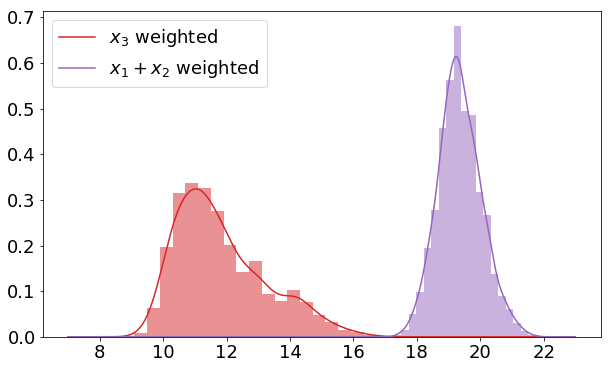

In [22]:
fig, ax = plt.subplots(figsize=(10,6))
#ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
#ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_sum[:,0],color='C3',w=interior_weights)
ax = plot_hist(ax,interior_points_sum[:,1],color='C4',w=interior_weights)
ax.legend(['$x_3$ weighted','$x_1+x_2$ weighted']);
#fig.xlabel('MW installed capacity')

### True Solution

In [23]:
data_detail_full = []
dim=10
old_volume = 0
epsilon = 1
while epsilon > 0.02:
    if len(data_detail_full)<=1 : # if only original solution exists, max/min directions are chosen
        directions = np.concatenate([np.diag(np.ones(4)),-np.diag(np.ones(4))],axis=0)
    else : # Otherwise search in directions normal to faces
        directions = np.array(hull.equations)[:,0:-1]
    # Itterate over directions in batch 
    for direction in directions:
        print(direction)
        #direction = np.concatenate([direction,[0]])
        network = network.copy()
        options = dict(dim=5,old_objective_value=old_objective_value)
        network.lopf(network.snapshots,                                 
                        solver_name='gurobi',                                 
                        extra_functionality=lambda network,                                 
                        snapshots: direction_search(network,snapshots,options,direction))

        data_detail_full.append(network.generators.p_nom_opt)
    

    hull = ConvexHull(data_detail_full)#,qhull_options='QJ')
    
    delta_v = hull.volume - old_volume
    old_volume = hull.volume
    epsilon = delta_v/hull.volume
    
    print(epsilon)


data_detail_full = np.array(data_detail_full)

[1. 0. 0. 0.]


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 0.0
  Upper bound: 0.0
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 0.0
  Upper bound: 0.0
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 13458.46957342357
  Upper bound: 13458.46957342357
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 1265.3259780069802
  Upper bound: 1265.3259780069802
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -10405.729498554907
  Upper bound: -10405.729498554907
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -22084.35619537062
  Upper bound: -22084.35619537062
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13424.05261537172
  Upper bound: -13424.05261537172
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.7660202730360328*generator_p_nom[DK offwind] - 0.42240797594577445*generator_p_nom[DK ocgt] - 0.34052956128241274*generator_p_nom[SE onwind] - 0.3447086611154455*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -13291.51925719919
  Upper bound: -13291.51925719919
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8587459814847036*generator_p_nom[DK offwind] - 0.03311947518089462*generator_p_nom[DK ocgt] + 0.4830481704227474*generator_p_nom[SE onwind] + 0.1676988512150617*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9198.771345687599
  Upper bound: 9198.771345687599
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8919035912579069*generator_p_nom[DK offwind] + 0.1409288575406106*generator_p_nom[DK ocgt] + 0.4059385398380463*generator_p_nom[SE onwind] + 0.14092885754061052*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9302.033755843917
  Upper bound: 9302.033755843917
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8333490082908632*generator_p_nom[DK offwind] - 0.24841848452720192*generator_p_nom[DK ocgt] - 0.4502453650843036*generator_p_nom[SE onwind] - 0.20272345238266187*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12626.968704692232
  Upper bound: -12626.968704692232
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8221832931720938*generator_p_nom[DK offwind] - 0.012297320321645842*generator_p_nom[DK ocgt] - 0.5656732657681572*generator_p_nom[SE onwind] + 0.06226688314654476*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12212.858723765357
  Upper bound: -12212.858723765357
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8373959198824155*generator_p_nom[DK offwind] + 0.3836291545208153*generator_p_nom[DK ocgt] + 0.06652380752461719*generator_p_nom[SE onwind] + 0.3836291545208153*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4928.709981507014
  Upper bound: 4928.709981507014
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.9309330635342294*generator_p_nom[DK offwind] + 0.14932866332553704*generator_p_nom[DK ocgt] + 0.33195607278892625*generator_p_nom[SE onwind] - 0.02949147786626029*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6013.761550231415
  Upper bound: 6013.761550231415
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.5464721632293004*generator_p_nom[DK offwind] - 0.5520440489739603*generator_p_nom[DK ocgt] - 0.3030889486608809*generator_p_nom[SE onwind] - 0.5520440489739625*generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15329.561867244878
  Upper bound: -15329.561867244878
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.9070381008503894*generator_p_nom[DK offwind] + 0.14317088075147721*generator_p_nom[DK ocgt] + 0.384873344995301*generator_p_nom[SE onwind] + 0.09304026452398582*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8390.107268968137
  Upper bound: 8390.107268968137
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8402048232019103*generator_p_nom[DK offwind] - 1.7317099321815644e-16*generator_p_nom[DK ocgt] - 0.5422691721536885*generator_p_nom[SE onwind] - 3.463419864363129e-16*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11975.66555161081
  Upper bound: -11975.66555161081
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8402048232019103*generator_p_nom[DK offwind] - 1.7317099321815644e-16*generator_p_nom[DK ocgt] - 0.5422691721536885*generator_p_nom[SE onwind] - 3.463419864363129e-16*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11975.66555161081
  Upper bound: -11975.66555161081
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.7744455317559323*generator_p_nom[DK offwind] - 0.38017733209954435*generator_p_nom[DK ocgt] + 0.5056671973748584*generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 5774.241708494741
  Upper bound: 5774.241708494741
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8587459814847036*generator_p_nom[DK offwind] - 0.03311947518089462*generator_p_nom[DK ocgt] + 0.4830481704227474*generator_p_nom[SE onwind] + 0.1676988512150617*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9198.771345687599
  Upper bound: 9198.771345687599
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8919035912579069*generator_p_nom[DK offwind] + 0.1409288575406106*generator_p_nom[DK ocgt] + 0.4059385398380463*generator_p_nom[SE onwind] + 0.14092885754061052*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 9302.033755843917
  Upper bound: 9302.033755843917
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8353414305024893*generator_p_nom[DK offwind] - 0.06864627916516952*generator_p_nom[DK ocgt] - 0.5454286230505623*generator_p_nom[SE onwind]
# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12304.922925843492
  Upper bound: -12304.922925843492
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solv

INFO:pypsa.opf:Optimization successful


Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Wall time: 0.0049915313720703125
  Error rc: 0
  Time: 0.172898530960083
# ----------------------------------------------------------
#   Solution Information
# ----------------------------------------------------------
Solution: 
- number of solutions: 0
  number of solutions displayed: 0
[-0.82218329 -0.01229732 -0.56567327  0.06226688]


INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8221832931720938*generator_p_nom[DK offwind] - 0.012297320321645842*generator_p_nom[DK ocgt] - 0.5656732657681572*generator_p_nom[SE onwind] + 0.06226688314654476*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -12212.858723765357
  Upper bound: -12212.858723765357
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model w

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.8373959198824155*generator_p_nom[DK offwind] + 0.3836291545208153*generator_p_nom[DK ocgt] + 0.06652380752461719*generator_p_nom[SE onwind] + 0.3836291545208153*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 4928.709981507014
  Upper bound: 4928.709981507014
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.9309330635342294*generator_p_nom[DK offwind] + 0.14932866332553704*generator_p_nom[DK ocgt] + 0.33195607278892625*generator_p_nom[SE onwind] - 0.02949147786626029*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 6013.761550231415
  Upper bound: 6013.761550231415
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


0.9070381008503894*generator_p_nom[DK offwind] + 0.14317088075147721*generator_p_nom[DK ocgt] + 0.384873344995301*generator_p_nom[SE onwind] + 0.09304026452398582*generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: 8390.107268968137
  Upper bound: 8390.107268968137
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal s

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- generator_p_nom[DK offwind]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -3747.161277896784
  Upper bound: -3747.161277896784
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optimal

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.5464721632293067*generator_p_nom[DK offwind] - 0.5520440489739578*generator_p_nom[DK ocgt] - 0.30308894866088243*generator_p_nom[SE onwind] - 0.5520440489739578*generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15329.561867244833
  Upper bound: -15329.561867244833
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.5464721632293067*generator_p_nom[DK offwind] - 0.5520440489739578*generator_p_nom[DK ocgt] - 0.30308894866088243*generator_p_nom[SE onwind] - 0.5520440489739578*generator_p_nom[SE ocgt]
# ==========================================================


INFO:pypsa.opf:Optimization successful


# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -15329.561867244833
  Upper bound: -15329.561867244833
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was solved to optimality (subject to tolerances), and an optim

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8402048232019103*generator_p_nom[DK offwind] - 1.7317099321815644e-16*generator_p_nom[DK ocgt] - 0.5422691721536885*generator_p_nom[SE onwind] - 3.463419864363129e-16*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11975.66555161081
  Upper bound: -11975.66555161081
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8402048232019103*generator_p_nom[DK offwind] - 1.7317099321815644e-16*generator_p_nom[DK ocgt] - 0.5422691721536885*generator_p_nom[SE onwind] - 3.463419864363129e-16*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11975.66555161081
  Upper bound: -11975.66555161081
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


-0.8402048232019103*generator_p_nom[DK offwind] - 1.7317099321815644e-16*generator_p_nom[DK ocgt] - 0.5422691721536885*generator_p_nom[SE onwind] - 3.463419864363129e-16*generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x76
  Lower bound: -11975.66555161081
  Upper bound: -11975.66555161081
  Number of objectives: 1
  Number of constraints: 143
  Number of variables: 76
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 76
  Number of nonzeros: 306
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was

In [24]:
hull_full = ConvexHull(data_detail_full)
interior_points_full = create_interior_points(hull_full,10000)

In [25]:
fig = go.Figure()



fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))

fig.add_trace(go.Scatter(x=data_detail_full[:,0]+data_detail_full[:,2],
                          y=data_detail_full[:,1]+data_detail_full[:,3],
                          #z=data_detail_sum[:,2],
                          mode='markers',name='MGA solutions'))

fig.add_trace(go.Scatter(x=[inital_solution[0]+inital_solution[2]],
                          y=[inital_solution[1]+inital_solution[3]],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Initial_solution'))

fig.add_trace(go.Scatter(x=interior_points_full[:,0]+interior_points_full[:,2],
                          y=interior_points_full[:,1]+interior_points_full[:,3],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Interrior_points'))
fig.update_yaxes(title_text='$x_3$')
fig.update_xaxes(title_text='$x_1+x_2$')

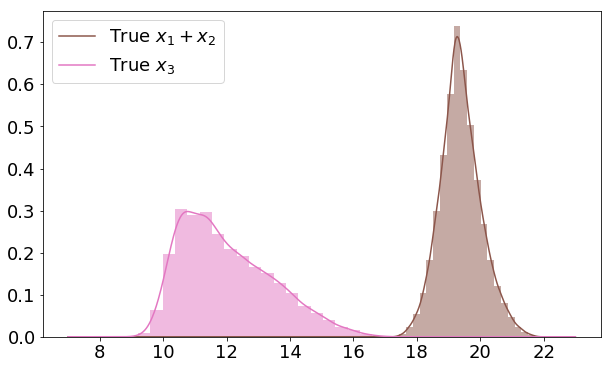

In [26]:
fig, ax = plt.subplots(figsize=(10,6))
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3],color='C6')
ax.legend(['True $x_1+x_2$','True $x_3$']);

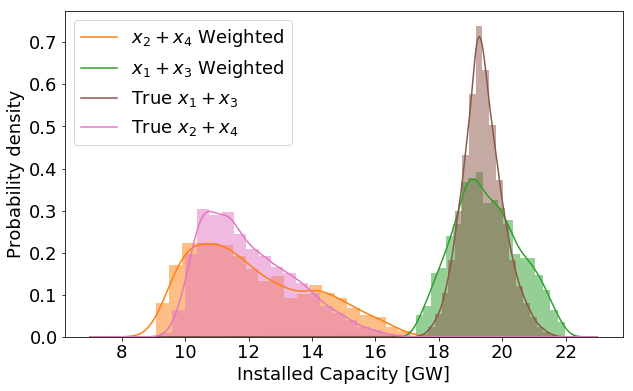

In [27]:
fig, ax = plt.subplots(figsize=(10,6))
ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3],color='C6')
ax.legend(['$x_2+x_4$ Weighted','$x_1+x_3$ Weighted','True $x_1+x_3$','True $x_2+x_4$']);
ax.set_xlabel('Installed Capacity [GW]')
ax.set_ylabel('Probability density')
fig.savefig("C:/Users\Tim\OneDrive - Aarhus universitet\Speciale\Report\Images\multi_4D_1.pdf", bbox_inches='tight')

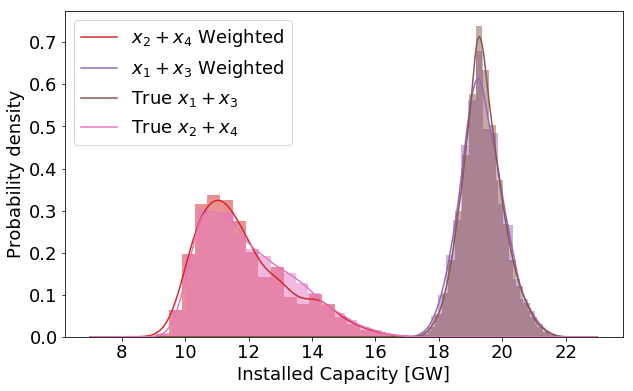

In [28]:
fig, ax = plt.subplots(figsize=(10,6))
#ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
#ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_sum[:,0],color='C3',w=interior_weights)
ax = plot_hist(ax,interior_points_sum[:,1],color='C4',w=interior_weights)
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3],color='C6')
ax.legend(['$x_2+x_4$ Weighted','$x_1+x_3$ Weighted','True $x_1+x_3$','True $x_2+x_4$']);
ax.set_xlabel('Installed Capacity [GW]')
ax.set_ylabel('Probability density')
fig.savefig("C:/Users\Tim\OneDrive - Aarhus universitet\Speciale\Report\Images\multi_4D_2.pdf", bbox_inches='tight')

### Visualization of problem

In [ ]:
n = 3
a1 = sample_points[n,0]
a2 = sample_points[n,1]
print(a1,a2)
s,t = np.meshgrid([1000,20000],[1001,20000])
s = np.reshape(s,[4])
t = np.reshape(t,[4])


In [ ]:
P1 = np.array([0,0.,a1])
A1 = np.array([1,0.,0])
B1 = np.array([0,1,0])

P2 = np.array([a2,0.,0])
A2 = np.array([0,-0.001,1])
B2 = np.array([-1,1,0])

In [ ]:
p1 = []
p2 = []
l1 = []
for i in range(len(s)):
    p1.append( P1 +s[i]*A1 + t[i]*B1 )
    p2.append( P2 +s[i]*A2 + t[i]*B2 )
    l1.append( P1 + A1*(P2-P1)/(A1-A2) + t[i]*(A1*(B2-B1)/(A1-A2)+B1) )
p1 = np.array(p1)
p2 = np.array(p2)
l1 = np.array(l1)

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter3d(x=data_detail_full[:,0],
                          y=data_detail_full[:,1],
                          z=data_detail_full[:,2],
                          mode='markers'))

fig.add_trace(go.Mesh3d(x=p1[:,0],y=p1[:,1],z=p1[:,2],opacity=0.5,color='yellow'))
fig.add_trace(go.Mesh3d(x=p2[:,0],y=p2[:,1],z=p2[:,2],opacity=0.5,delaunayaxis='x',color='yellow'))
fig.add_trace(go.Scatter3d(x=l1[:,0],y=l1[:,1],z=l1[:,2],opacity=1,mode='lines',line=dict(color='red',width=10)))


points = hull_full.points
for s in hull_full.simplices:
    s = np.append(s, s[0])  # Here we cycle back to the first coordinate
    fig.add_trace(go.Mesh3d(x=points[s, 0], 
                                y=points[s, 1], 
                                z=points[s, 2],
                                opacity=0.5,
                                color='pink'
                                ))
fig.update_layout(scene = dict(
                     xaxis = dict(nticks=4, range=[0,6000],),
                     yaxis = dict(nticks=4, range=[5000,22500],),
                     zaxis = dict(nticks=4, range=[8500,18000],),),
                 )

fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data_detail_full[:,0],
                          y=data_detail_full[:,1],
                          #z=data_detail_full[:,2],
                          mode='markers'))



fig.add_trace(go.Scatter(x=l1[:,0],
                         y=l1[:,1],
                         #z=l1[:,2],
                         opacity=1,mode='lines',line=dict(color='red',width=5)))

fig.update_yaxes(title_text='$x_2$',range=[10000,23000])
fig.update_xaxes(title_text='$x_1$',range=[-100,6000])
fig.show()

In [ ]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data_detail_full[:,0],
                          y=data_detail_full[:,2],
                          #z=data_detail_full[:,2],
                          mode='markers'))



fig.add_trace(go.Scatter(x=l1[:,0],
                         y=l1[:,2],
                         #z=l1[:,2],
                         opacity=1,mode='lines',line=dict(color='red',width=5)))

fig.update_yaxes(title_text='$x_3$',range=[7000,20000])
fig.update_xaxes(title_text='$x_1$',range=[-100,6000])
fig.show()